# **📚 1. IMPORT THƯ VIỆN CẦN THIẾT**

In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error

# Cài đặt chung cho matplotlib và seaborn
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

# **📚 2. ĐỌC DỮ LIỆU VÀ XỬ LÍ DỮ LIỆU**

In [66]:
# Đọc dữ liệu từ URL
DATA_PATH = "https://redcap.huph.edu.vn/ddp/tsa/nhom4.csv"
df = pd.read_csv(DATA_PATH, sep=',', decimal='.', na_values=-200)

# Chọn các cột cần thiết
cols = ['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
        'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)',
        'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']
df = df[cols]

# Chuyển đổi sang datetime và đặt làm index
df['Timestamp'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])
df = df.drop(columns=['Date', 'Time']).set_index('Timestamp')

# Xử lý giá trị thiếu
df = df.dropna()

# Hiển thị thông tin cơ bản
print("Shape:", df.shape)
print("\nInfo:")
print(df.info())
print("\n5 dòng đầu tiên:")
print(df.head())

Shape: (827, 13)

Info:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 827 entries, 2004-03-10 18:00:00 to 2004-05-01 00:00:00
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CO(GT)         827 non-null    float64
 1   PT08.S1(CO)    827 non-null    float64
 2   NMHC(GT)       827 non-null    float64
 3   C6H6(GT)       827 non-null    float64
 4   PT08.S2(NMHC)  827 non-null    float64
 5   NOx(GT)        827 non-null    float64
 6   PT08.S3(NOx)   827 non-null    float64
 7   NO2(GT)        827 non-null    float64
 8   PT08.S4(NO2)   827 non-null    float64
 9   PT08.S5(O3)    827 non-null    float64
 10  T              827 non-null    float64
 11  RH             827 non-null    float64
 12  AH             827 non-null    float64
dtypes: float64(13)
memory usage: 90.5 KB
None

5 dòng đầu tiên:
                     CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
Timestamp                     

# **📚 3. PLOT DỮ LIỆU THÔ**



## **📚📚 3.1 Plot chất dữ liệu ô nhiễm**


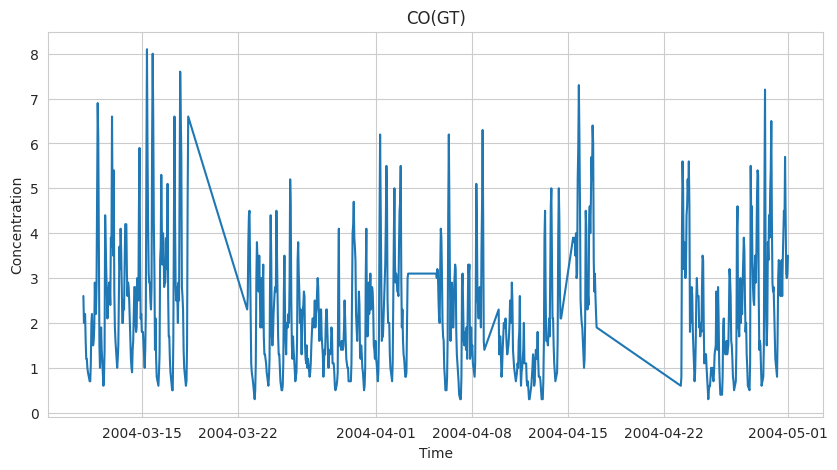
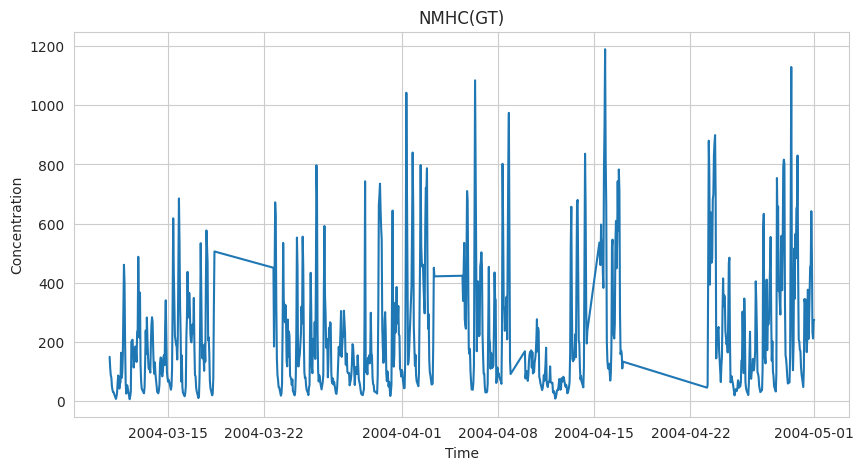
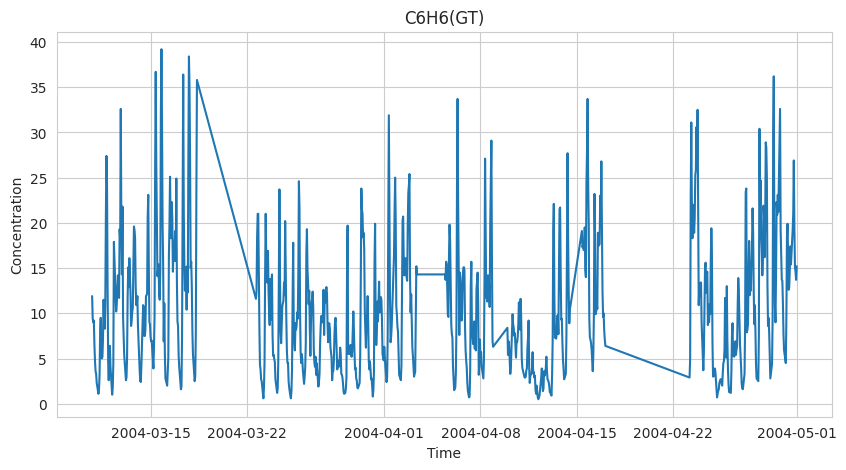
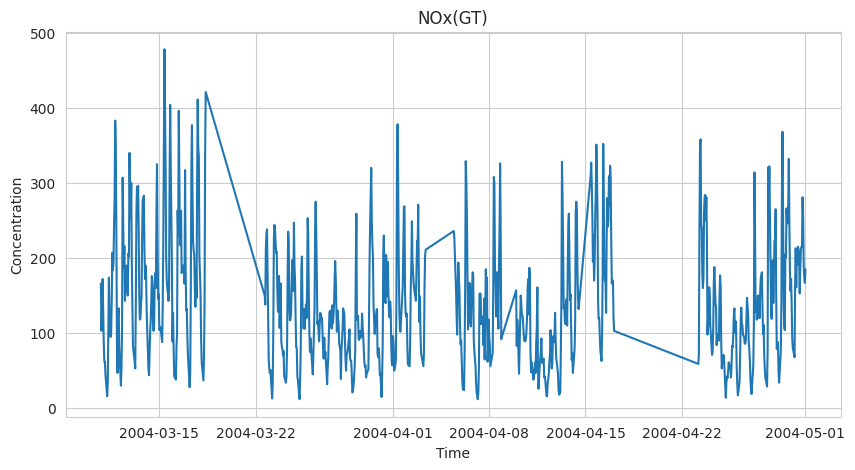
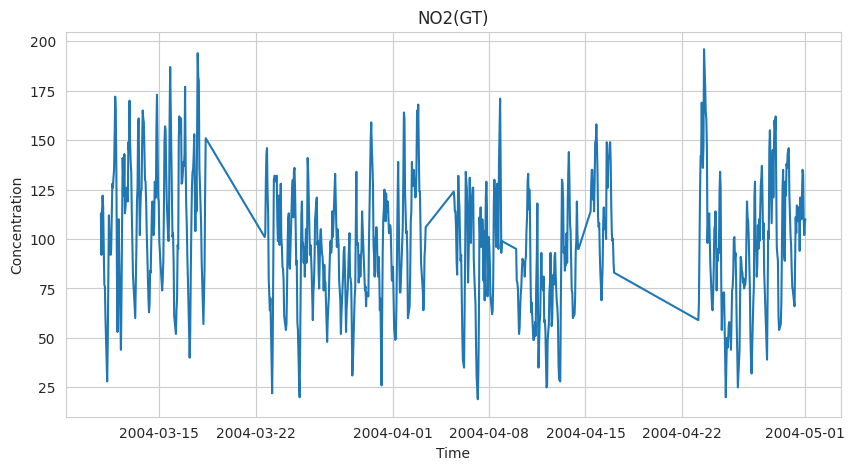

In [67]:
import matplotlib.pyplot as plt
import os
from IPython.display import HTML, display
import base64

# Tạo thư mục lưu ảnh
if not os.path.exists("charts"):
    os.makedirs("charts")

pollutants = ['CO(GT)', 'NMHC(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)']
image_tags = []

for col in pollutants:
    fig, ax = plt.subplots(figsize=(10, 5))  # 👉 Kích thước lớn hơn (ngang 10 inch)
    ax.plot(df.index, df[col], linewidth=1.5)
    ax.set_title(col)
    ax.set_xlabel('Time')
    ax.set_ylabel('Concentration')
    ax.grid(True)

    filename = f"charts/{col}.png"
    plt.savefig(filename, bbox_inches='tight')  # 👉 Lưu gọn sát nội dung
    plt.close(fig)

    with open(filename, "rb") as f:
        img_data = base64.b64encode(f.read()).decode("utf-8")
        # 👉 Ảnh hiển thị rộng hơn: 700px
        img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right: 30px; border:1px solid #ccc; width: 700px"/>'
        image_tags.append(img_tag)

# 👉 HTML xếp ảnh ngang, cuộn ngang được
html_code = '<div style="display: flex; overflow-x: auto;">' + "".join(image_tags) + '</div>'
display(HTML(html_code))


## **📚📚 3.2 Plot thời tiết**


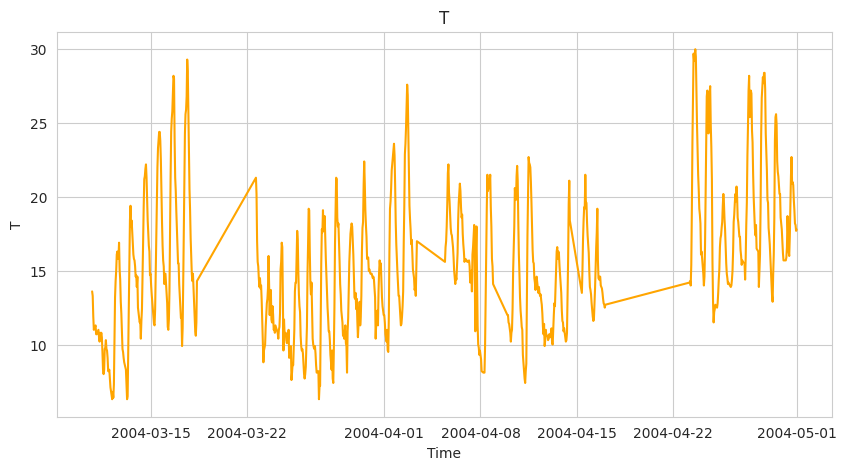
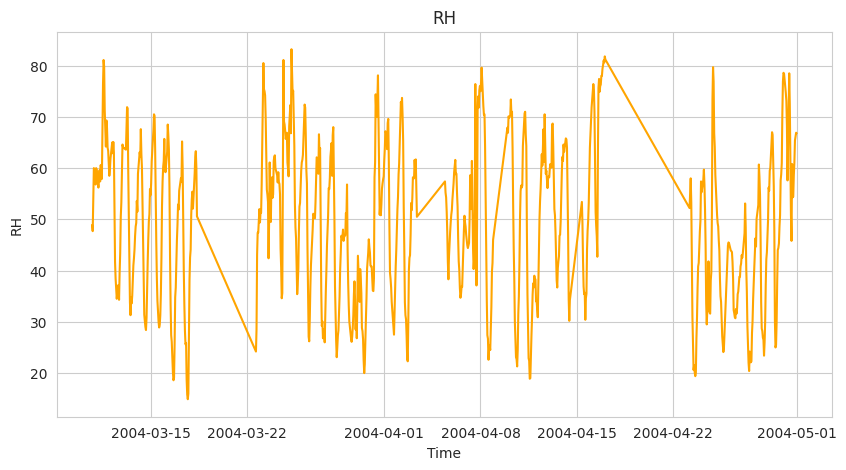
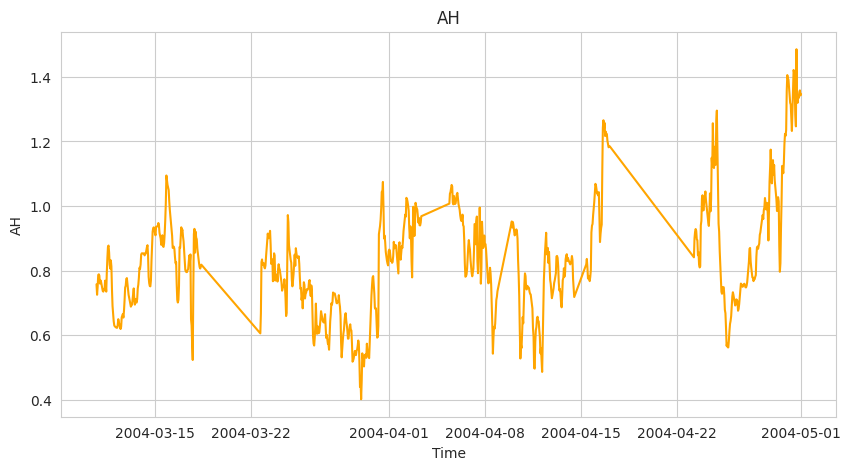

In [68]:
import matplotlib.pyplot as plt
import os
from IPython.display import HTML, display
import base64

# Tạo thư mục lưu ảnh nếu chưa có
if not os.path.exists("charts"):
    os.makedirs("charts")

meteo = ['T', 'RH', 'AH']
image_tags = []

for col in meteo:
    fig, ax = plt.subplots(figsize=(10, 5))  # Kích thước ảnh ngang 10 inch, cao 5 inch
    ax.plot(df.index, df[col], color='orange', linewidth=1.5)
    ax.set_title(col)
    ax.set_xlabel('Time')
    ax.set_ylabel(col)
    ax.grid(True)

    filename = f"charts/{col}.png"
    plt.savefig(filename, bbox_inches='tight')  # Lưu ảnh gọn sát nội dung
    plt.close(fig)  # Đóng ảnh để tránh tốn bộ nhớ

    with open(filename, "rb") as f:
        img_data = base64.b64encode(f.read()).decode("utf-8")
        img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right: 30px; border:1px solid #ccc; width: 700px"/>'
        image_tags.append(img_tag)

# Tạo HTML để hiển thị ảnh theo hàng ngang và có thể cuộn ngang
html_code = '<div style="display: flex; overflow-x: auto;">' + "".join(image_tags) + '</div>'
display(HTML(html_code))


## **📚📚 3.3 Plot sensor**


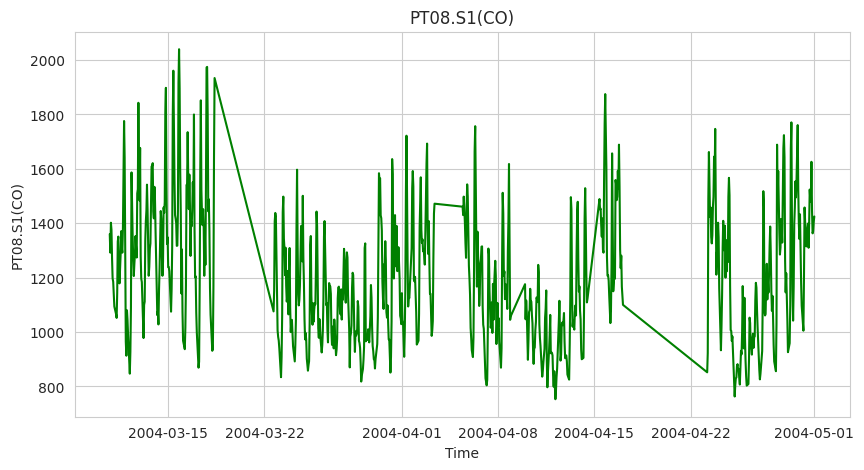
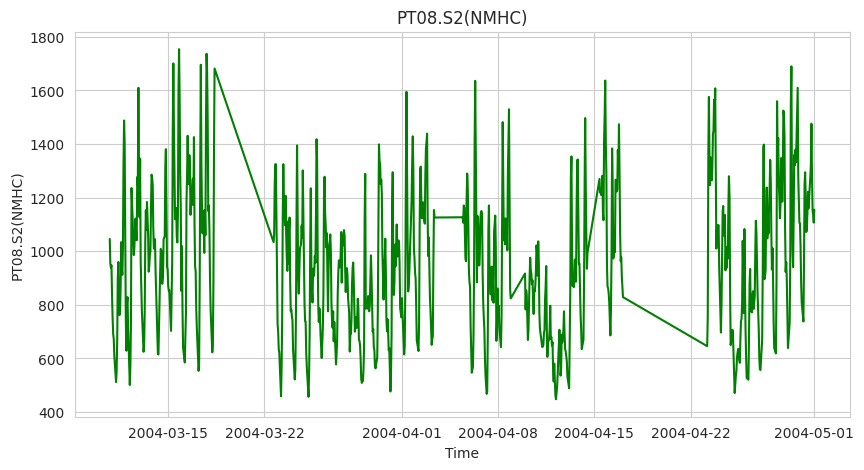
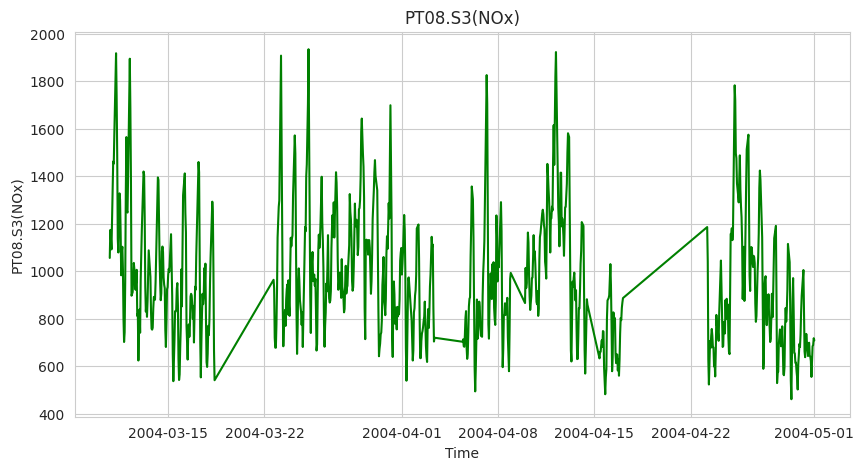
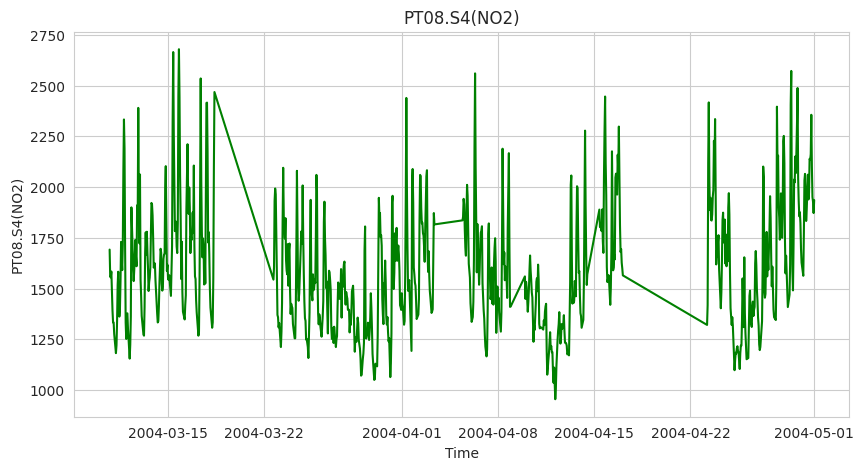
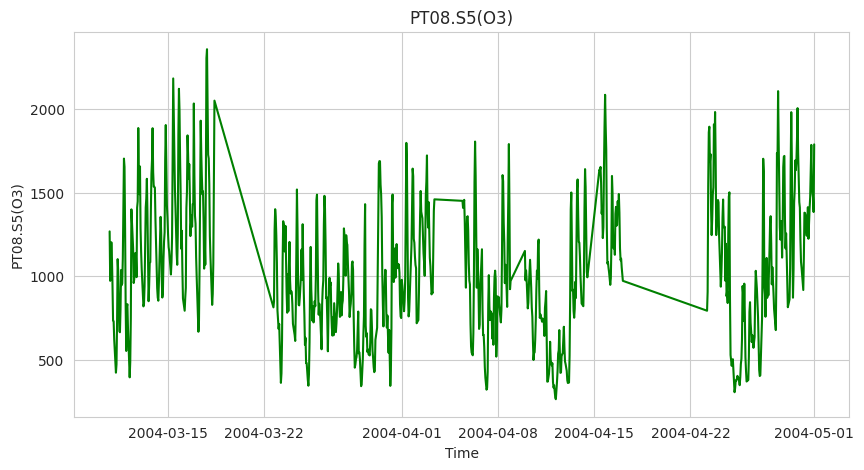

In [69]:
import matplotlib.pyplot as plt
import os
from IPython.display import HTML, display
import base64

# Tạo thư mục lưu ảnh nếu chưa có
if not os.path.exists("charts"):
    os.makedirs("charts")

sensors = ['PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)']
image_tags = []

for col in sensors:
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(df.index, df[col], color='green', linewidth=1.5)
    ax.set_title(col)
    ax.set_xlabel('Time')
    ax.set_ylabel(col)
    ax.grid(True)

    filename = f"charts/{col}.png"
    plt.savefig(filename, bbox_inches='tight')
    plt.close(fig)

    with open(filename, "rb") as f:
        img_data = base64.b64encode(f.read()).decode("utf-8")
        img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right: 30px; border:1px solid #ccc; width: 700px"/>'
        image_tags.append(img_tag)

html_code = '<div style="display: flex; overflow-x: auto;">' + "".join(image_tags) + '</div>'
display(HTML(html_code))


# **📚 4. PHÂN TÍCH THÀNH PHẦN MÙA VỤ (SEASONAL DECOMPOSITION)**


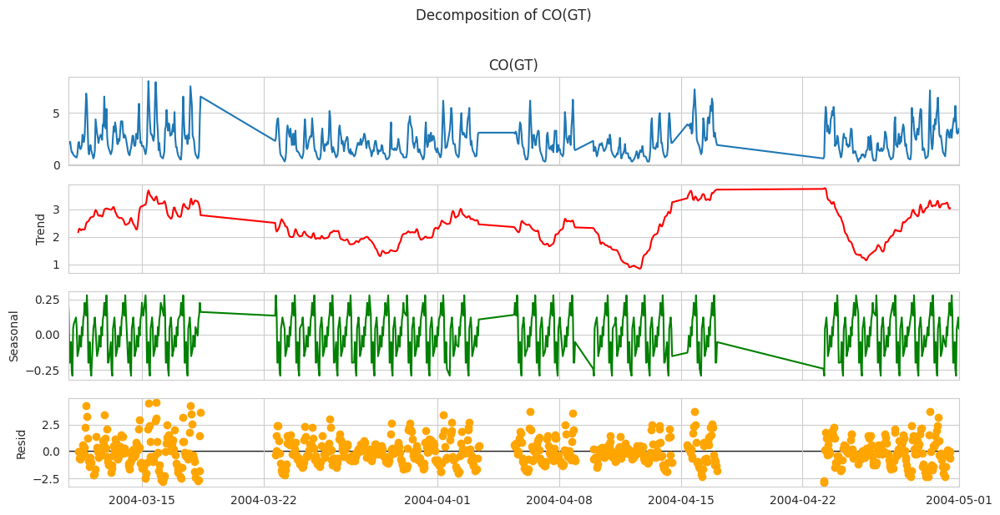
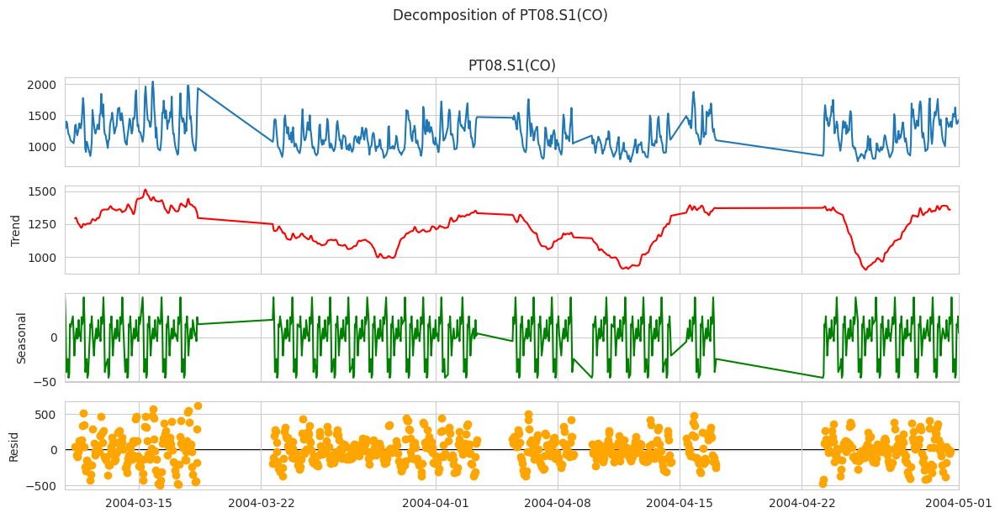
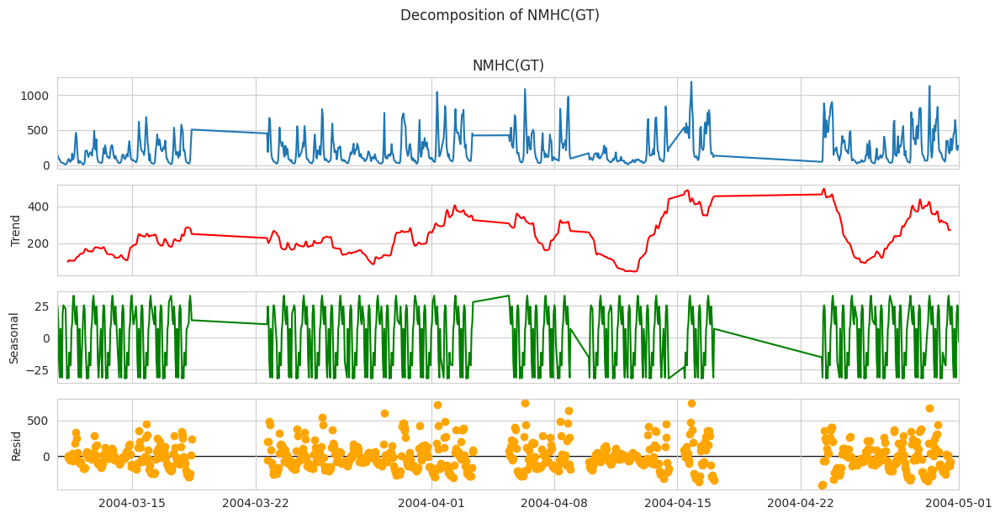
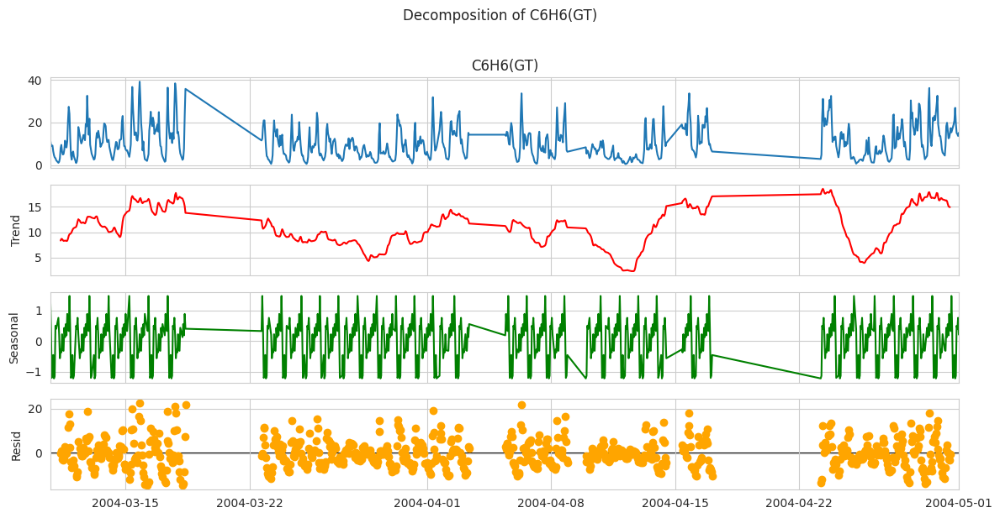
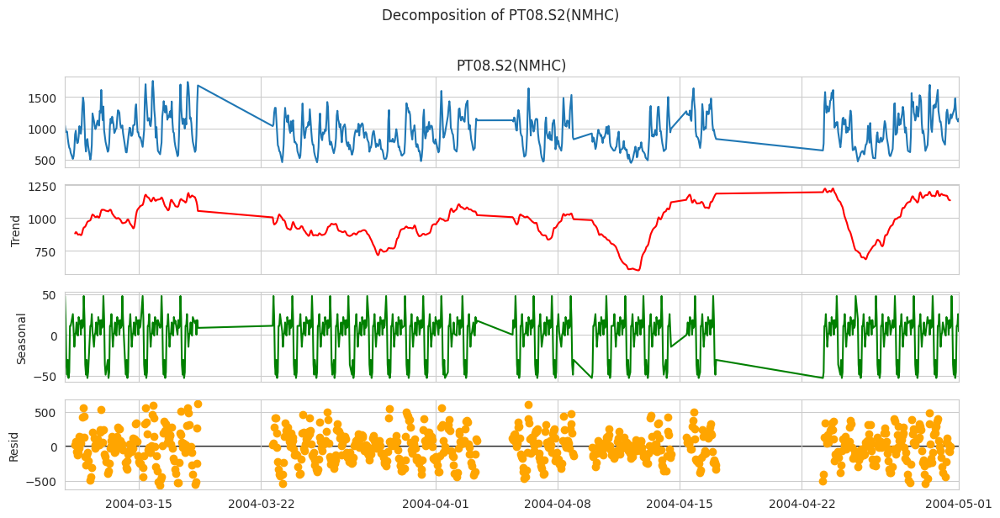
...
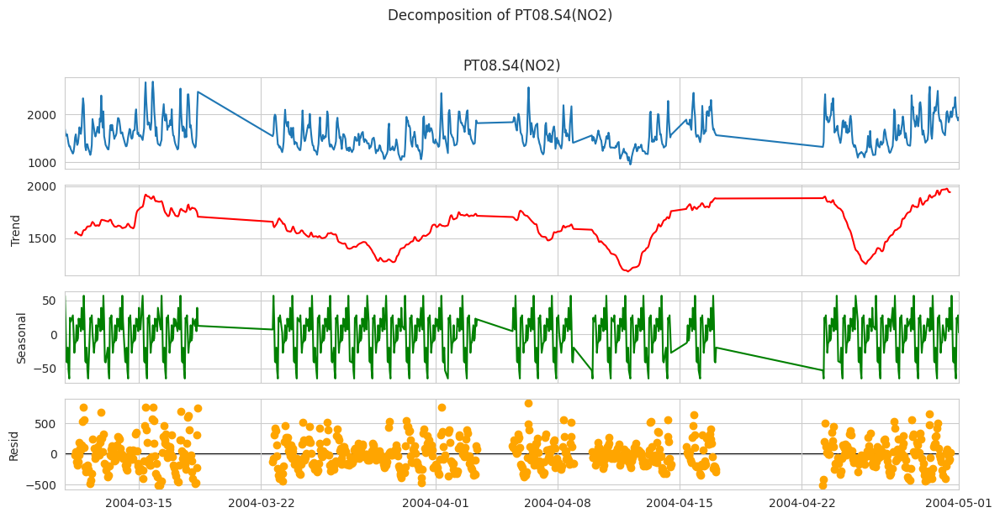
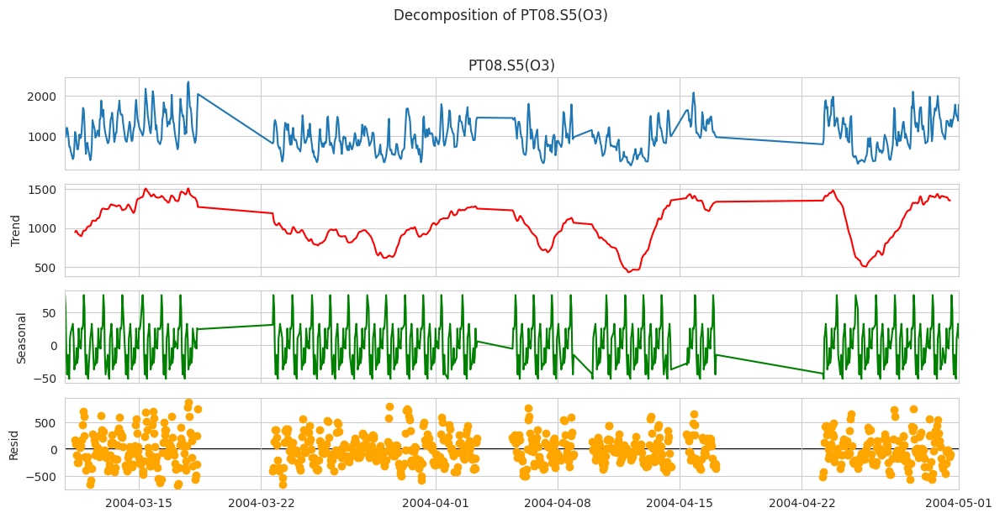
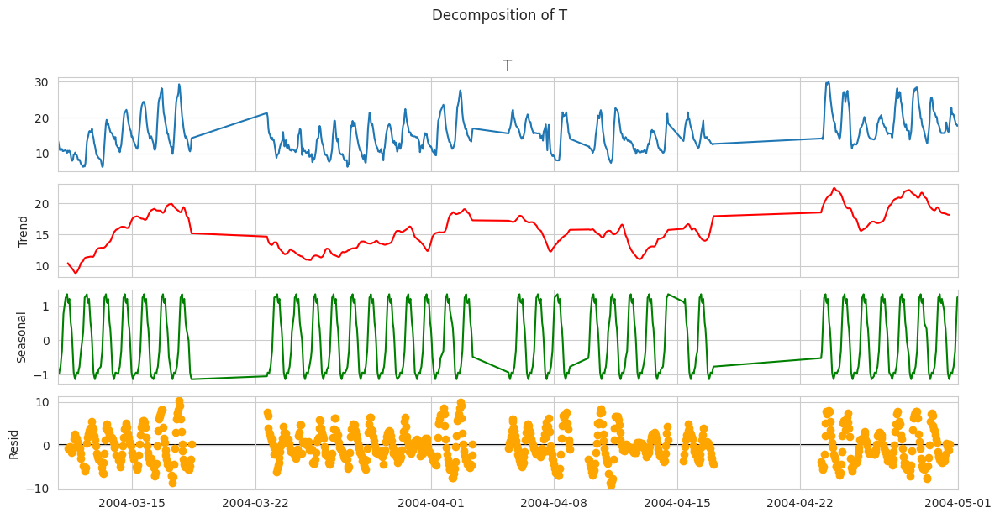
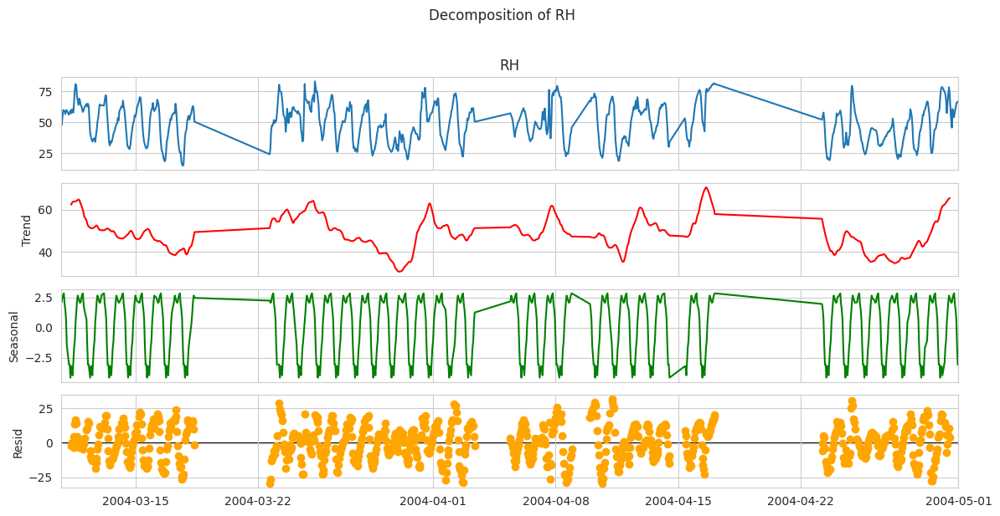
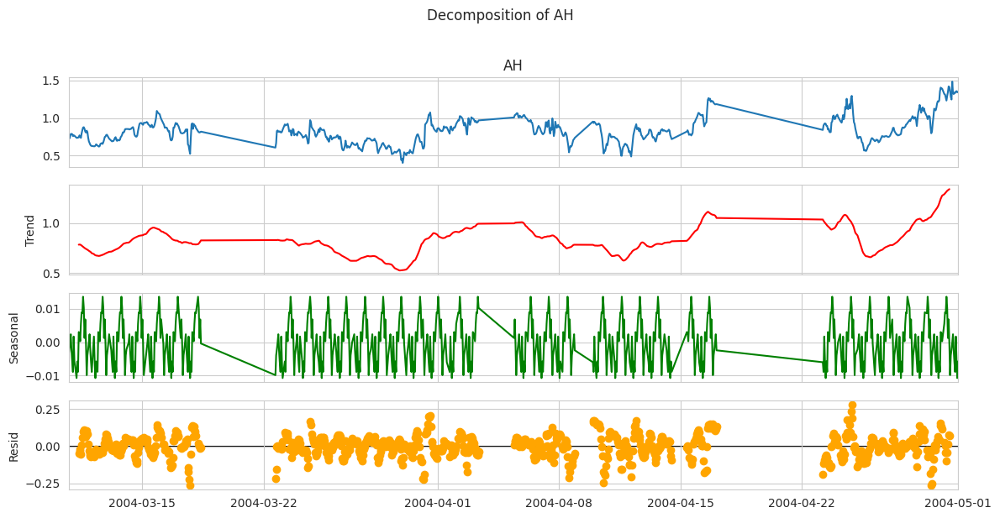

In [70]:
import matplotlib.pyplot as plt
import os
from IPython.display import HTML, display
import base64
from statsmodels.tsa.seasonal import seasonal_decompose

# Tạo thư mục lưu ảnh decomposition nếu chưa có
if not os.path.exists("charts/decomposition"):
    os.makedirs("charts/decomposition")

image_tags = []

for col in df.columns:
    series = df[col].dropna()
    if len(series) >= 48:  # Đảm bảo đủ dữ liệu cho decomposition
        try:
            result = seasonal_decompose(series, model='additive', period=24)

            # Vẽ decomposition mặc định
            fig = result.plot()
            fig.suptitle(f"Decomposition of {col}", y=1.02)

            # Lấy axes (4 trục)
            axes = fig.get_axes()

            # Giữ màu observed mặc định (thường là xanh dương), đổi màu các line sau
            # trend -> đỏ
            axes[1].lines[0].set_color('red')
            # seasonal -> xanh lá
            axes[2].lines[0].set_color('green')
            # residual -> cam
            axes[3].lines[0].set_color('orange')

            # Thêm grid cho rõ hơn (tuỳ chọn)
            for ax in axes:
                ax.grid(True)

            plt.tight_layout()

            # Lưu file
            filename = f"charts/decomposition/{col}_decomp.png"
            plt.savefig(filename, bbox_inches='tight')
            plt.close(fig)

            # Mã hóa ảnh để hiển thị trong HTML
            with open(filename, "rb") as f:
                img_data = base64.b64encode(f.read()).decode("utf-8")
                img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right: 30px; border:1px solid #ccc; width: 700px"/>'
                image_tags.append(img_tag)

        except Exception as e:
            print(f"⚠ Không thể decomposition biến {col}: {e}")
    else:
        print(f"⚠ Biến {col} không đủ dữ liệu để decomposition (ít hơn 48 quan sát).")

# Hiển thị tất cả ảnh decomposition theo hàng ngang có thể cuộn ngang
html_code = '<div style="display: flex; overflow-x: auto;">' + "".join(image_tags) + '</div>'
display(HTML(html_code))


# **📚 5. KIỂM TRA TÍNH DỪNG (ADF TEST)**

In [71]:
for col in df.columns:
    series = df[col].dropna()
    if len(series) > 0:
        try:
            result = adfuller(series)
            print(f"\nVariable: {col}")
            print(f'ADF Statistic: {result[0]:.4f}')
            print(f'p-value: {result[1]:.4f}')
            print('Critical Values:')
            for key, value in result[4].items():
                print(f'   {key}: {value:.4f}')
            if result[1] > 0.05:
                print("=> Chuỗi không dừng (non-stationary)")
            else:
                print("=> Chuỗi dừng (stationary)")
        except Exception as e:
            print(f"⚠ Không thể kiểm tra ADF cho biến {col}: {e}")
    else:
        print(f"⚠ Biến {col} không có dữ liệu để kiểm tra ADF.")



Variable: CO(GT)
ADF Statistic: -2.3366
p-value: 0.1604
Critical Values:
   1%: -3.4385
   5%: -2.8651
   10%: -2.5687
=> Chuỗi không dừng (non-stationary)

Variable: PT08.S1(CO)
ADF Statistic: -1.7679
p-value: 0.3965
Critical Values:
   1%: -3.4385
   5%: -2.8651
   10%: -2.5687
=> Chuỗi không dừng (non-stationary)

Variable: NMHC(GT)
ADF Statistic: -2.7028
p-value: 0.0735
Critical Values:
   1%: -3.4385
   5%: -2.8651
   10%: -2.5687
=> Chuỗi không dừng (non-stationary)

Variable: C6H6(GT)
ADF Statistic: -2.2617
p-value: 0.1846
Critical Values:
   1%: -3.4385
   5%: -2.8651
   10%: -2.5687
=> Chuỗi không dừng (non-stationary)

Variable: PT08.S2(NMHC)
ADF Statistic: -2.2452
p-value: 0.1903
Critical Values:
   1%: -3.4385
   5%: -2.8651
   10%: -2.5687
=> Chuỗi không dừng (non-stationary)

Variable: NOx(GT)
ADF Statistic: -2.3785
p-value: 0.1479
Critical Values:
   1%: -3.4385
   5%: -2.8651
   10%: -2.5687
=> Chuỗi không dừng (non-stationary)

Variable: PT08.S3(NOx)
ADF Statistic: -2

# **📚 6. PHÉP SAI PHÂN (DIFFERENCING)**



=== PHÉP SAI PHÂN & VẼ BIỂU ĐỒ CHO TỪNG BIẾN (2004-03-15 đến 2004-03-20) ===

Biến CO(GT) **đã dừng**, p-value: 0.0000


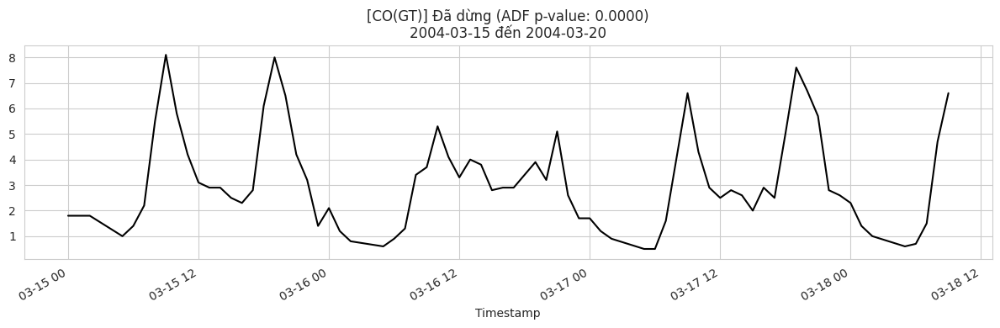


Biến PT08.S1(CO) **đã dừng**, p-value: 0.0062


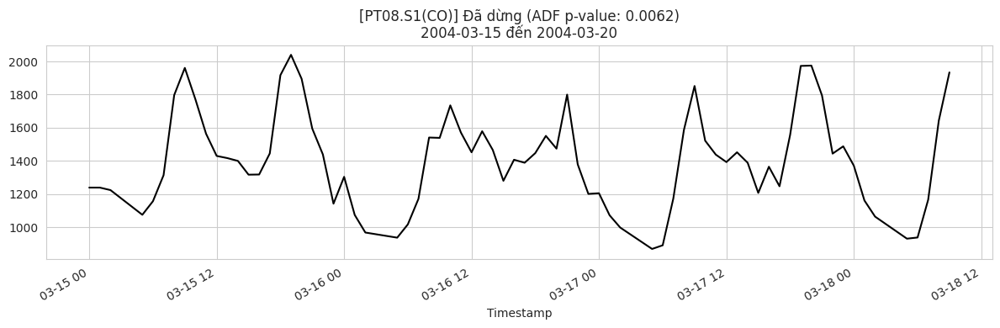


Biến NMHC(GT) **đã dừng**, p-value: 0.0000


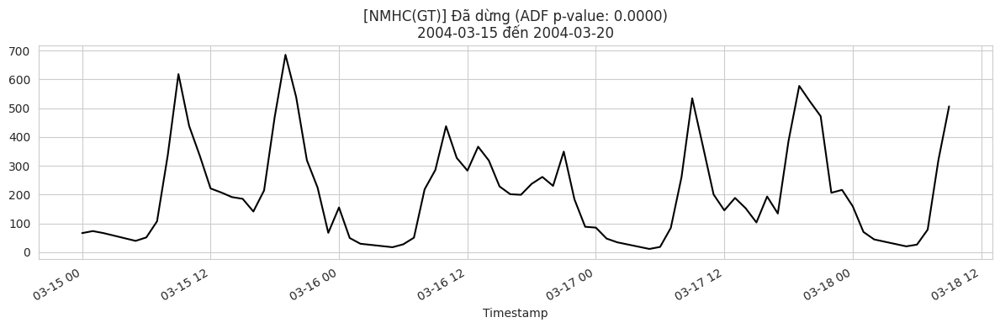


Biến C6H6(GT) **đã dừng**, p-value: 0.0000


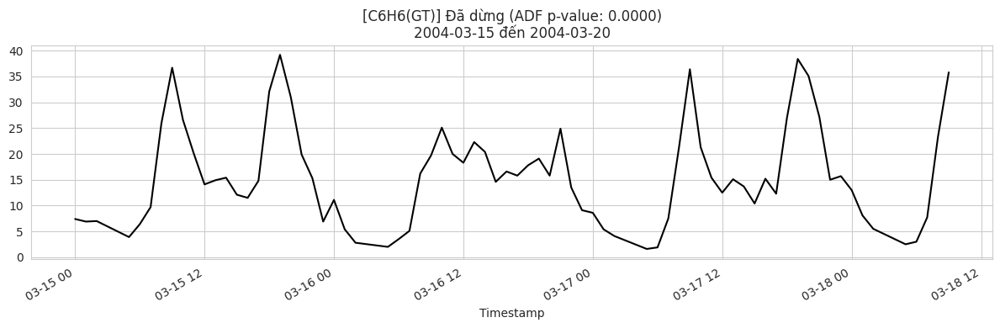


Biến PT08.S2(NMHC) **đã dừng**, p-value: 0.0039


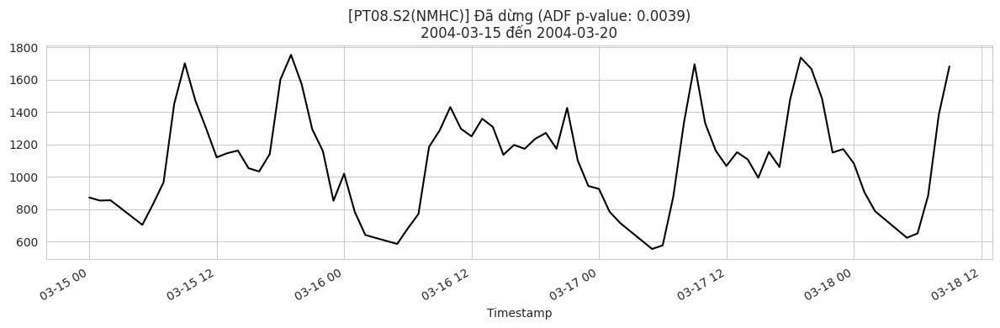


Biến NOx(GT) **đã dừng**, p-value: 0.0000


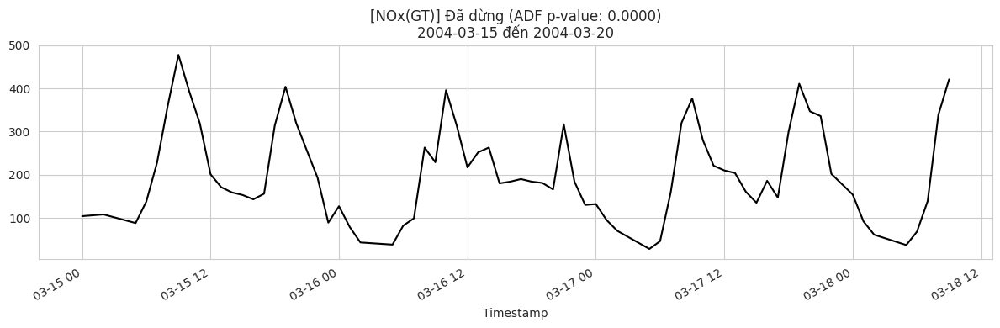


Biến PT08.S3(NOx) **đã dừng**, p-value: 0.0000


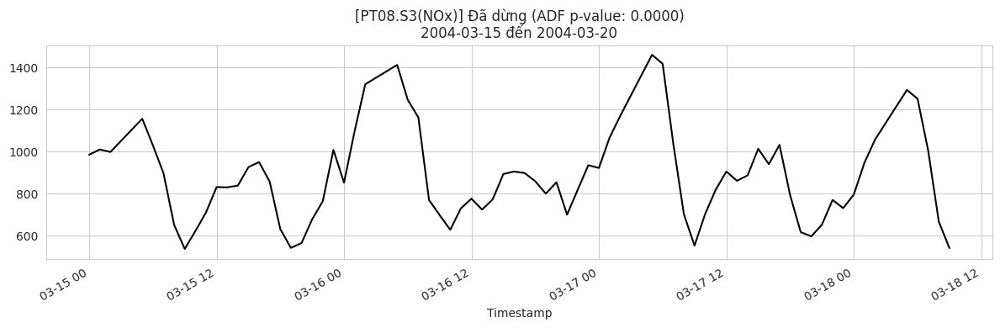


Biến NO2(GT) **đã dừng**, p-value: 0.0000


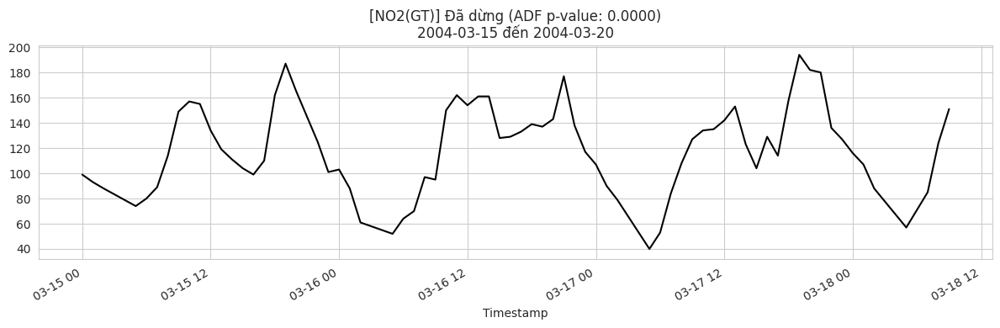


Biến PT08.S4(NO2) **không dừng**, p-value: 0.2677 → áp dụng sai phân...
ADF sau sai phân: -6.4294, p-value: 0.0000


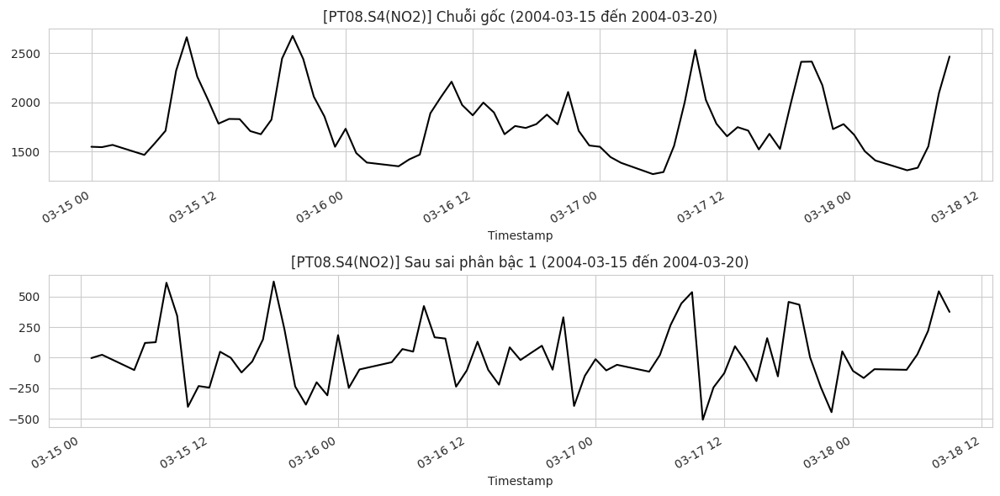


Biến PT08.S5(O3) **đã dừng**, p-value: 0.0000


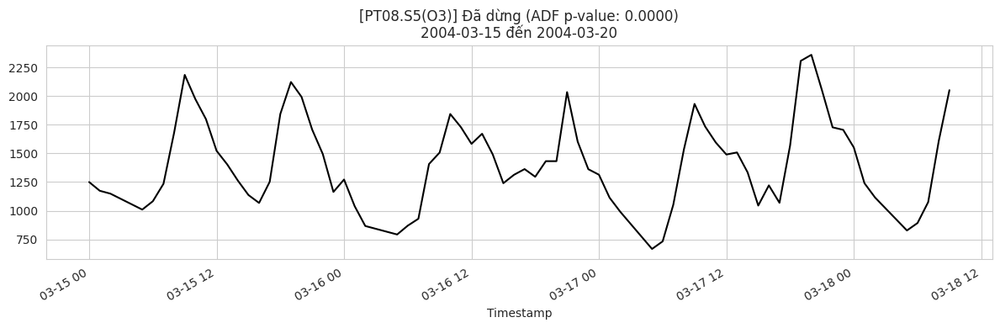


Biến T **đã dừng**, p-value: 0.0000


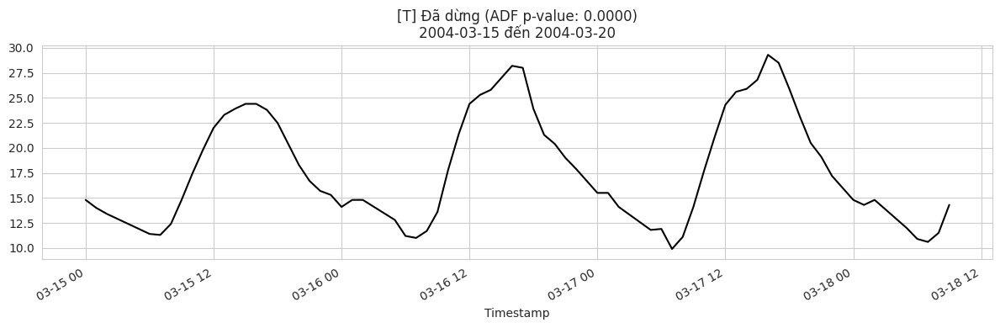


Biến RH **đã dừng**, p-value: 0.0000


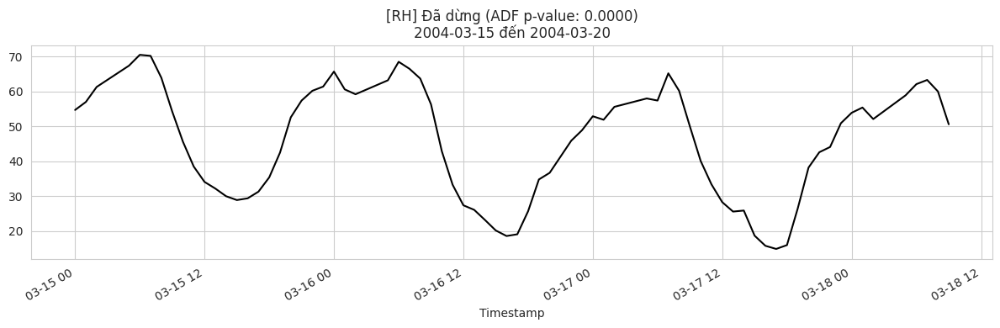


Biến AH **đã dừng**, p-value: 0.0427


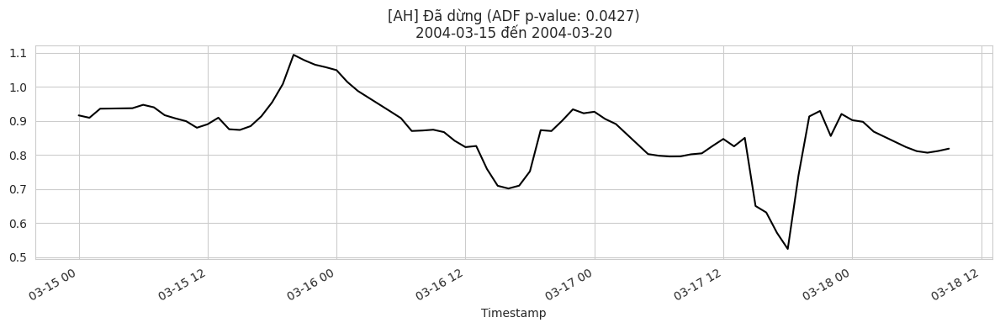

In [89]:
print("\n\n=== PHÉP SAI PHÂN & VẼ BIỂU ĐỒ CHO TỪNG BIẾN (2004-03-15 đến 2004-03-20) ===")

def apply_differencing(series, order=1, seasonal_order=None, seasonal_period=24):
    """Áp dụng sai phân thường và sai phân thời vụ nếu cần"""
    diff_series = series.copy()
    for _ in range(order):
        diff_series = diff_series.diff().dropna()
    if seasonal_order is not None:
        for _ in range(seasonal_order):
            diff_series = diff_series.diff(seasonal_period).dropna()
    return diff_series

# Lọc dữ liệu trong khoảng thời gian mong muốn
time_range = (df.index >= start_date) & (df.index <= end_date)
df_period = df.loc[time_range]

for col in df_period.columns:
    try:
        series = df_period[col].dropna()

        # Kiểm tra tính dừng ban đầu
        result = adfuller(series)
        pvalue = result[1]

        print(f"\nBiến {col} ", end='')
        if pvalue > 0.05:
            print(f"**không dừng**, p-value: {pvalue:.4f} → áp dụng sai phân...")
            diff_series = apply_differencing(series, order=1)
            diff_series = diff_series[(diff_series.index >= start_date) & (diff_series.index <= end_date)]

            # Kiểm tra lại tính dừng sau sai phân
            result_diff = adfuller(diff_series.dropna())
            print(f"ADF sau sai phân: {result_diff[0]:.4f}, p-value: {result_diff[1]:.4f}")

            # Vẽ cả chuỗi gốc và chuỗi sai phân (line màu đen)
            fig, axes = plt.subplots(2, 1, figsize=(12, 6))
            series.plot(ax=axes[0], title=f"[{col}] Chuỗi gốc ({start_date} đến {end_date})", color='black')
            if not diff_series.empty:
                diff_series.plot(ax=axes[1], title=f"[{col}] Sau sai phân bậc 1 ({start_date} đến {end_date})", color='black')
            else:
                axes[1].text(0.5, 0.5, 'Không đủ dữ liệu sau sai phân',
                            ha='center', va='center', transform=axes[1].transAxes)
            plt.tight_layout()
            plt.show()

        else:
            print(f"**đã dừng**, p-value: {pvalue:.4f}")
            # Vẽ biểu đồ chuỗi gốc (line màu đen)
            plt.figure(figsize=(12, 4))
            series.plot(title=f"[{col}] Đã dừng (ADF p-value: {pvalue:.4f})\n{start_date} đến {end_date}", color='black')
            plt.grid(True)
            plt.tight_layout()
            plt.show()

    except Exception as e:
        print(f"Lỗi với biến {col}: {str(e)}")

# **📚 7. VẼ ACF & PACF**


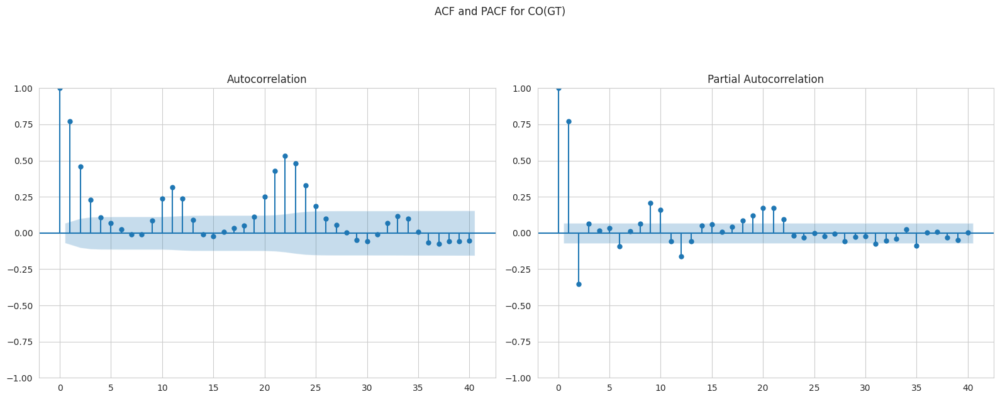
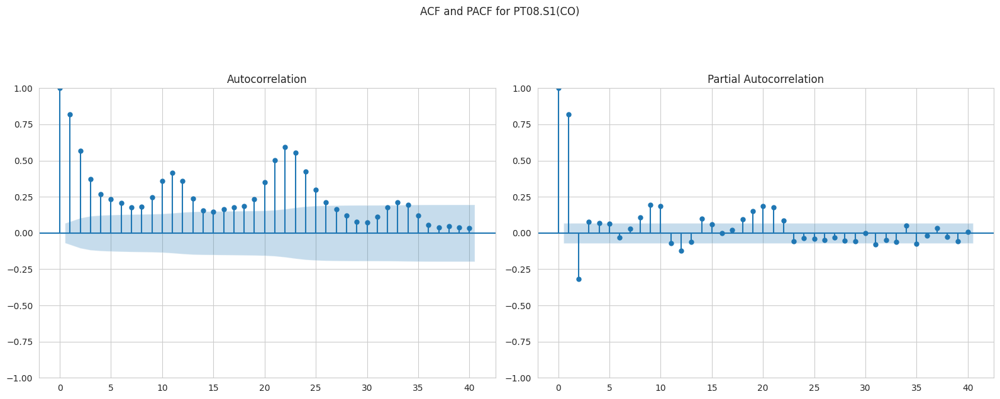
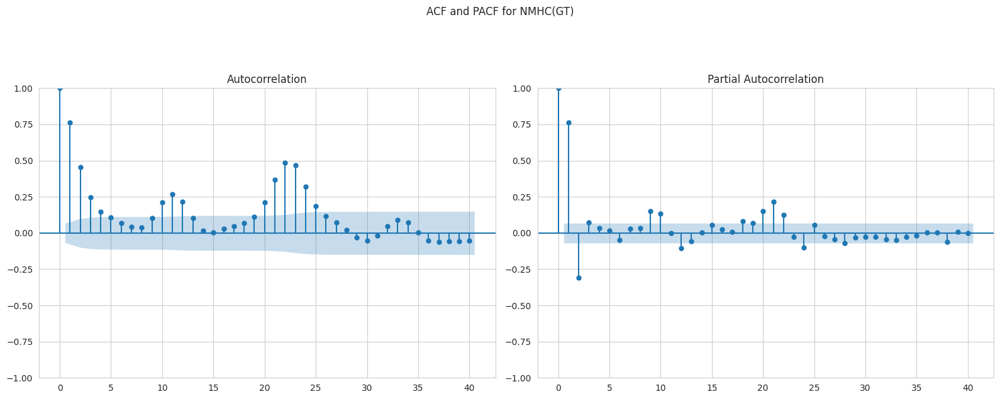
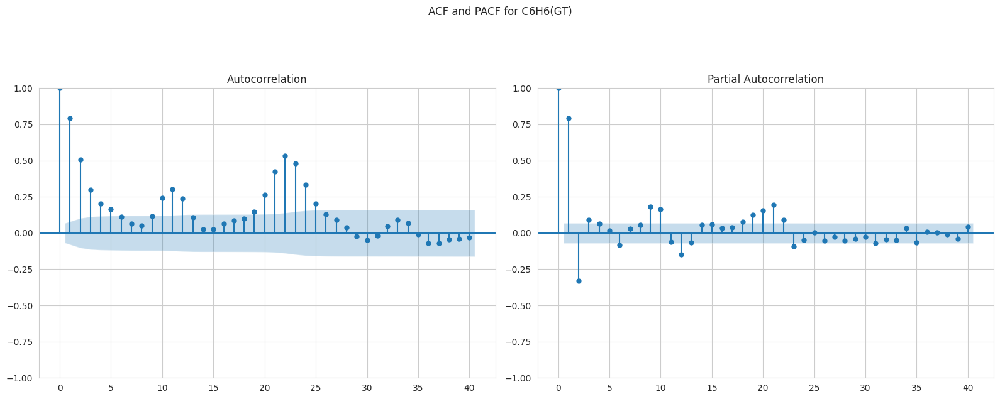
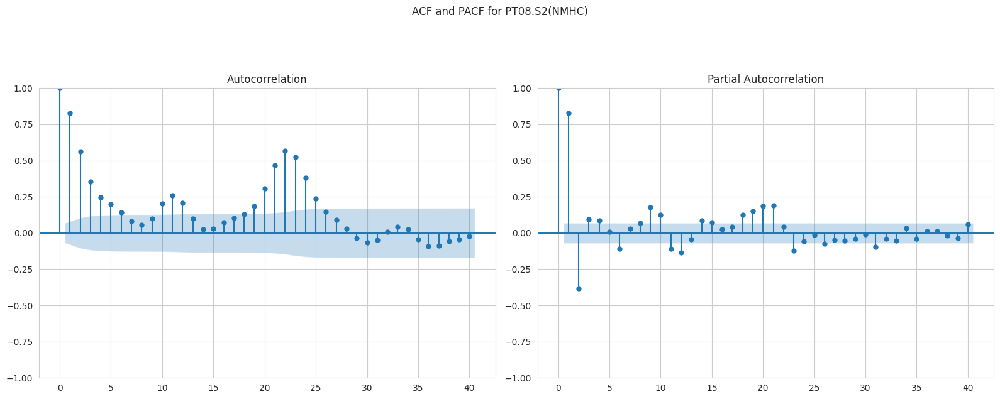
...
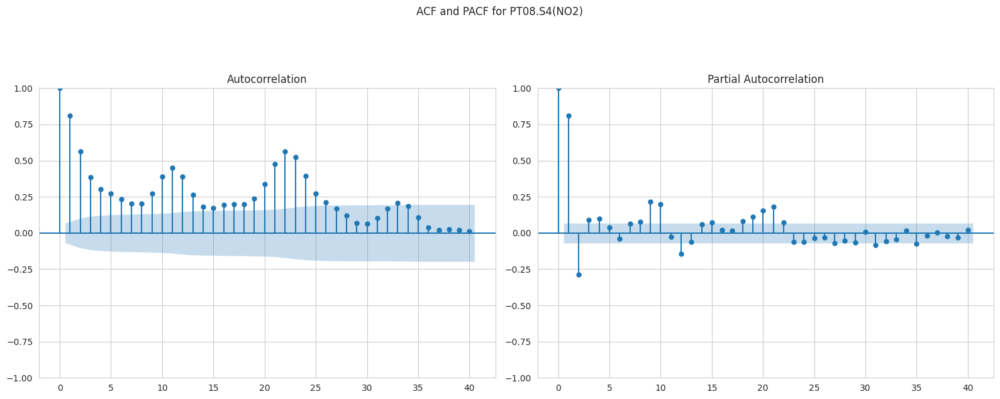
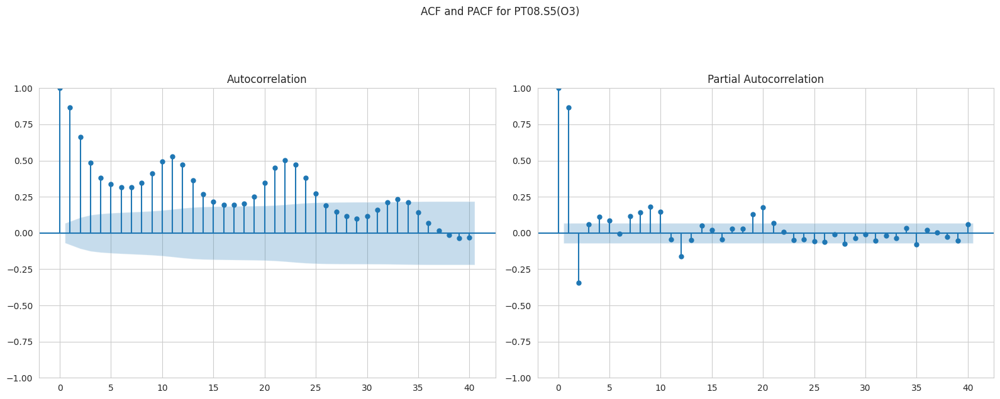
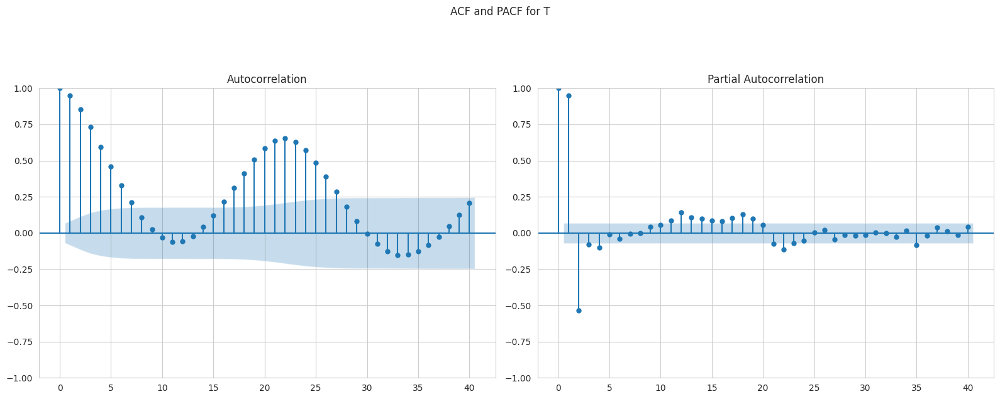
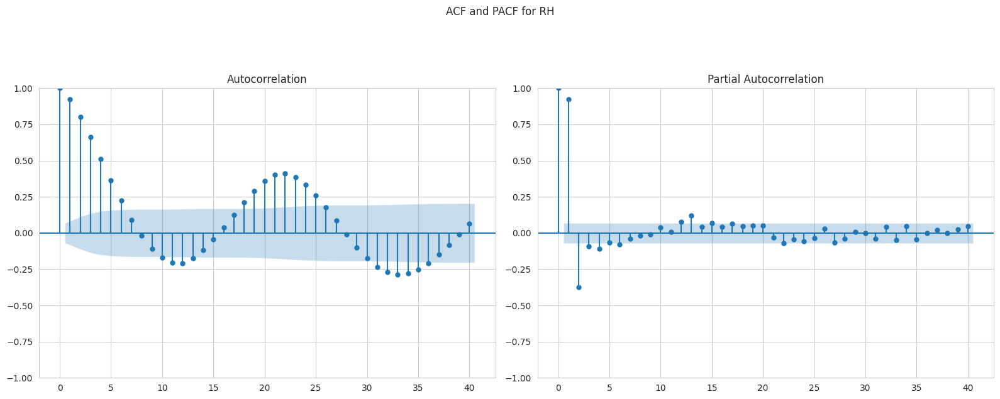
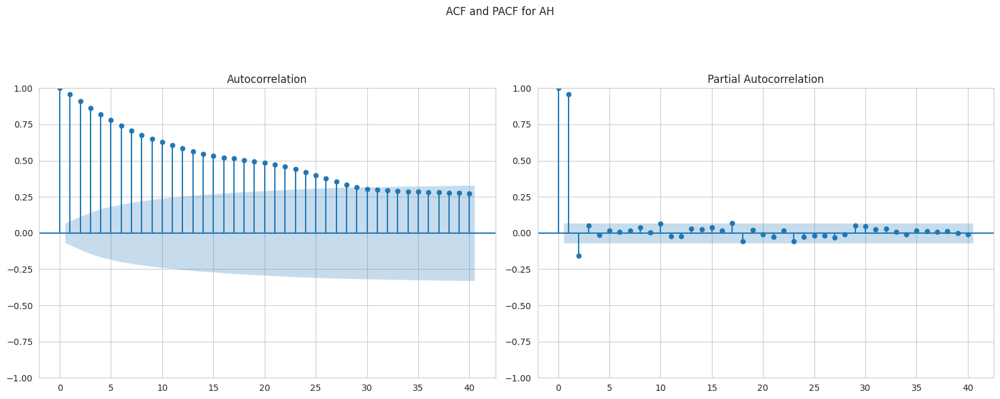

In [72]:
import matplotlib.pyplot as plt
import os
from IPython.display import HTML, display
import base64
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Tạo thư mục lưu ảnh ACF_PACF nếu chưa có
if not os.path.exists("charts/acf_pacf"):
    os.makedirs("charts/acf_pacf")

image_tags = []


for col in df.columns:
    series = df[col].dropna()
    if len(series) >= 50:  # Đảm bảo đủ dữ liệu để vẽ ACF, PACF
        try:
            fig, axes = plt.subplots(1, 2, figsize=(16, 6))

            fig.suptitle(f"ACF and PACF for {col}", y=1.05)

            plot_acf(series, ax=axes[0], lags=40)
            plot_pacf(series, ax=axes[1], lags=40, method='ywmle')

            plt.tight_layout(rect=[0, 0, 1, 0.95])  # Giữ chỗ cho tiêu đề

            filename = f"charts/acf_pacf/{col}_acf_pacf.png"
            plt.savefig(filename, bbox_inches='tight')
            plt.close(fig)

            with open(filename, "rb") as f:
                img_data = base64.b64encode(f.read()).decode("utf-8")
                img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right: 30px; border:1px solid #ccc; width: 750px"/>'
                image_tags.append(img_tag)

        except Exception as e:
            print(f"⚠ Không thể vẽ ACF/PACF cho biến {col}: {e}")
    else:
        print(f"⚠ Biến {col} không đủ dữ liệu để vẽ ACF/PACF.")

html_code = '<div style="display: flex; overflow-x: auto;">' + "".join(image_tags) + '</div>'
display(HTML(html_code))



# **📚 8. MOVING AVERAGE (TRUNG BÌNH TRƯỢT 24h)**


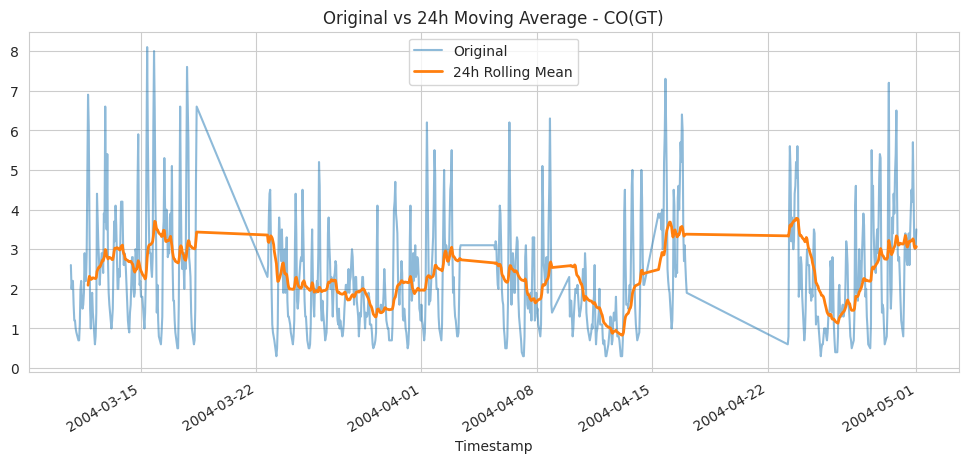
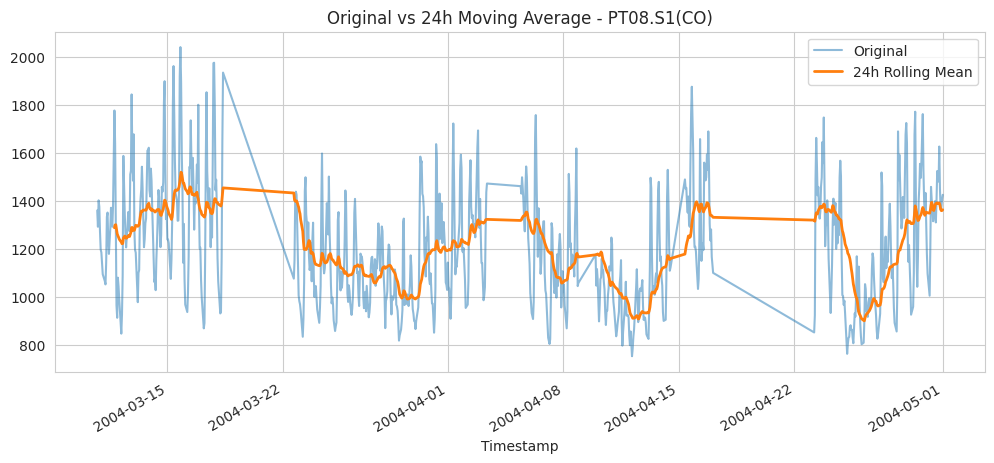
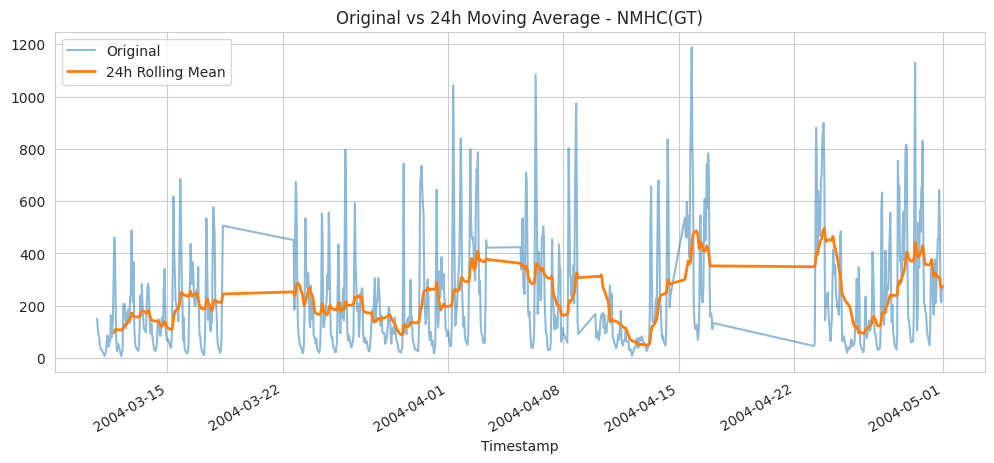
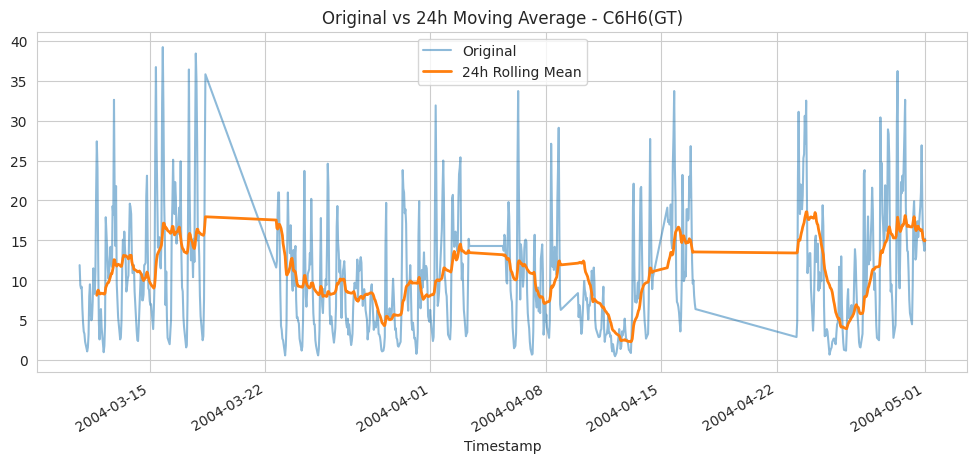
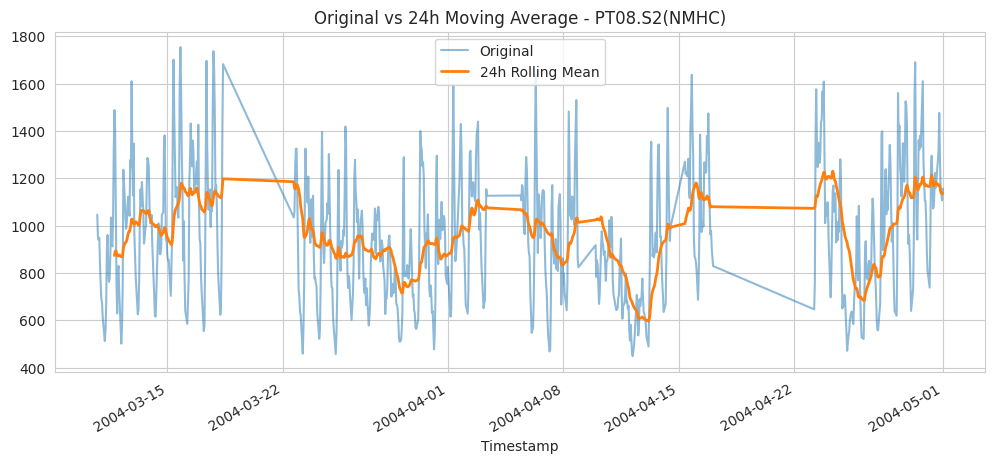
...
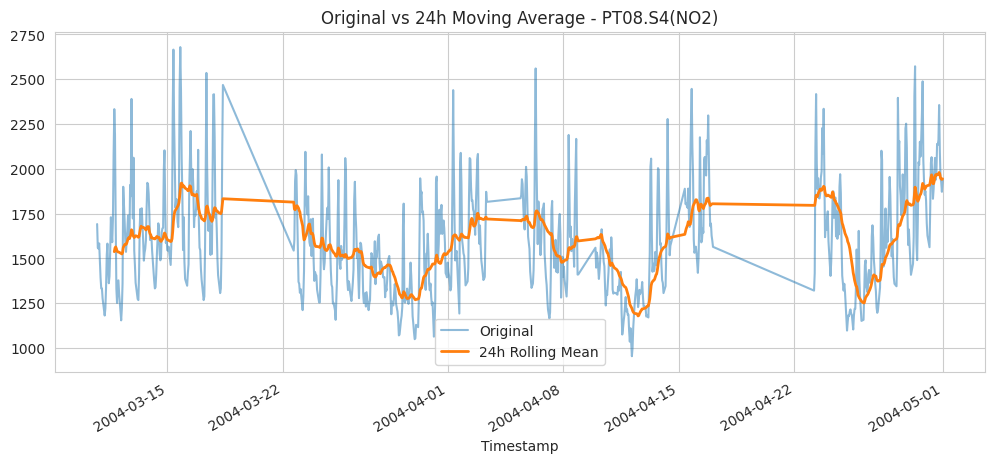
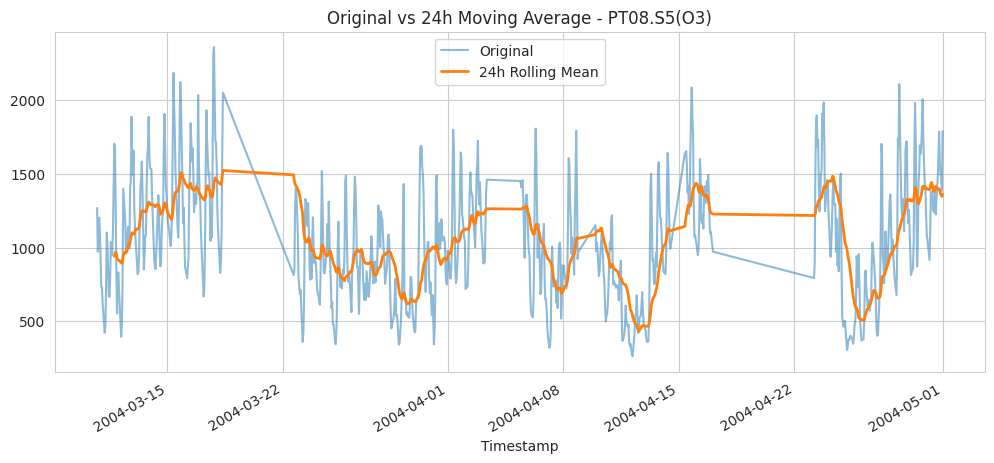
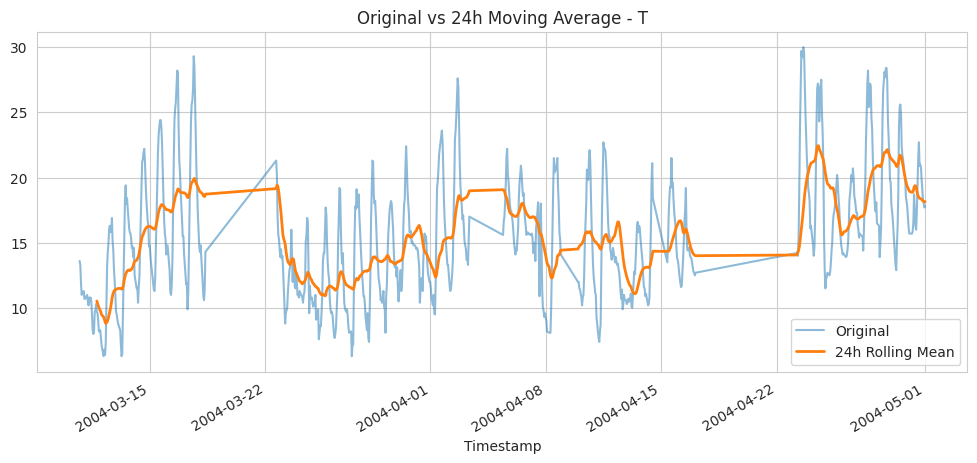
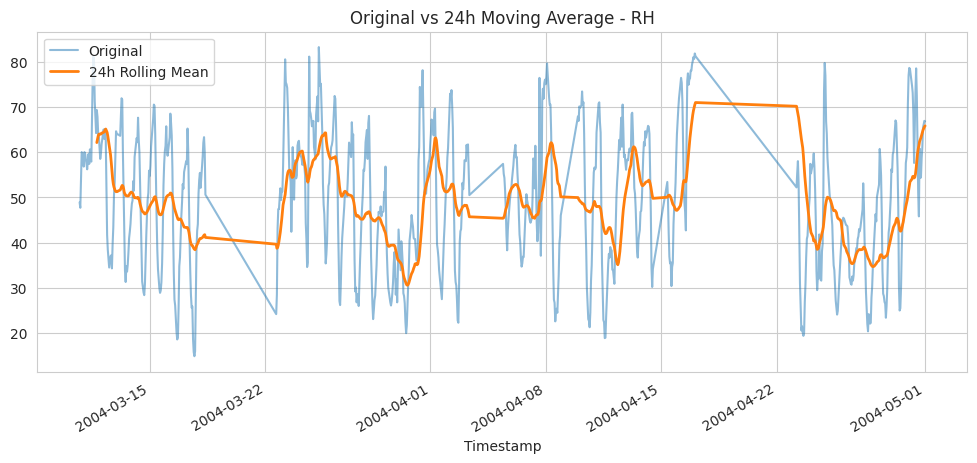
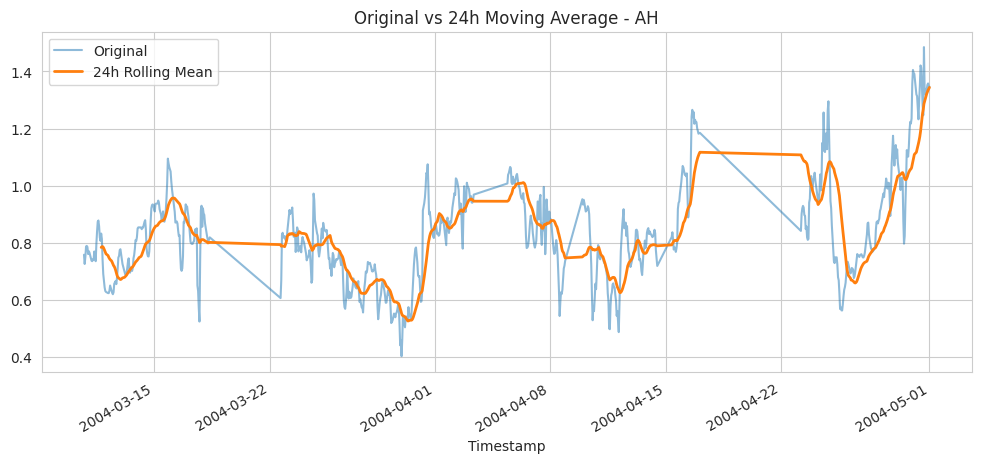

In [73]:
import matplotlib.pyplot as plt
import os
from IPython.display import HTML, display
import base64

# Tạo thư mục lưu ảnh nếu chưa có
if not os.path.exists("charts/rolling_mean"):
    os.makedirs("charts/rolling_mean")

image_tags = []

for col in df.columns:
    try:
        fig, ax = plt.subplots(figsize=(12, 5))
        df[col].plot(ax=ax, label='Original', alpha=0.5)
        df[col].rolling(window=24).mean().plot(ax=ax, label='24h Rolling Mean', linewidth=2)
        ax.set_title(f"Original vs 24h Moving Average - {col}")
        ax.legend()

        filename = f"charts/rolling_mean/{col}_rolling_mean.png"
        plt.savefig(filename, bbox_inches='tight')
        plt.close(fig)

        with open(filename, "rb") as f:
            img_data = base64.b64encode(f.read()).decode("utf-8")
            img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right: 30px; border:1px solid #ccc; width: 700px"/>'
            image_tags.append(img_tag)
    except Exception as e:
        print(f"⚠ Không thể vẽ Rolling Mean cho biến {col}: {e}")

html_code = '<div style="display: flex; overflow-x: auto;">' + "".join(image_tags) + '</div>'
display(HTML(html_code))


# **📚 9. EXPONENTIAL MOVING AVERAGE (EMA)**






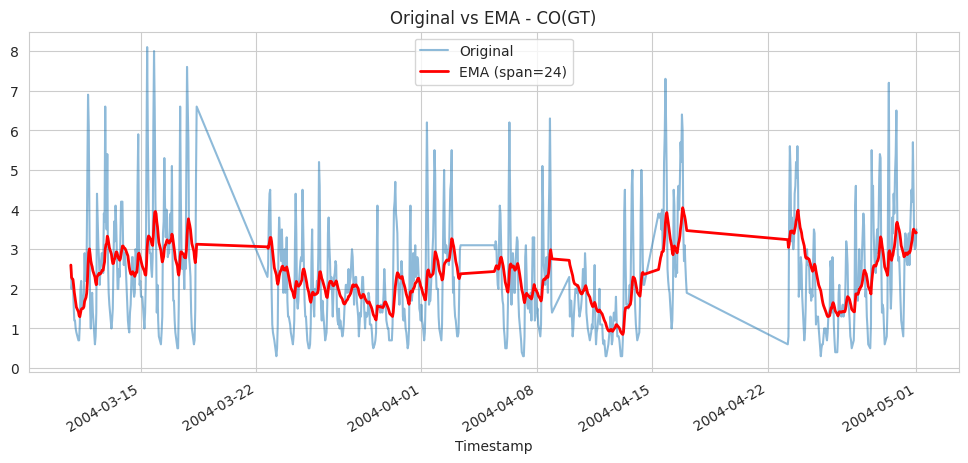
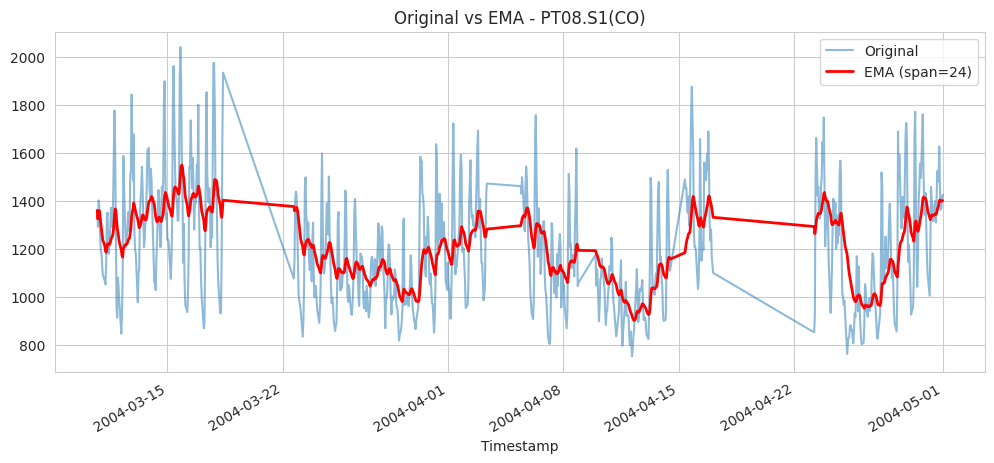
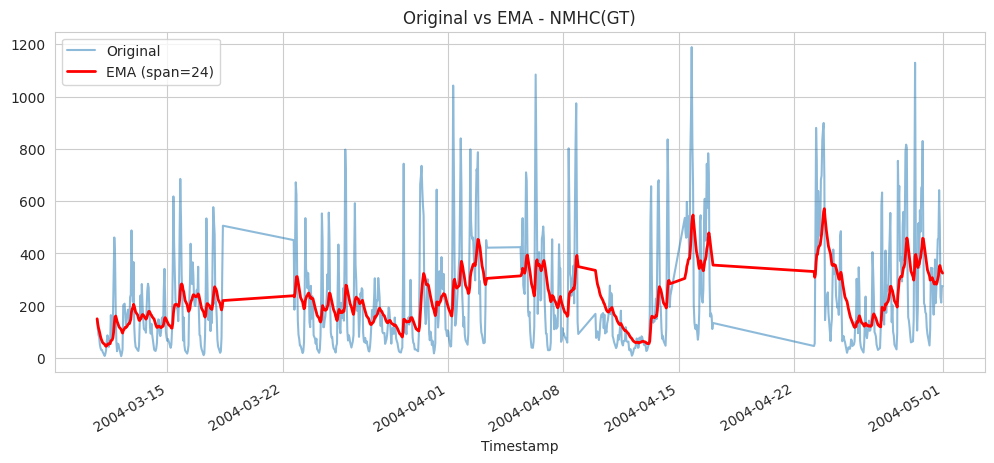
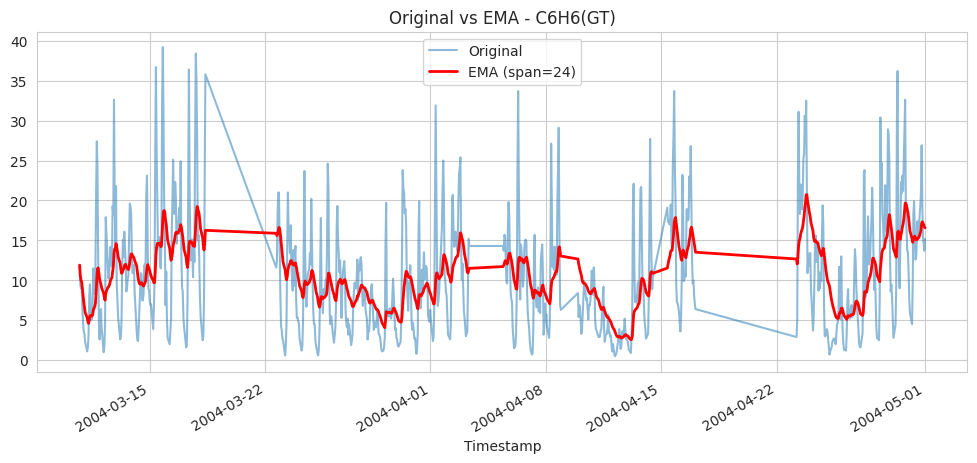
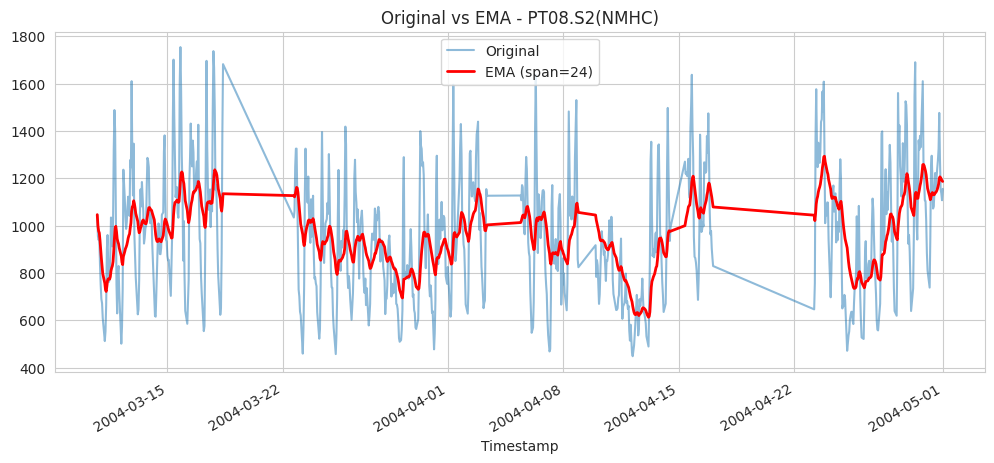
...
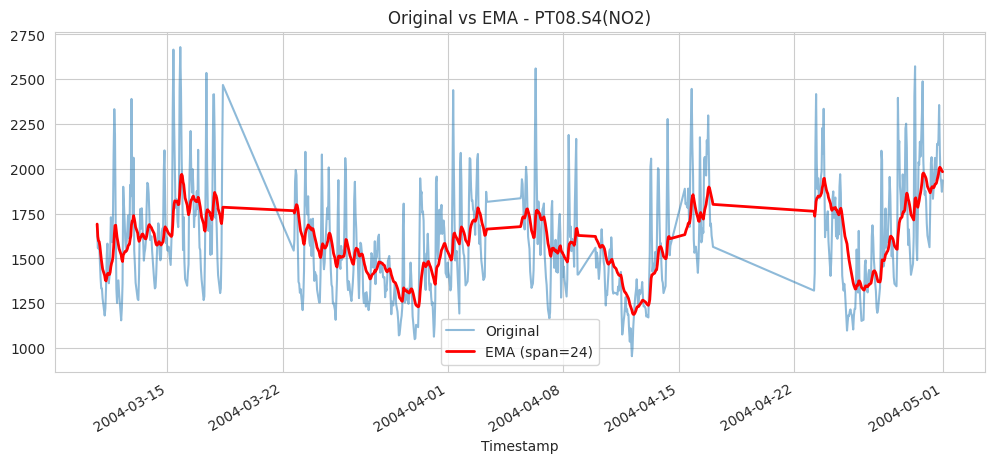
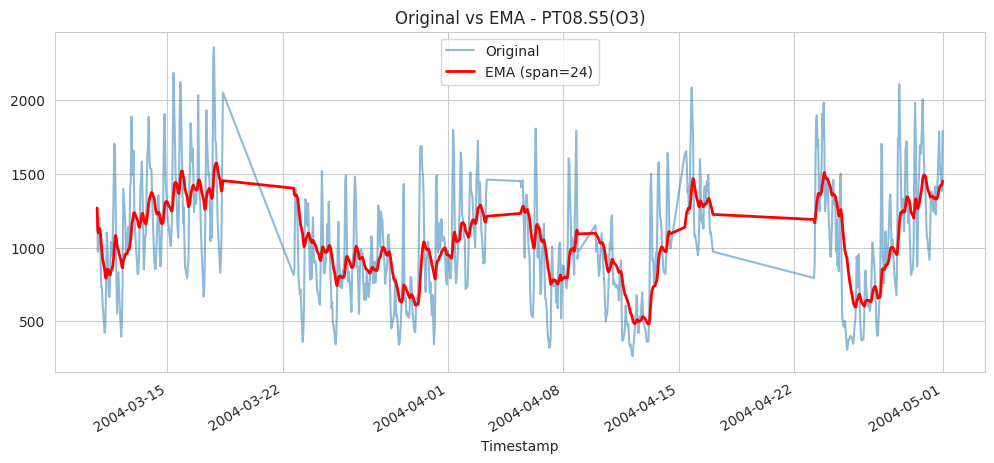
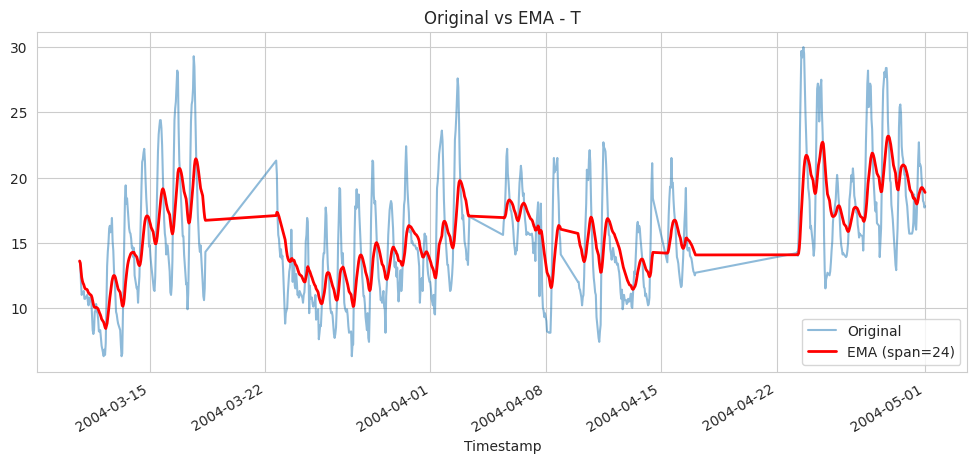
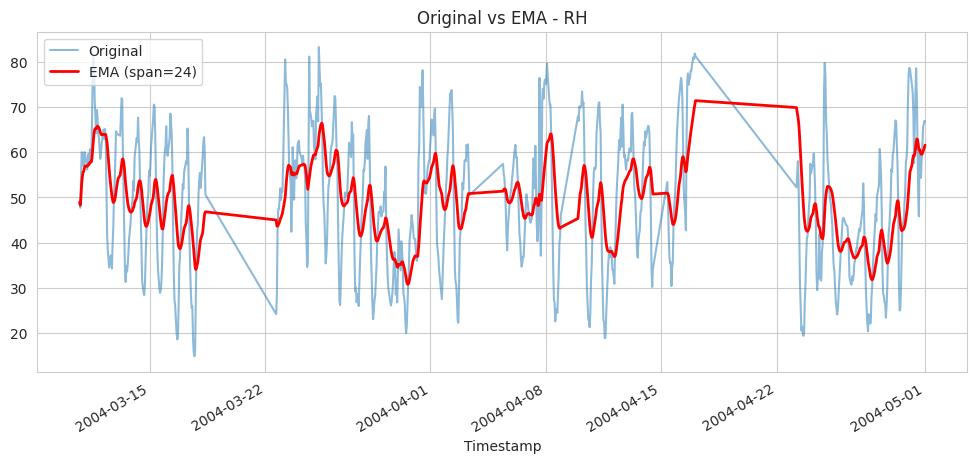
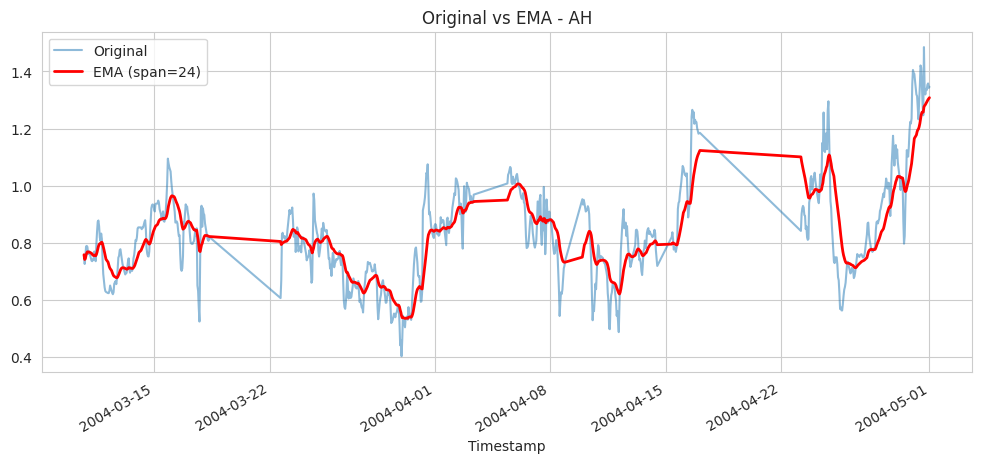

In [74]:
import matplotlib.pyplot as plt
import os
from IPython.display import HTML, display
import base64

# Tạo thư mục lưu ảnh nếu chưa có
if not os.path.exists("charts/ema"):
    os.makedirs("charts/ema")

image_tags = []

for col in df.columns:
    try:
        fig, ax = plt.subplots(figsize=(12, 5))
        df[col].plot(ax=ax, label='Original', alpha=0.5)
        df[col].ewm(span=24).mean().plot(ax=ax, label='EMA (span=24)', linewidth=2, color='red')
        ax.set_title(f"Original vs EMA - {col}")
        ax.legend()

        filename = f"charts/ema/{col}_ema.png"
        plt.savefig(filename, bbox_inches='tight')
        plt.close(fig)

        with open(filename, "rb") as f:
            img_data = base64.b64encode(f.read()).decode("utf-8")
            img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right: 30px; border:1px solid #ccc; width: 700px"/>'
            image_tags.append(img_tag)
    except Exception as e:
        print(f"⚠ Không thể vẽ EMA cho biến {col}: {e}")

html_code = '<div style="display: flex; overflow-x: auto;">' + "".join(image_tags) + '</div>'
display(HTML(html_code))


# **📚 10. ĐO ĐỘ CHÍNH XÁC DỰ BÁO ( MAPE, MAE, MSE, RMSE)**

,Biến,MAE,MSE,RMSE,MAPE
2,NMHC(GT),89.780822,14380.328767,119.918009,50.762425
3,C6H6(GT),5.361644,49.750411,7.053397,39.093318
0,CO(GT),1.038356,1.932603,1.390181,34.698536
5,NOx(GT),59.821918,6073.246575,77.931037,32.914889
7,NO2(GT),17.232877,464.821918,21.559729,16.040810
9,PT08.S5(O3),216.589041,72466.506849,269.196038,15.213976
4,PT08.S2(NMHC),165.369863,42938.136986,207.215195,14.636411
6,PT08.S3(NOx),118.684932,22155.123288,148.845972,14.183467
1,PT08.S1(CO),162.863014,42241.931507,205.528420,11.333021
11,RH,4.497260,29.993288,5.476613,11.128858



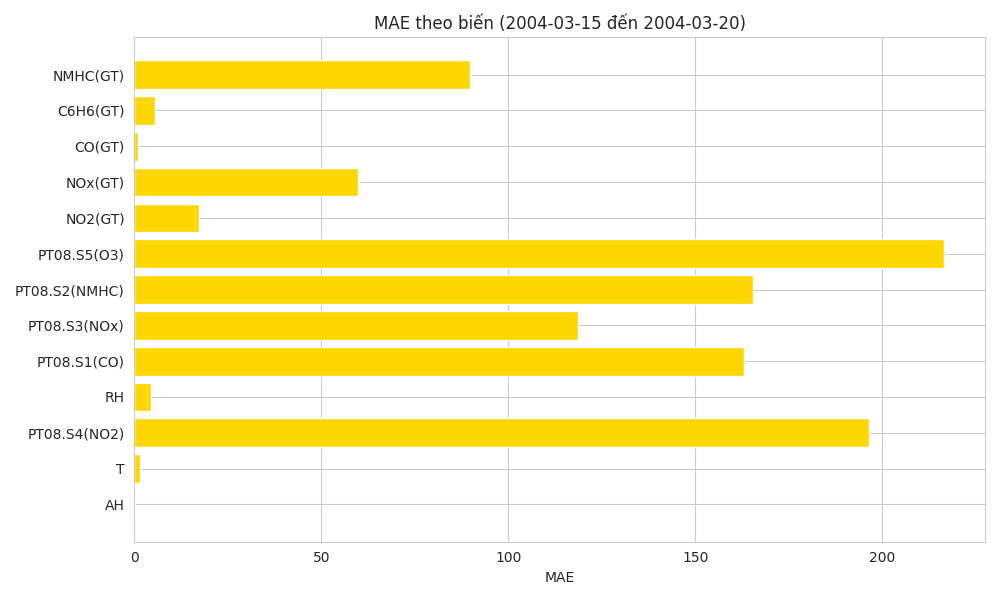
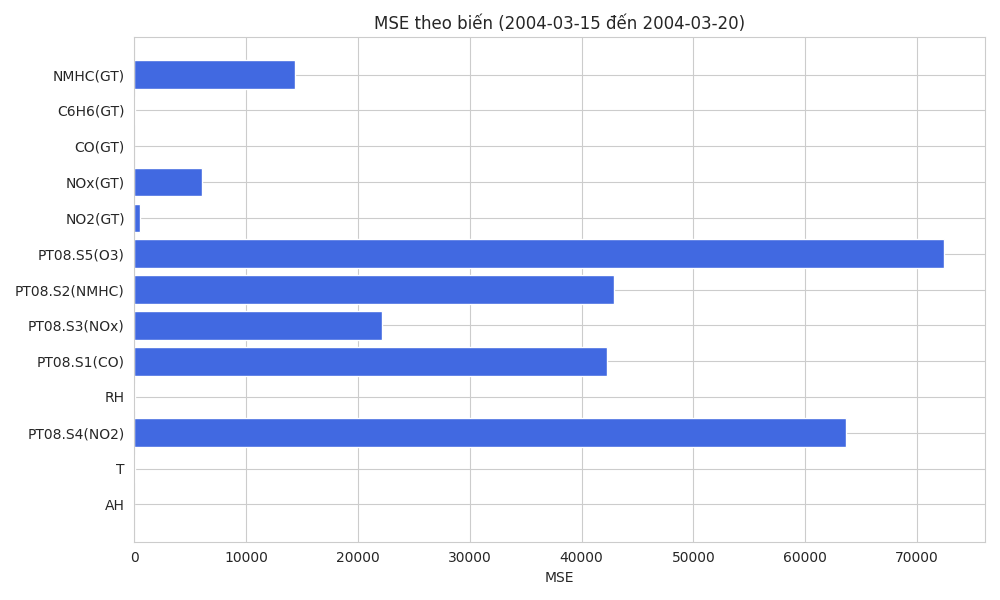
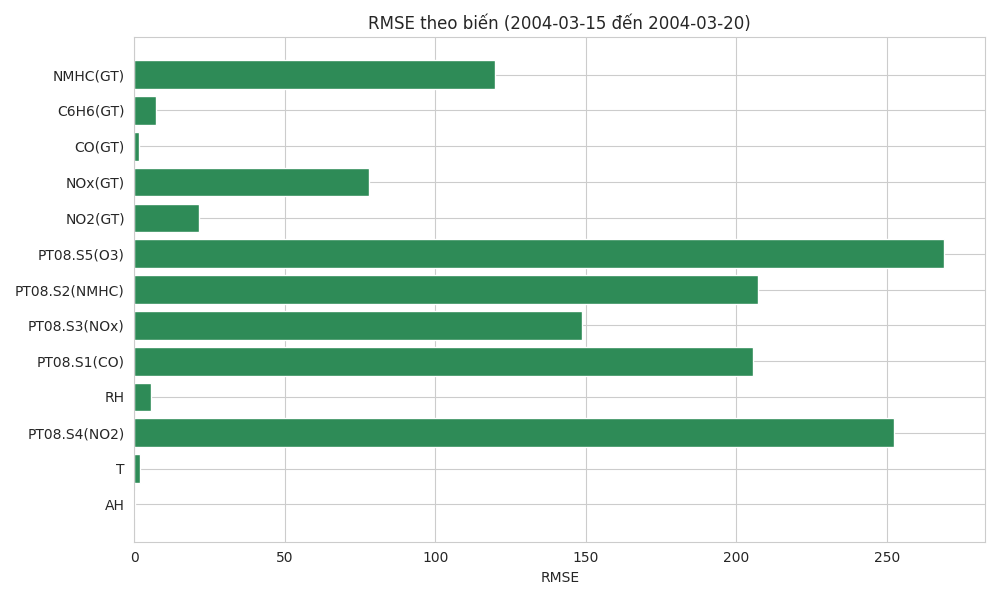
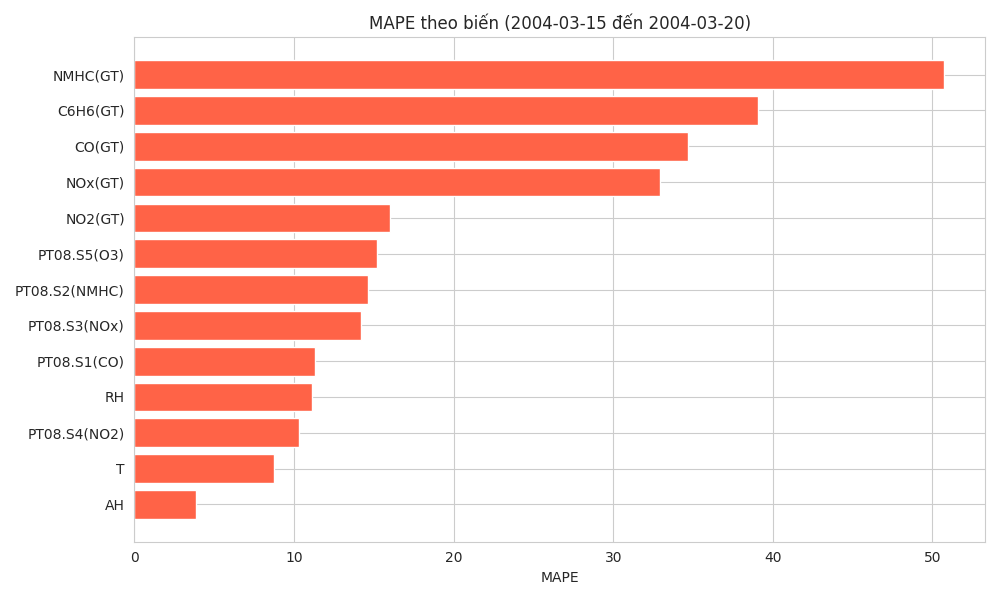


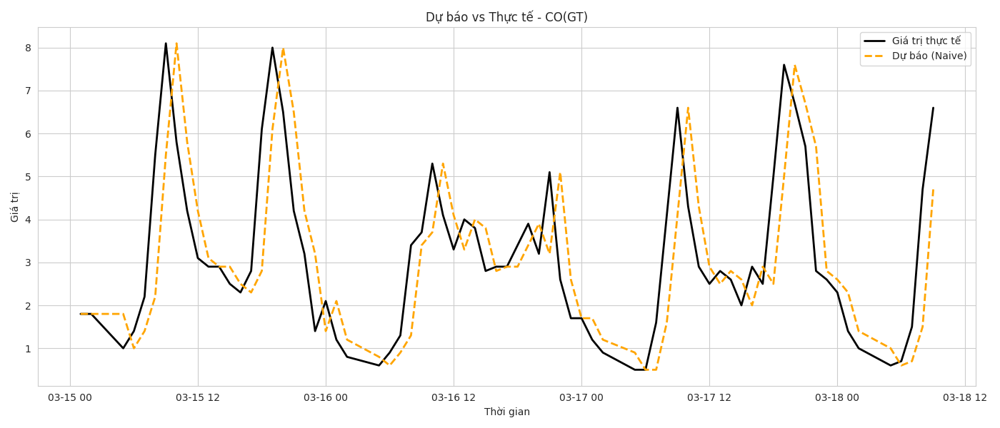
...
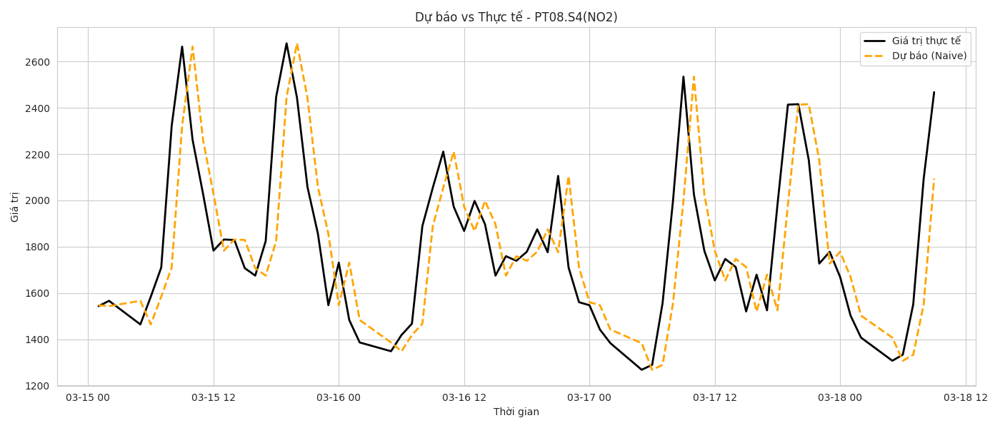
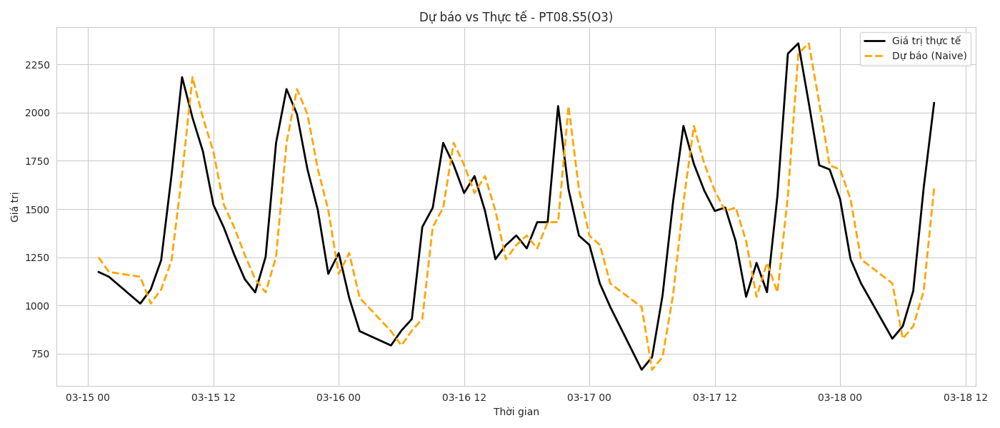
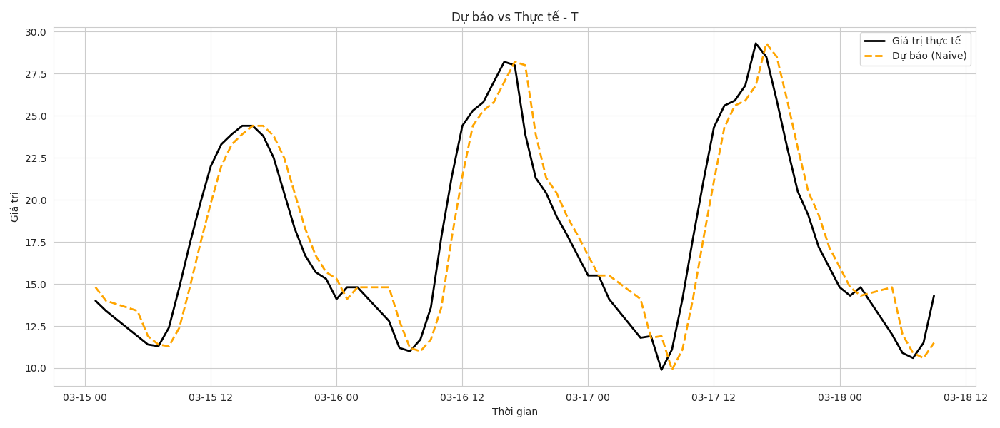
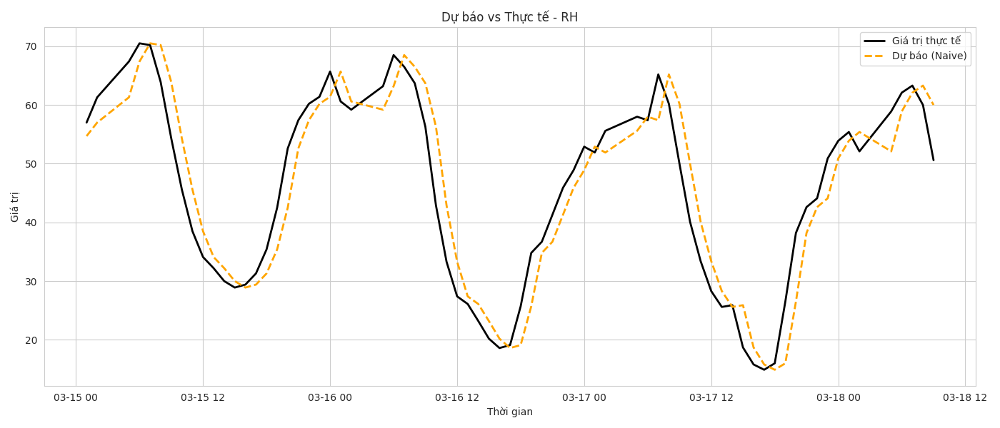
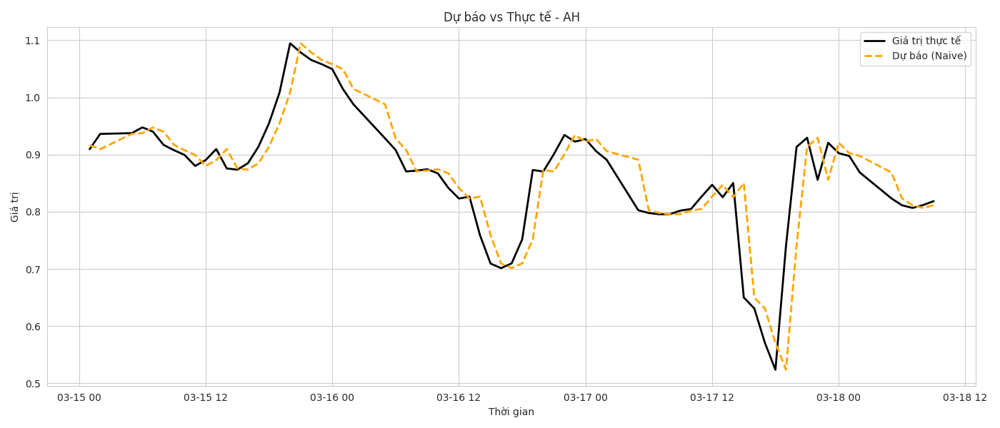

In [75]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error
from IPython.display import display, HTML
import base64

# 1. Chọn khoảng thời gian đánh giá
start_date = "2004-03-15"
end_date = "2004-03-20"
df_eval = df.loc[start_date:end_date]
df_pred = df_eval.shift(1)  # Naive forecast

# 2. Hàm tính MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = (y_true != 0) & (~np.isnan(y_true)) & (~np.isnan(y_pred))
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

# 3. Tính độ chính xác cho từng biến và vẽ biểu đồ
results = []
forecast_image_tags = []
os.makedirs("charts/forecast_line", exist_ok=True)

for col in df.columns:
    try:
        y_true = df_eval[col]
        y_pred = df_pred[col]

        valid_idx = y_true.notna() & y_pred.notna()
        y_true_clean = y_true[valid_idx]
        y_pred_clean = y_pred[valid_idx]

        if len(y_true_clean) > 0:
            mae = mean_absolute_error(y_true_clean, y_pred_clean)
            mse = mean_squared_error(y_true_clean, y_pred_clean)
            rmse = np.sqrt(mse)
            mape = mean_absolute_percentage_error(y_true_clean, y_pred_clean)
            results.append({'Biến': col, 'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape})

            # Vẽ biểu đồ như trong slide
            fig, ax = plt.subplots(figsize=(14, 6))
            ax.plot(y_true_clean.index, y_true_clean.values, label='Giá trị thực tế', color='black', linewidth=2)
            ax.plot(y_pred_clean.index, y_pred_clean.values, label='Dự báo (Naive)', color='orange', linestyle='--', linewidth=2)
            ax.set_title(f'Dự báo vs Thực tế - {col}')
            ax.set_xlabel('Thời gian')
            ax.set_ylabel('Giá trị')
            ax.legend()
            ax.grid(True)
            plt.tight_layout()

            img_path = f"charts/forecast_line/{col}_forecast_vs_actual.png"
            plt.savefig(img_path)
            plt.close()

            with open(img_path, "rb") as f:
                img_data = base64.b64encode(f.read()).decode("utf-8")
                img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right: 30px; border:1px solid #ccc; width: 700px"/>'
                forecast_image_tags.append(img_tag)
        else:
            print(f"⚠️ Biến {col} không đủ dữ liệu hợp lệ.")
    except Exception as e:
        print(f"❌ Lỗi với biến {col}: {e}")

# 4. Tạo bảng kết quả
results_df = pd.DataFrame(results)

if not results_df.empty:
    results_df = results_df.sort_values(by="MAPE", ascending=False)
    display(results_df)

    # Lưu bảng ra CSV
    os.makedirs("charts/metrics", exist_ok=True)
    results_df.to_csv("charts/metrics/evaluation_results.csv", index=False)

    # === VẼ VÀ LƯU RIÊNG TỪNG BIỂU ĐỒ: MAE, MSE, RMSE, MAPE VỚI MÀU KHÁC NHAU ===
    metric_image_tags = []
    metrics = ['MAE', 'MSE', 'RMSE', 'MAPE']
    colors = {
        'MAE': 'gold',
        'MSE': 'royalblue',
        'RMSE': 'seagreen',
        'MAPE': 'tomato'
    }

    for metric in metrics:
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.barh(results_df['Biến'], results_df[metric], color=colors.get(metric, 'gray'))
        ax.set_title(f'{metric} theo biến ({start_date} đến {end_date})')
        ax.set_xlabel(metric)
        ax.invert_yaxis()
        ax.grid(True)
        plt.tight_layout()

        metric_path = f"charts/metrics/{metric}_chart.png"
        plt.savefig(metric_path)
        plt.close()

        # Mã hóa ảnh biểu đồ chỉ số
        with open(metric_path, "rb") as f:
            img_data = base64.b64encode(f.read()).decode("utf-8")
            img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right: 30px; border:1px solid #ccc; width: 500px"/>'
            metric_image_tags.append(img_tag)

    # Hiển thị các biểu đồ chỉ số theo chiều ngang
    html_code_metrics = '<div style="display: flex; overflow-x: auto;">' + "".join(metric_image_tags) + '</div>'
    display(HTML(html_code_metrics))

    # Hiển thị các biểu đồ đường Dự báo vs Thực tế
    html_code_forecast = '<div style="display: flex; overflow-x: auto;">' + "".join(forecast_image_tags) + '</div>'
    display(HTML(html_code_forecast))

else:
    print("❌ Không có kết quả nào sau khi xử lý NaN.")



In [ ]:
from google.colab import sheets
sheet = sheets.InteractiveSheet(df=results_df)

https://docs.google.com/spreadsheets/d/1_x7XH2lYhtYyKQ9MIkbrmnrhSgccQtAF_76q9vcBMnI/edit#gid=0


# **📚 11. XÁC NHẬN CHÉO (CROSS-VALIDATION) TRONG DỰ BÁO CHUỖI THỜI GIAN**

## **📚📚 11.1 Bảng so sánh hiệu suất dự báo**

In [76]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import pandas as pd

# ==== Hàm tính MAPE ====
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = (y_true != 0) & (~np.isnan(y_true)) & (~np.isnan(y_pred))
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

# ==== Hàm dự báo ngây thơ ====
def naive_forecast(train, horizon):
    return [train.iloc[-1]] * horizon

# ==== Cross-validation: Expanding Window ====
def expanding_window_cv(series, forecast_func, initial_train_size, horizon, step=1):
    metrics = []
    for start in range(initial_train_size, len(series) - horizon, step):
        train = series[:start]
        test = series[start:start+horizon]
        pred = forecast_func(train, horizon)
        test = test.values
        pred = np.array(pred)

        mae = mean_absolute_error(test, pred)
        mse = mean_squared_error(test, pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(test, pred)
        metrics.append({'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape})

    return pd.DataFrame(metrics).mean()

# ==== Cross-validation: Rolling Window ====
def rolling_window_cv(series, forecast_func, train_size, horizon, step=1):
    metrics = []
    for start in range(0, len(series) - train_size - horizon, step):
        train = series[start:start+train_size]
        test = series[start+train_size:start+train_size+horizon]
        pred = forecast_func(train, horizon)
        test = test.values
        pred = np.array(pred)

        mae = mean_absolute_error(test, pred)
        mse = mean_squared_error(test, pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(test, pred)
        metrics.append({'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape})

    return pd.DataFrame(metrics).mean()

# ==== Thiết lập khung thời gian ====
start_date = "2004-03-15"
end_date = "2004-03-20"
df_eval = df.loc[start_date:end_date]

# ==== Cấu hình ====
initial_train_size = 24  # tối thiểu 1 ngày (vì dữ liệu theo giờ)
horizon = 5
step = 1

# ==== Kết quả tổng hợp ====
expanding_results = []
rolling_results = []

for col in df_eval.columns:
    series = df_eval[col].dropna()
    if len(series) >= initial_train_size + horizon + 5:
        try:
            expanding_avg = expanding_window_cv(series, naive_forecast, initial_train_size, horizon, step)
            rolling_avg = rolling_window_cv(series, naive_forecast, initial_train_size, horizon, step)

            expanding_results.append({
                'Biến': col,
                'MAE': expanding_avg['MAE'],
                'MSE': expanding_avg['MSE'],
                'RMSE': expanding_avg['RMSE'],
                'MAPE': expanding_avg['MAPE'],
                'Phương pháp': 'Expanding'
            })
            rolling_results.append({
                'Biến': col,
                'MAE': rolling_avg['MAE'],
                'MSE': rolling_avg['MSE'],
                'RMSE': rolling_avg['RMSE'],
                'MAPE': rolling_avg['MAPE'],
                'Phương pháp': 'Rolling'
            })
        except Exception as e:
            print(f"❌ Lỗi với biến {col}: {e}")
    else:
        print(f"⚠️ Biến {col} không đủ dữ liệu để CV (len={len(series)})")

# ==== Ghép và hiển thị kết quả ====
cv_results_df = pd.DataFrame(expanding_results + rolling_results)
display(cv_results_df.sort_values(by=["Biến", "Phương pháp"]))


,Biến,MAE,MSE,RMSE,MAPE,Phương pháp
12,AH,0.086231,0.014692,0.097494,11.037121,Expanding
25,AH,0.086231,0.014692,0.097494,11.037121,Rolling
3,C6H6(GT),8.728444,135.481111,10.027556,83.314476,Expanding
16,C6H6(GT),8.728444,135.481111,10.027556,83.314476,Rolling
0,CO(GT),1.689333,5.053022,1.945946,73.722584,Expanding
13,CO(GT),1.689333,5.053022,1.945946,73.722584,Rolling
2,NMHC(GT),147.693333,38112.093333,169.885602,126.305420,Expanding
15,NMHC(GT),147.693333,38112.093333,169.885602,126.305420,Rolling
7,NO2(GT),34.653333,1842.786667,39.032794,33.082380,Expanding
20,NO2(GT),34.653333,1842.786667,39.032794,33.082380,Rolling


## **📚📚 11.2 Biểu đồ Cross- validation**


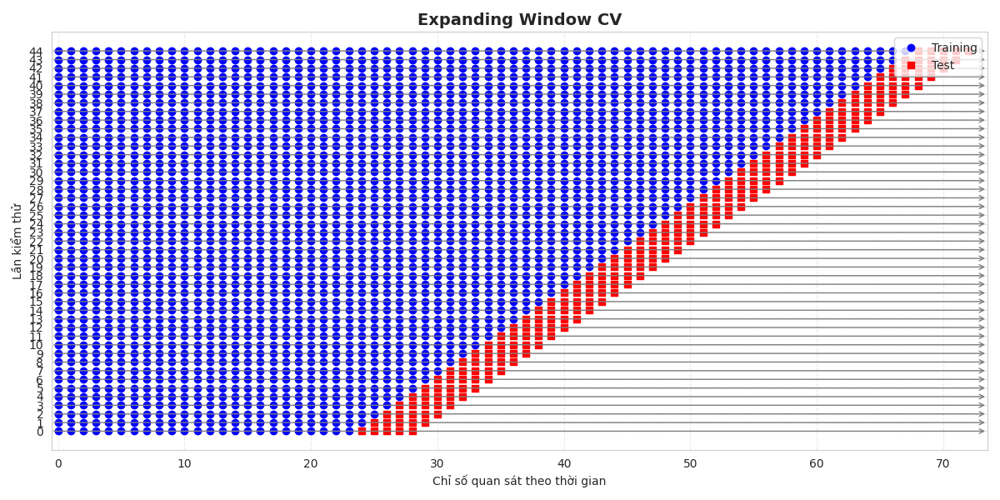
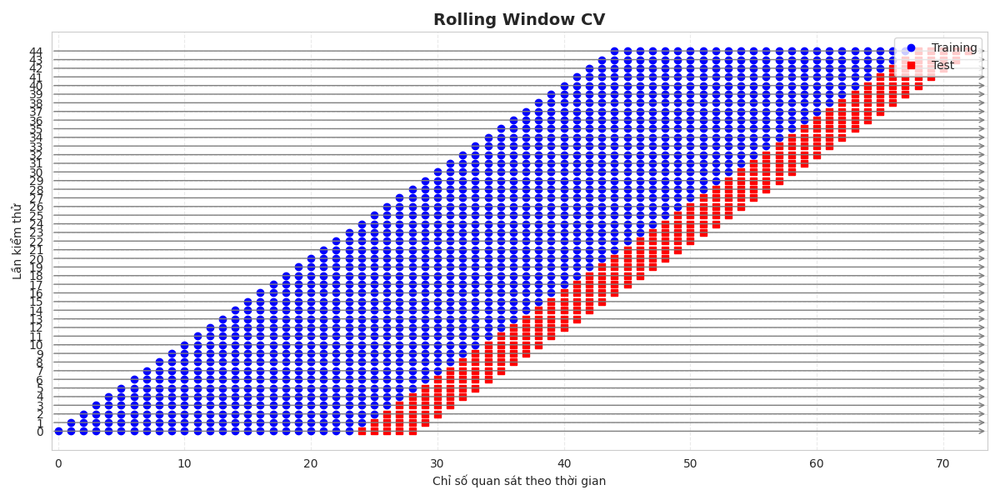

In [77]:
import matplotlib.pyplot as plt
import os
from IPython.display import HTML, display
import base64

# Tạo thư mục lưu ảnh
chart_dir = "charts/ema/cv"
os.makedirs(chart_dir, exist_ok=True)

# Các thông số chung
initial_train_size = 24
horizon = 5
step = 1

image_tags = []

# Hàm vẽ biểu đồ Expanding hoặc Rolling cho một độ dài chuỗi nhất định
def plot_cv_schedule(series_len, train_size, horizon, step, mode="expanding"):
    if mode == "expanding":
        split_points = list(range(train_size, series_len - horizon, step))
        title = "Expanding Window CV"
        filename = os.path.join(chart_dir, "all_expanding.png")
    else:  # rolling
        split_points = list(range(0, series_len - train_size - horizon, step))
        title = "Rolling Window CV"
        filename = os.path.join(chart_dir, "all_rolling.png")

    n_splits = len(split_points)
    fig, ax = plt.subplots(figsize=(12, 6))

    for idx, start in enumerate(split_points):
        if mode == "expanding":
            train_start, train_end = 0, start
            test_start, test_end = start, start + horizon
        else:
            train_start, train_end = start, start + train_size
            test_start, test_end = train_end, train_end + horizon

        ax.plot(range(train_start, train_end), [idx] * (train_end - train_start),
                marker='o', linestyle='None', color='blue', label='Training' if idx == 0 else "")
        ax.plot(range(test_start, test_end), [idx] * (test_end - test_start),
                marker='s', linestyle='None', color='red', label='Test' if idx == 0 else "")
        ax.annotate('', xy=(series_len-0.5, idx), xytext=(-0.5, idx),
                    arrowprops=dict(arrowstyle="->", color='gray', lw=1))

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel("Chỉ số quan sát theo thời gian")
    ax.set_ylabel("Lần kiểm thử")
    ax.set_yticks(range(n_splits))
    ax.set_xlim(-0.5, series_len - 0.5)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.legend(loc='upper right')

    plt.tight_layout()
    plt.savefig(filename)
    plt.close(fig)

    # Thêm hình vào danh sách HTML
    with open(filename, "rb") as f:
        img_data = base64.b64encode(f.read()).decode("utf-8")
        img_tag = f'<img src="data:image/png;base64,{img_data}" style="margin-right:30px; border:1px solid #ccc; width: 700px"/>'
        image_tags.append(img_tag)

# Tìm một chuỗi có đủ dữ liệu để đại diện
for col in df_eval.columns:
    series = df_eval[col].dropna()
    if len(series) >= initial_train_size + horizon + 5:
        series_len = len(series)
        plot_cv_schedule(series_len, initial_train_size, horizon, step, mode="expanding")
        plot_cv_schedule(series_len, initial_train_size, horizon, step, mode="rolling")
        break  # chỉ lấy một biến đầu tiên đủ điều kiện

# Hiển thị HTML
html_code = '<div style="display: flex; flex-wrap: nowrap; overflow-x: auto;">' + ''.join(image_tags) + '</div>'
display(HTML(html_code))


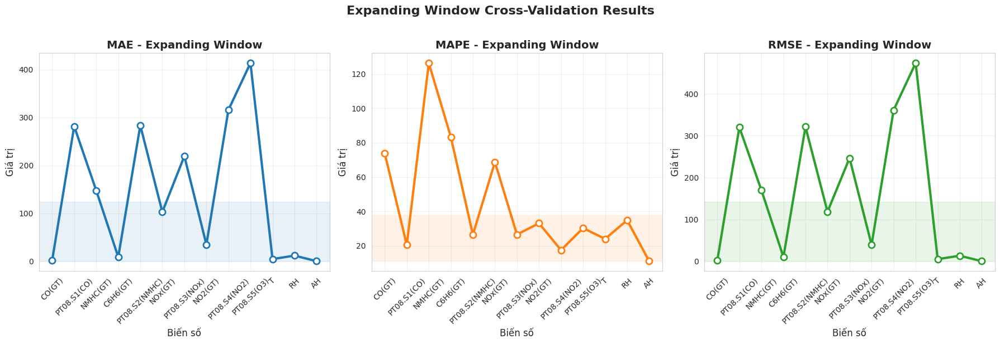

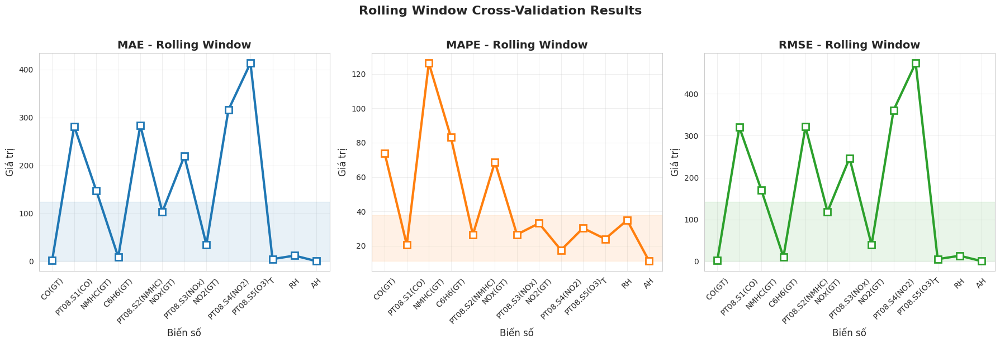

=== EXPANDING WINDOW ===


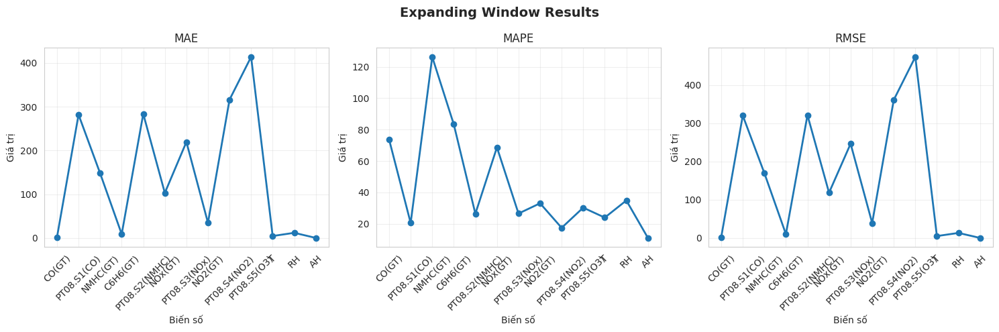


=== ROLLING WINDOW ===


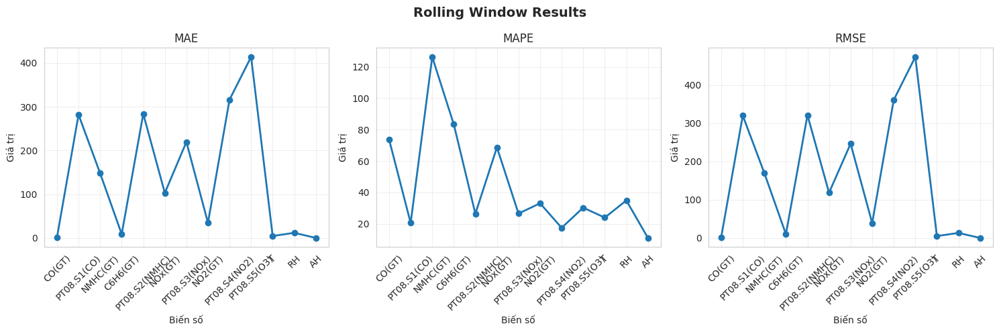


=== THÔNG TIN DỮ LIỆU ===
Phương pháp có sẵn: ['Expanding' 'Rolling']
Số điểm dữ liệu Expanding: 39
Số điểm dữ liệu Rolling: 39


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Chuẩn bị dữ liệu
cv_metrics = cv_results_df.melt(
    id_vars=['Biến', 'Phương pháp'],
    value_vars=['MAE', 'MAPE', 'RMSE'],
    var_name='Chỉ số',
    value_name='Giá trị'
)

# Màu sắc
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Xanh, Cam, Xanh lá

# ===== BIỂU ĐỒ EXPANDING =====
fig1, axes1 = plt.subplots(1, 3, figsize=(18, 6))
plt.subplots_adjust(wspace=0.3)

expanding_data = cv_metrics[cv_metrics['Phương pháp'] == 'Expanding']

for idx, metric in enumerate(['MAE', 'MAPE', 'RMSE']):
    ax = axes1[idx]
    subset = expanding_data[expanding_data['Chỉ số'] == metric]

    # Vẽ line plot với markers
    ax.plot(subset['Biến'], subset['Giá trị'],
            color=colors[idx], linewidth=3, marker='o',
            markersize=8, markerfacecolor='white',
            markeredgecolor=colors[idx], markeredgewidth=2)

    ax.set_title(f'{metric} - Expanding Window', fontsize=14, fontweight='bold')
    ax.set_xlabel("Biến số", fontsize=12)
    ax.set_ylabel("Giá trị", fontsize=12)
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, alpha=0.3)

    # Tô màu nền cho các giá trị cao
    if len(subset) > 0:
        max_val = subset['Giá trị'].max()
        min_val = subset['Giá trị'].min()
        ax.axhspan(min_val, max_val * 0.3, alpha=0.1, color=colors[idx])

fig1.suptitle("Expanding Window Cross-Validation Results",
              fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# ===== BIỂU ĐỒ ROLLING =====
fig2, axes2 = plt.subplots(1, 3, figsize=(18, 6))
plt.subplots_adjust(wspace=0.3)

rolling_data = cv_metrics[cv_metrics['Phương pháp'] == 'Rolling']

for idx, metric in enumerate(['MAE', 'MAPE', 'RMSE']):
    ax = axes2[idx]
    subset = rolling_data[rolling_data['Chỉ số'] == metric]

    # Vẽ line plot với markers
    ax.plot(subset['Biến'], subset['Giá trị'],
            color=colors[idx], linewidth=3, marker='s',
            markersize=8, markerfacecolor='white',
            markeredgecolor=colors[idx], markeredgewidth=2)

    ax.set_title(f'{metric} - Rolling Window', fontsize=14, fontweight='bold')
    ax.set_xlabel("Biến số", fontsize=12)
    ax.set_ylabel("Giá trị", fontsize=12)
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, alpha=0.3)

    # Tô màu nền cho các giá trị cao
    if len(subset) > 0:
        max_val = subset['Giá trị'].max()
        min_val = subset['Giá trị'].min()
        ax.axhspan(min_val, max_val * 0.3, alpha=0.1, color=colors[idx])

fig2.suptitle("Rolling Window Cross-Validation Results",
              fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# ===== PHIÊN BẢN ĐƠN GIẢN HỚN =====
# Nếu muốn style đơn giản hơn
def plot_simple_version(method_name, data, fig_title):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    method_data = data[data['Phương pháp'] == method_name]

    for i, metric in enumerate(['MAE', 'MAPE', 'RMSE']):
        subset = method_data[method_data['Chỉ số'] == metric]

        axes[i].plot(subset['Biến'], subset['Giá trị'],
                    'o-', linewidth=2, markersize=6)
        axes[i].set_title(metric)
        axes[i].set_xlabel('Biến số')
        axes[i].set_ylabel('Giá trị')
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].grid(True, alpha=0.3)

    plt.suptitle(fig_title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Gọi hàm để vẽ
print("=== EXPANDING WINDOW ===")
plot_simple_version('Expanding', cv_metrics, 'Expanding Window Results')

print("\n=== ROLLING WINDOW ===")
plot_simple_version('Rolling', cv_metrics, 'Rolling Window Results')

# Kiểm tra dữ liệu
print("\n=== THÔNG TIN DỮ LIỆU ===")
print("Phương pháp có sẵn:", cv_metrics['Phương pháp'].unique())
print("Số điểm dữ liệu Expanding:", len(cv_metrics[cv_metrics['Phương pháp'] == 'Expanding']))
print("Số điểm dữ liệu Rolling:", len(cv_metrics[cv_metrics['Phương pháp'] == 'Rolling']))

## **📚📚 11.3 Lưu kết quả Cross- validation**

In [78]:
# Lưu kết quả cross-validation
cv_results_df.to_csv('cross_validation_results.csv', index=False)

# Lưu kết quả đánh giá mô hình naive
results_df.to_csv('naive_forecast_evaluation.csv', index=False)

# **📚 12. MÔ HÌNH ARIMA**



=== MÔ HÌNH ARIMA (2004-03-15 đến 2004-03-20) ===

Đang xây dựng mô hình ARIMA cho CO(GT)...
                               SARIMAX Results                                
Dep. Variable:                 CO(GT)   No. Observations:                   74
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -123.668
Date:                Fri, 30 May 2025   AIC                            253.337
Time:                        05:30:20   BIC                            260.208
Sample:                             0   HQIC                           256.075
                                 - 74                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0509      0.324      0.157      0.875      -0.584       0.685
ma.L1          0.2868      0.344    

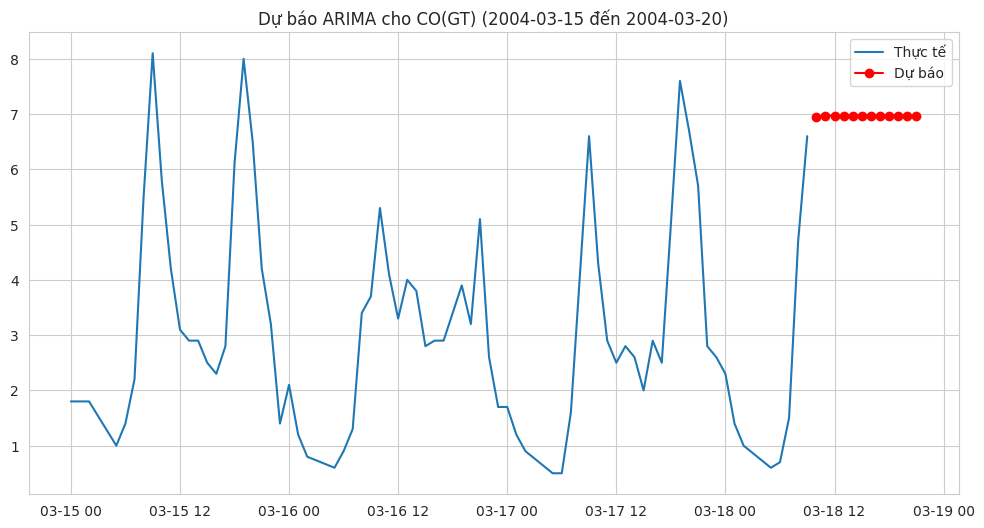


Đang xây dựng mô hình ARIMA cho PT08.S1(CO)...
                               SARIMAX Results                                
Dep. Variable:            PT08.S1(CO)   No. Observations:                   74
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -488.968
Date:                Fri, 30 May 2025   AIC                            983.935
Time:                        05:30:21   BIC                            990.807
Sample:                             0   HQIC                           986.674
                                 - 74                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1771      0.440      0.403      0.687      -0.685       1.040
ma.L1          0.1304      0.437      0.298      0.765      -0.726       0.987
sigm

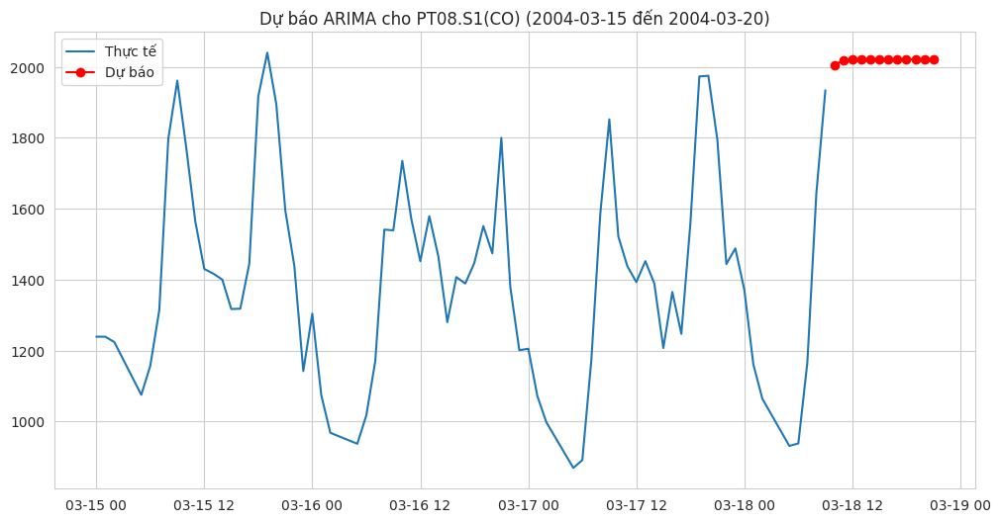


Đang xây dựng mô hình ARIMA cho NMHC(GT)...
                               SARIMAX Results                                
Dep. Variable:               NMHC(GT)   No. Observations:                   74
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -449.496
Date:                Fri, 30 May 2025   AIC                            904.992
Time:                        05:30:22   BIC                            911.864
Sample:                             0   HQIC                           907.731
                                 - 74                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0259      0.375      0.069      0.945      -0.709       0.761
ma.L1          0.2929      0.397      0.737      0.461      -0.486       1.072
sigma2 

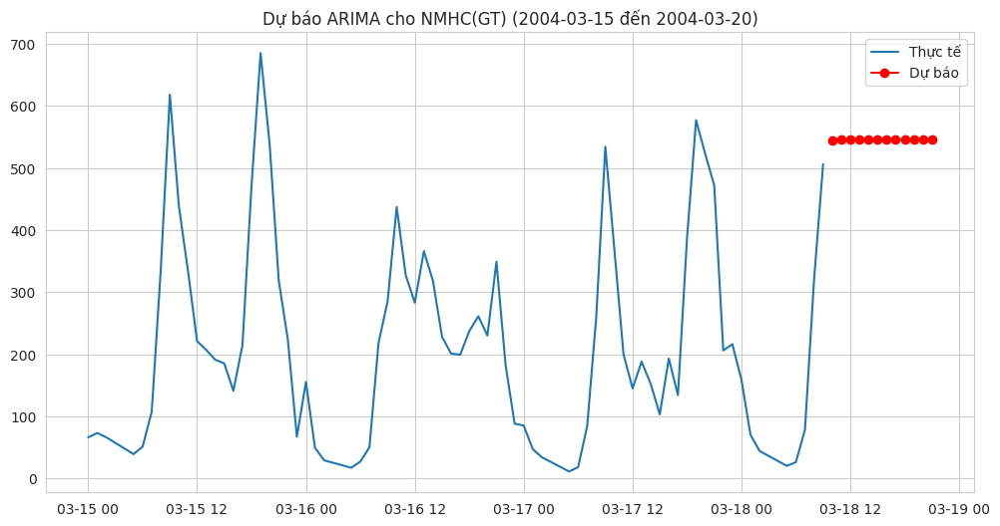

In [92]:
# ================ MÔ HÌNH ARIMA ================
print("\n\n=== MÔ HÌNH ARIMA (2004-03-15 đến 2004-03-20) ===")

from statsmodels.tsa.arima.model import ARIMA

# Chọn khoảng thời gian mong muốn
start_date = '2004-03-15'
end_date = '2004-03-20'
time_range = (df.index >= start_date) & (df.index <= end_date)
df_period = df.loc[time_range]

# Hàm xây dựng mô hình ARIMA
def fit_arima(series, order=(1, 1, 1)):
    """Fit mô hình ARIMA với các tham số cho trước"""
    model = ARIMA(series, order=order)
    fitted_model = model.fit()
    return fitted_model

# Áp dụng cho 3 biến đầu tiên để demo
for col in df_period.columns[:3]:
    try:
        print(f"\nĐang xây dựng mô hình ARIMA cho {col}...")
        series = df_period[col].dropna()

        if len(series) >= 30:  # Đảm bảo đủ dữ liệu
            model = fit_arima(series, order=(1, 1, 1))
            print(model.summary())

            # Dự báo 12 giờ tiếp theo
            forecast = model.forecast(steps=12)

            # Vẽ đồ thị
            fig, ax = plt.subplots(figsize=(12, 6))
            ax.plot(series.index, series, label='Thực tế')
            ax.plot(pd.date_range(series.index[-1], periods=13, freq='h')[1:],
                    forecast, label='Dự báo', color='red', marker='o')
            ax.set_title(f'Dự báo ARIMA cho {col} (2004-03-15 đến 2004-03-20)')
            ax.legend()
            plt.grid(True)
            plt.show()
        else:
            print(f"Không đủ dữ liệu cho {col} để xây dựng mô hình ARIMA (chỉ có {len(series)} quan sát)")

    except Exception as e:
        print(f"Lỗi khi xây dựng ARIMA cho {col}: {str(e)}")


# **📚 13. MÔ HÌNH HOLT-WINTERS**



=== MÔ HÌNH HOLT-WINTERS CHO KHOẢNG THỜI GIAN 2004-03-15 ĐẾN 2004-03-20 ===

Đang xây dựng mô hình Holt-Winters cho PT08.S1(CO)...
                       ExponentialSmoothing Model Results                       
Dep. Variable:              PT08.S1(CO)   No. Observations:                   74
Model:             ExponentialSmoothing   SSE                        2198089.101
Optimized:                         True   AIC                            818.129
Trend:                         Additive   BIC                            882.642
Seasonal:                      Additive   AICC                           861.384
Seasonal Periods:                    24   Date:                 Fri, 30 May 2025
Box-Cox:                          False   Time:                         06:27:50
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
--------------------------------------------------------

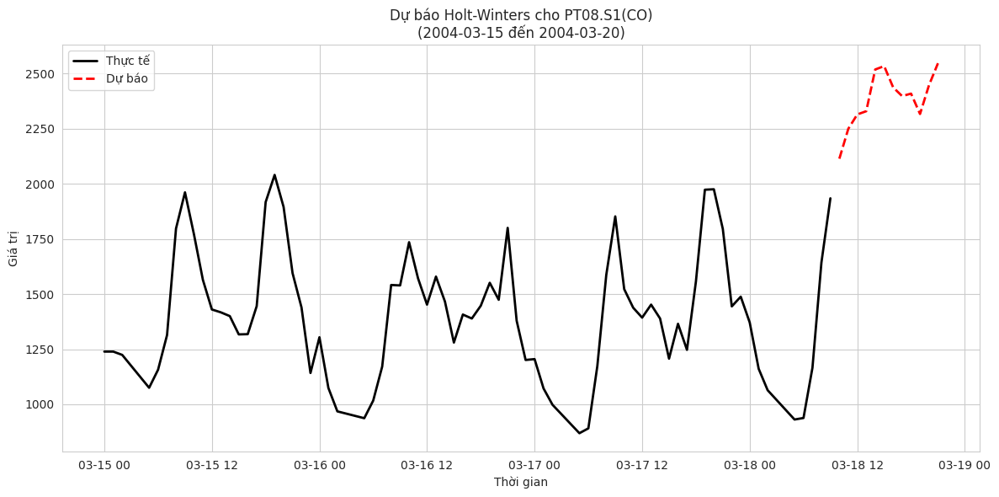


Đang xây dựng mô hình Holt-Winters cho T...
                       ExponentialSmoothing Model Results                       
Dep. Variable:                        T   No. Observations:                   74
Model:             ExponentialSmoothing   SSE                             91.705
Optimized:                         True   AIC                             71.874
Trend:                         Additive   BIC                            136.388
Seasonal:                      Additive   AICC                           115.130
Seasonal Periods:                    24   Date:                 Fri, 30 May 2025
Box-Cox:                          False   Time:                         06:27:51
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               1.0000000                alpha  

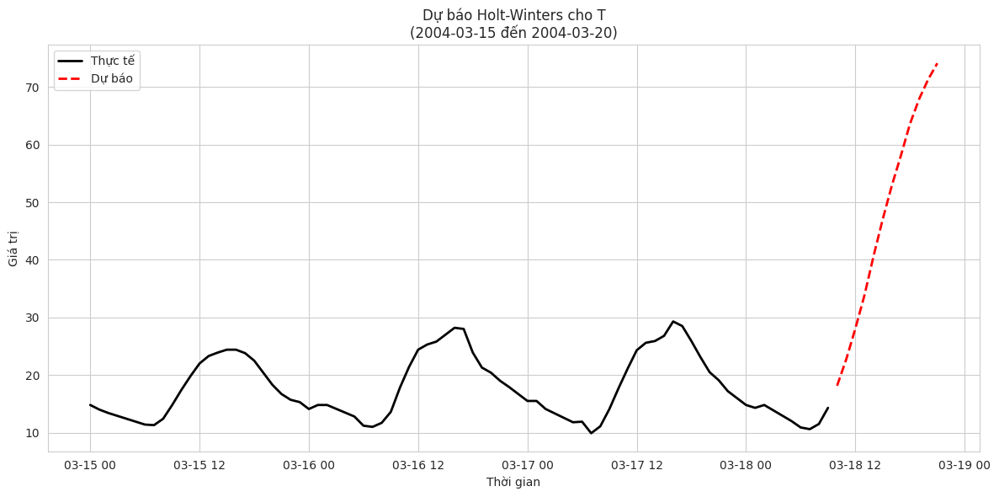


Đang xây dựng mô hình Holt-Winters cho RH...
                       ExponentialSmoothing Model Results                       
Dep. Variable:                       RH   No. Observations:                   74
Model:             ExponentialSmoothing   SSE                            934.228
Optimized:                         True   AIC                            243.638
Trend:                         Additive   BIC                            308.152
Seasonal:                      Additive   AICC                           286.894
Seasonal Periods:                    24   Date:                 Fri, 30 May 2025
Box-Cox:                          False   Time:                         06:27:51
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               1.0000000                alpha 

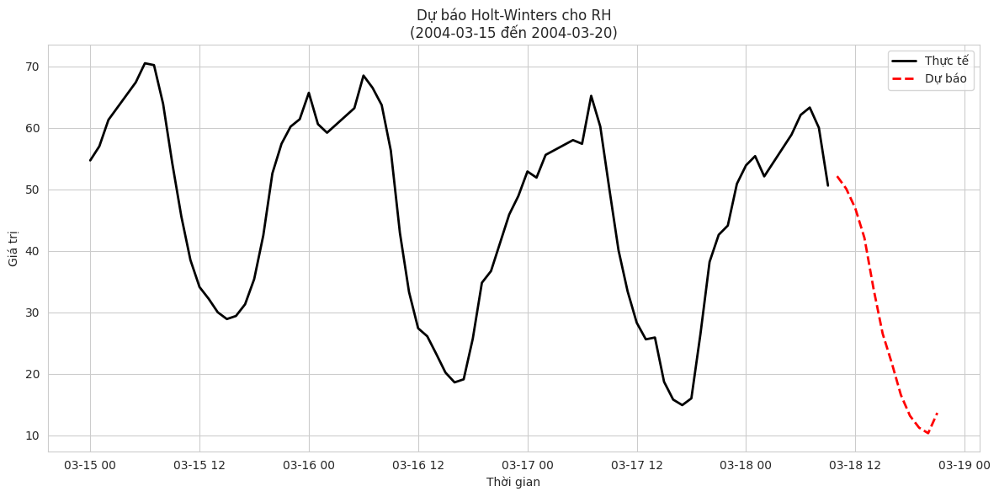

In [94]:
# ================ MÔ HÌNH HOLT-WINTERS (2004-03-15 đến 2004-03-20) ================
print("\n\n=== MÔ HÌNH HOLT-WINTERS CHO KHOẢNG THỜI GIAN 2004-03-15 ĐẾN 2004-03-20 ===")

from statsmodels.tsa.holtwinters import ExponentialSmoothing

def fit_holt_winters(series, seasonal_periods=24, trend='add', seasonal='add'):
    """Xây dựng mô hình Holt-Winters"""
    model = ExponentialSmoothing(series,
                               trend=trend,
                               seasonal=seasonal,
                               seasonal_periods=seasonal_periods)
    return model.fit()

# Lọc dữ liệu chỉ trong khoảng thời gian mong muốn
time_range = (df.index >= start_date) & (df.index <= end_date)
df_period = df.loc[time_range]

# Áp dụng cho các biến có tính thời vụ
for col in ['PT08.S1(CO)', 'T', 'RH']:  # Chọn 3 biến có tính thời vụ rõ
    try:
        print(f"\nĐang xây dựng mô hình Holt-Winters cho {col}...")
        series = df_period[col].dropna()

        if len(series) >= 24:  # Cần ít nhất 1 chu kỳ mùa
            # Fit model
            model = fit_holt_winters(series)
            print(model.summary())

            # Dự báo 12 giờ tiếp theo
            forecast = model.forecast(12)

            # Vẽ đồ thị
            fig, ax = plt.subplots(figsize=(12, 6))
            ax.plot(series.index, series, label='Thực tế', color='black', linewidth=2)
            ax.plot(pd.date_range(series.index[-1], periods=13, freq='H')[1:],
                    forecast, label='Dự báo', color='red', linestyle='--', linewidth=2)
            ax.set_title(f'Dự báo Holt-Winters cho {col}\n({start_date} đến {end_date})')
            ax.set_xlabel('Thời gian')
            ax.set_ylabel('Giá trị')
            ax.legend()
            ax.grid(True)
            plt.tight_layout()
            plt.show()
        else:
            print(f"Không đủ dữ liệu cho {col} (chỉ có {len(series)} quan sát)")
    except Exception as e:
        print(f"Lỗi khi xây dựng Holt-Winters cho {col}: {str(e)}")

# **📚 14. KIỂM TRA PHẦN DƯ**


=== Kiểm tra phần dư cho biến CO(GT) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - CO(GT):
Ljung-Box test:
        lb_stat     lb_pvalue
10  109.066957  8.227812e-19


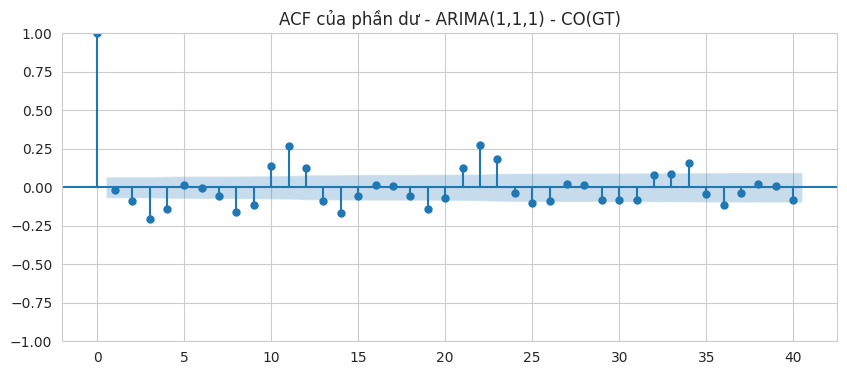

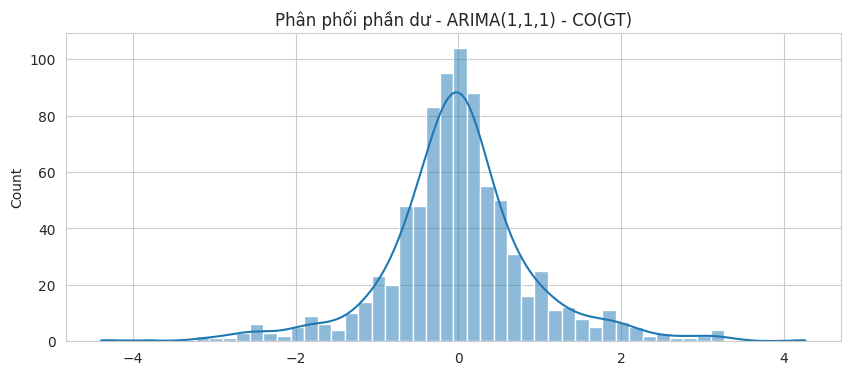


=== Kiểm tra phần dư cho biến PT08.S1(CO) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - PT08.S1(CO):
Ljung-Box test:
       lb_stat     lb_pvalue
10  88.338501  1.142911e-14


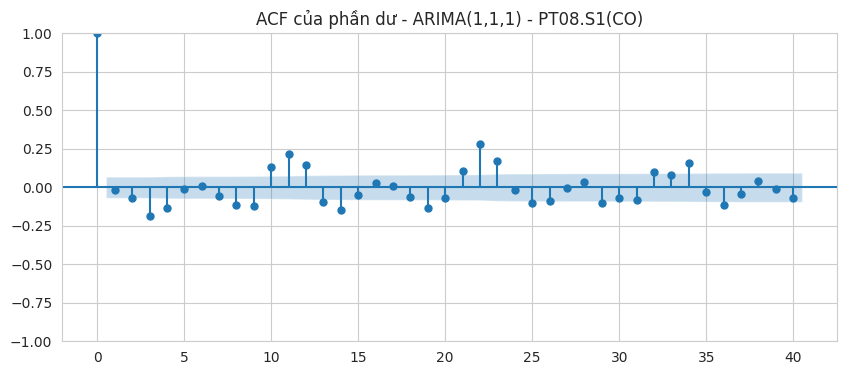

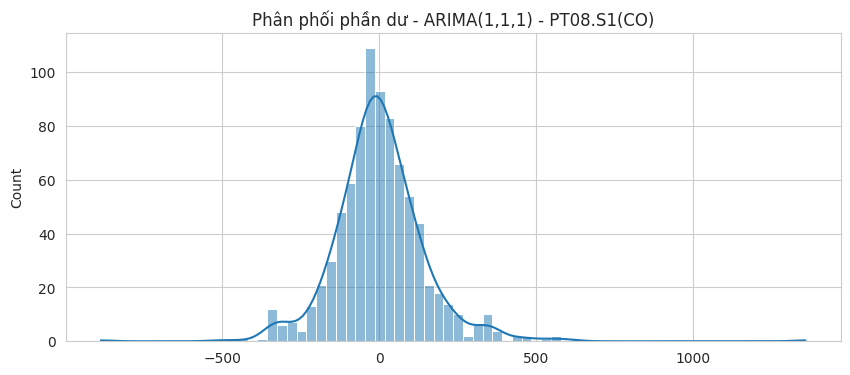


=== Kiểm tra phần dư cho biến NMHC(GT) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - NMHC(GT):
Ljung-Box test:
       lb_stat     lb_pvalue
10  80.899036  3.345248e-13


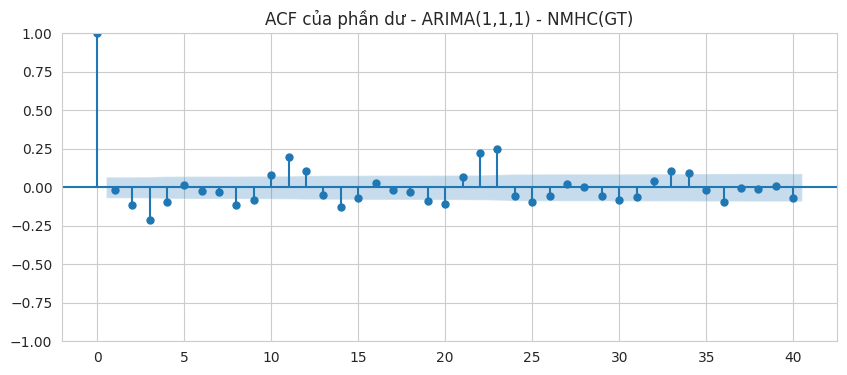

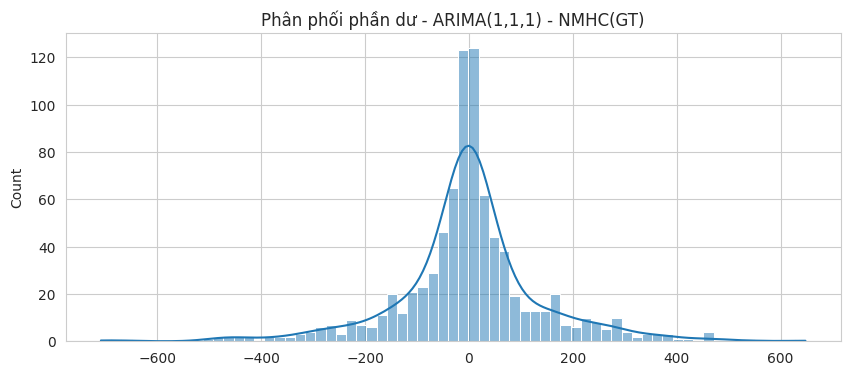


=== Kiểm tra phần dư cho biến C6H6(GT) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - C6H6(GT):
Ljung-Box test:
        lb_stat     lb_pvalue
10  109.802949  5.846926e-19


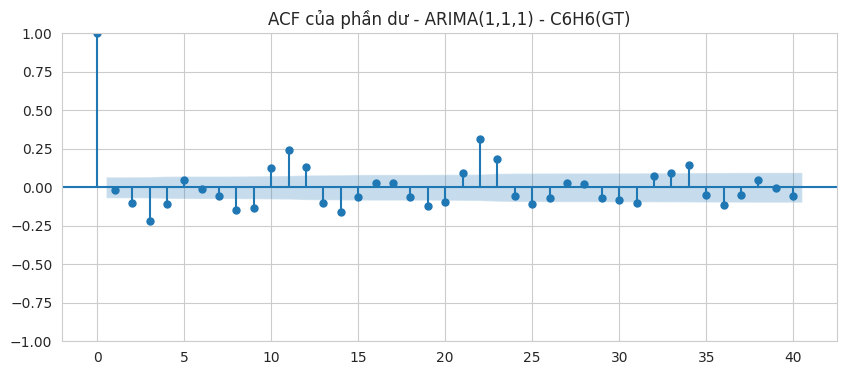

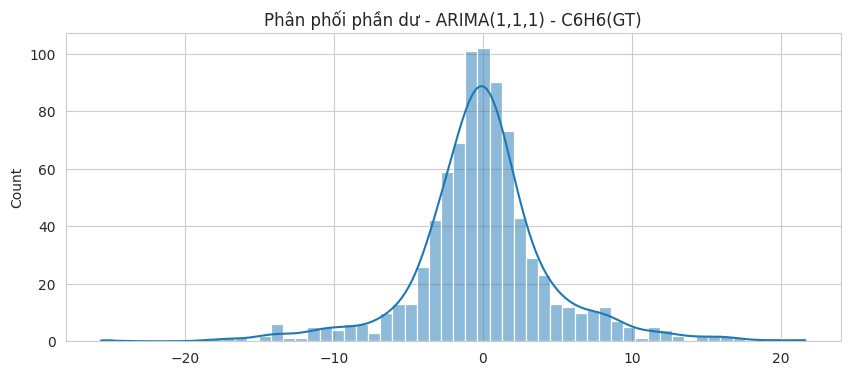


=== Kiểm tra phần dư cho biến PT08.S2(NMHC) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - PT08.S2(NMHC):
Ljung-Box test:
        lb_stat     lb_pvalue
10  109.624614  6.351585e-19


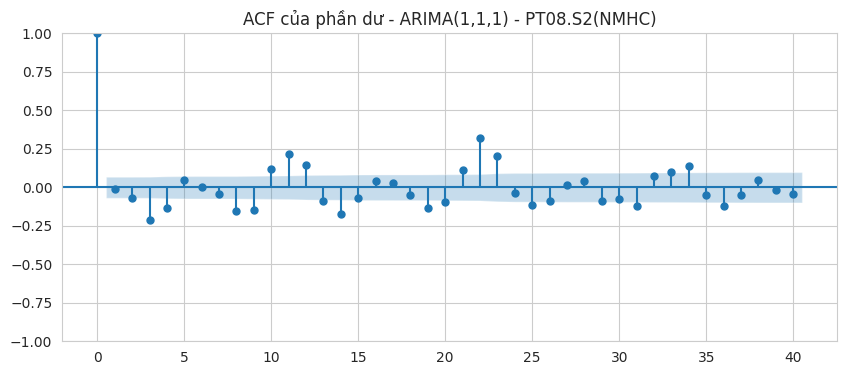

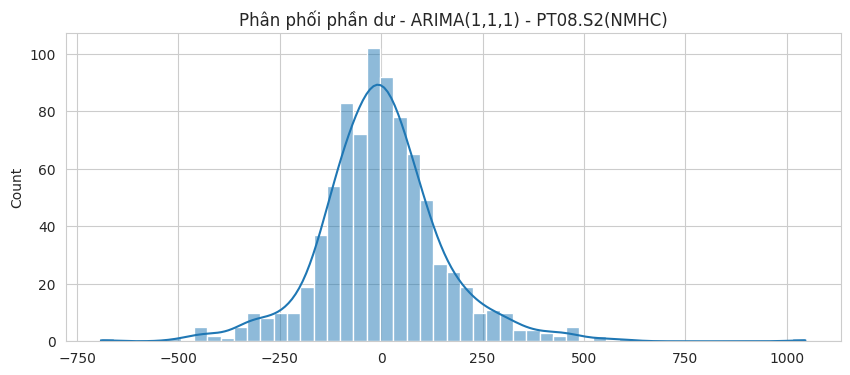


=== Kiểm tra phần dư cho biến NOx(GT) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - NOx(GT):
Ljung-Box test:
       lb_stat     lb_pvalue
10  86.074918  3.202802e-14


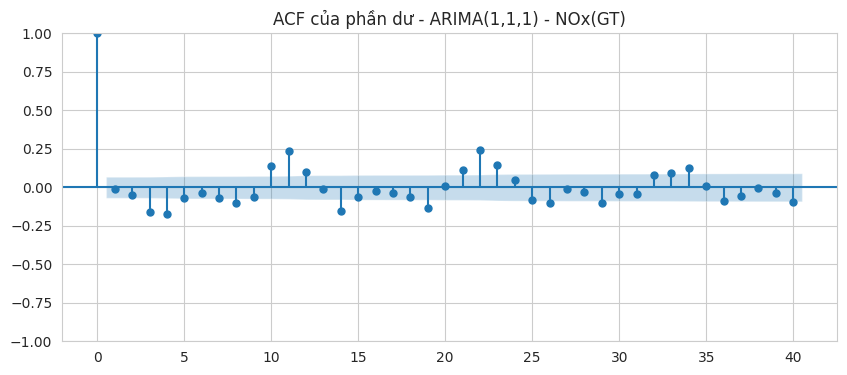

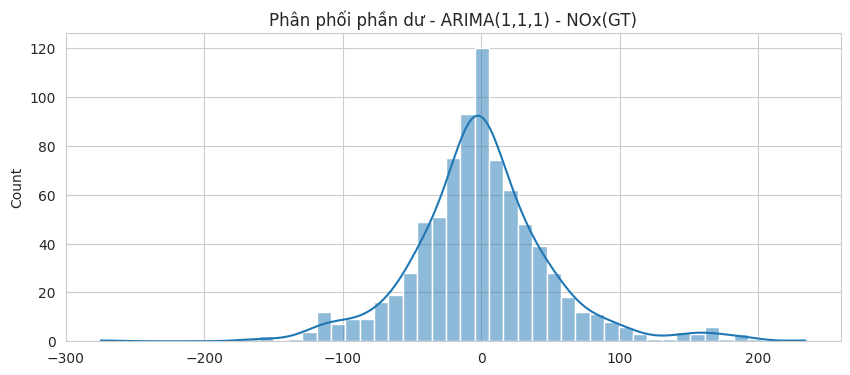


=== Kiểm tra phần dư cho biến PT08.S3(NOx) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - PT08.S3(NOx):
Ljung-Box test:
       lb_stat     lb_pvalue
10  79.923217  5.197479e-13


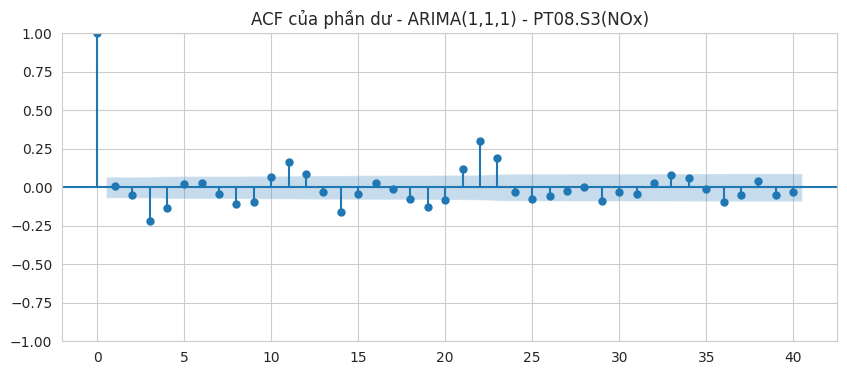

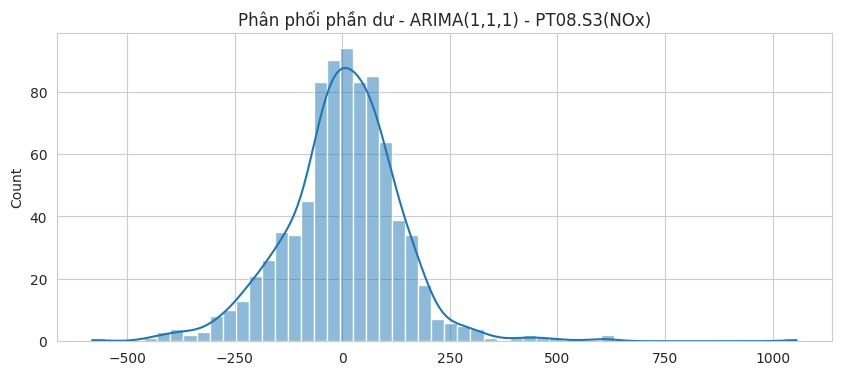


=== Kiểm tra phần dư cho biến NO2(GT) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - NO2(GT):
Ljung-Box test:
       lb_stat     lb_pvalue
10  50.440495  2.214596e-07


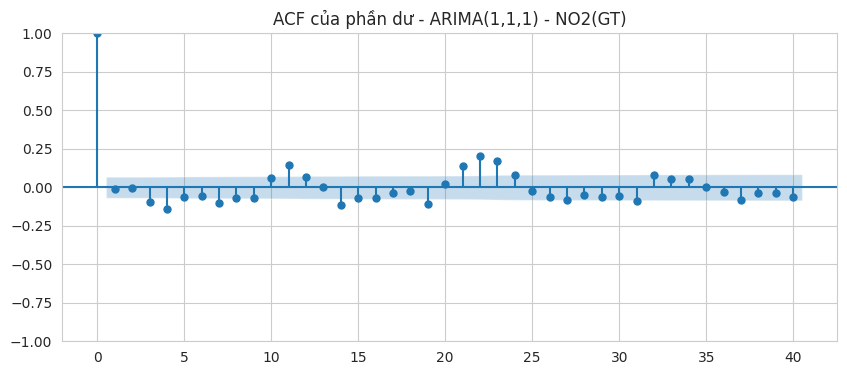

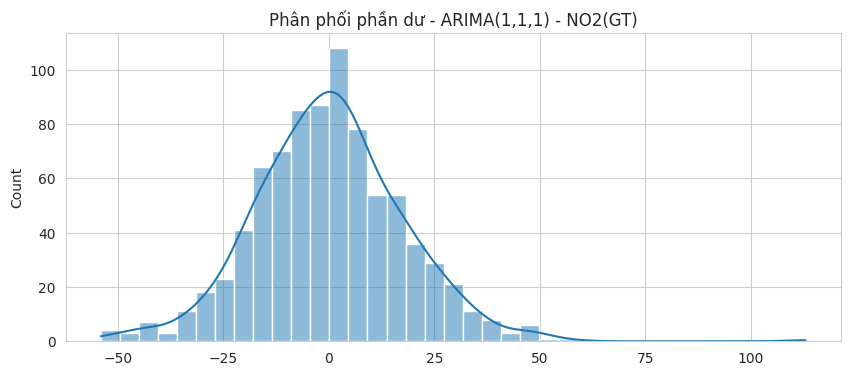


=== Kiểm tra phần dư cho biến PT08.S4(NO2) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - PT08.S4(NO2):
Ljung-Box test:
      lb_stat     lb_pvalue
10  92.04941  2.099078e-15


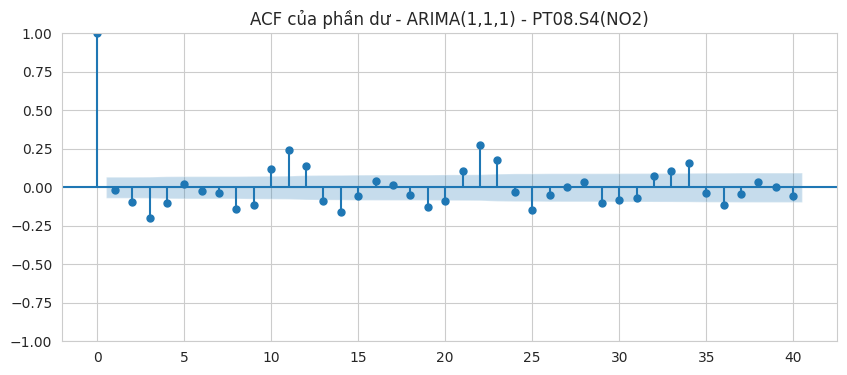

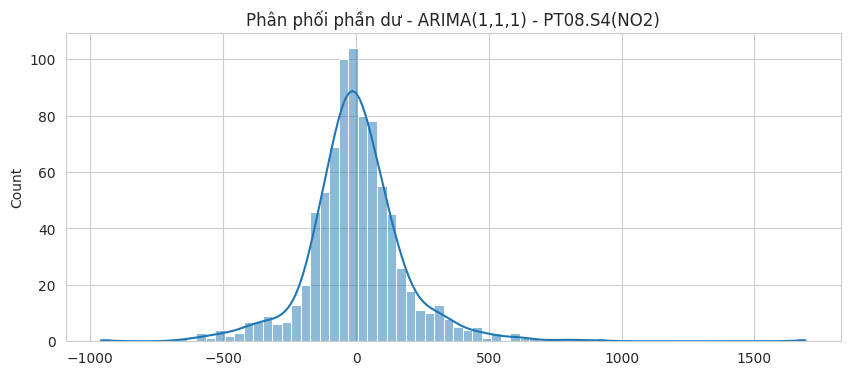


=== Kiểm tra phần dư cho biến PT08.S5(O3) ===

Kiểm tra phần dư cho ARIMA(1,1,1) - PT08.S5(O3):
Ljung-Box test:
       lb_stat     lb_pvalue
10  83.904971  8.579538e-14


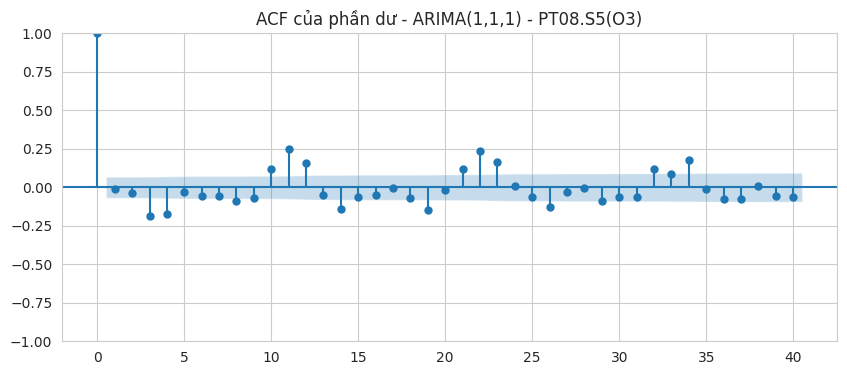

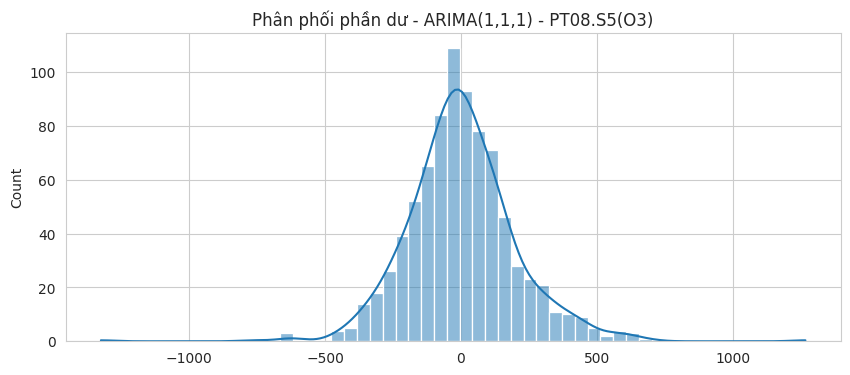


=== Kiểm tra phần dư cho biến T ===

Kiểm tra phần dư cho ARIMA(1,1,1) - T:
Ljung-Box test:
       lb_stat  lb_pvalue
10  21.525682   0.017712


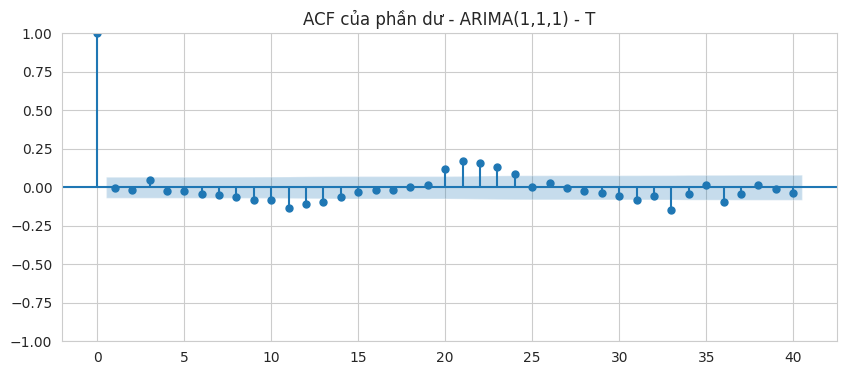

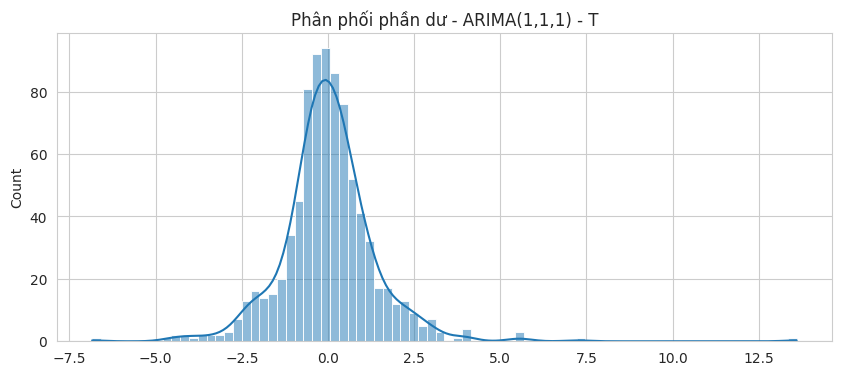


=== Kiểm tra phần dư cho biến RH ===

Kiểm tra phần dư cho ARIMA(1,1,1) - RH:
Ljung-Box test:
      lb_stat  lb_pvalue
10  21.59194   0.017324


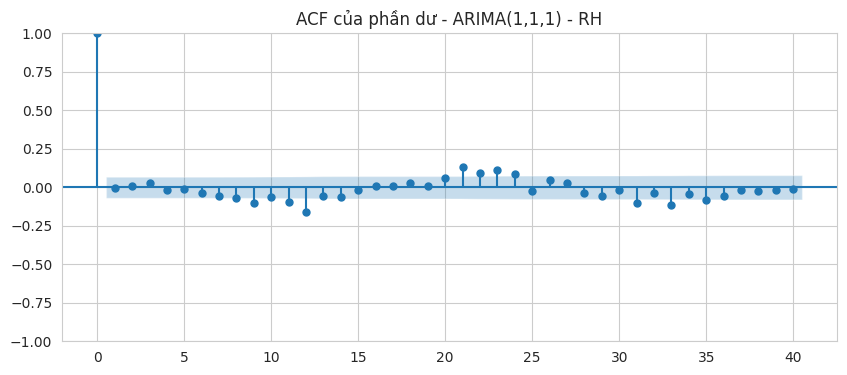

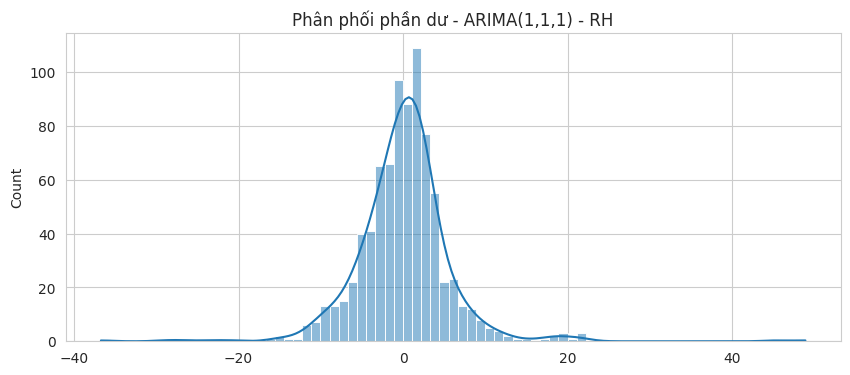


=== Kiểm tra phần dư cho biến AH ===

Kiểm tra phần dư cho ARIMA(1,1,1) - AH:
Ljung-Box test:
      lb_stat  lb_pvalue
10  6.725489   0.751081


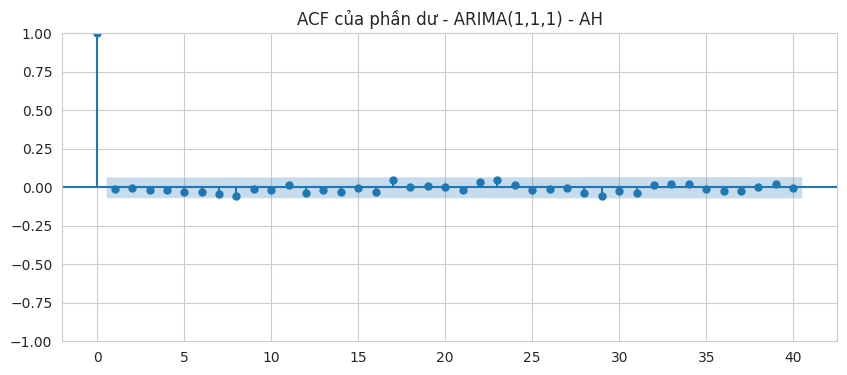

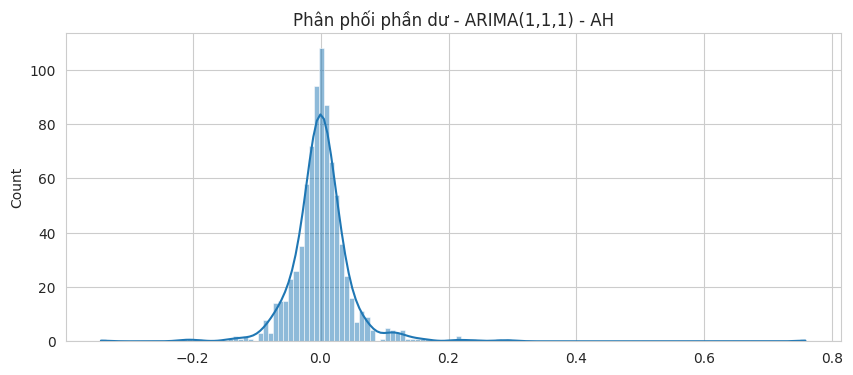

In [96]:
from statsmodels.stats.diagnostic import acorr_ljungbox

def check_residuals(residuals, title):
    """Kiểm tra tính nhiễu trắng của phần dư"""
    print(f"\nKiểm tra phần dư cho {title}:")

    # Kiểm tra Ljung-Box
    lb_test = acorr_ljungbox(residuals.dropna(), lags=[10], return_df=True)
    print("Ljung-Box test:\n", lb_test)

    # Vẽ ACF của phần dư
    fig, ax = plt.subplots(figsize=(10, 4))
    plot_acf(residuals, ax=ax, lags=40)
    ax.set_title(f'ACF của phần dư - {title}')
    plt.show()

    # Vẽ phân phối phần dư
    fig, ax = plt.subplots(figsize=(10, 4))
    sns.histplot(residuals.dropna(), kde=True, ax=ax)
    ax.set_title(f'Phân phối phần dư - {title}')
    plt.show()

# Áp dụng cho tất cả các biến
for col in df.columns:
    try:
        print(f"\n=== Kiểm tra phần dư cho biến {col} ===")
        series = df[col].dropna()

        # Fit model ARIMA (có thể thay đổi order tùy theo từng biến)
        model = ARIMA(series, order=(1,1,1)).fit()

        # Kiểm tra phần dư
        check_residuals(model.resid, f"ARIMA(1,1,1) - {col}")

    except Exception as e:
        print(f"Lỗi khi kiểm tra phần dư cho {col}: {str(e)}")

# **📚 15. SO SÁNH MAPE GIỮA CÁC PHƯƠNG PHÁP DỰ BÁO**

## **📚📚 15.1 Bảng so sánh**

In [79]:
from statsmodels.tsa.arima.model import ARIMA
import pandas as pd

# Hàm dự báo ARIMA
def arima_forecast(train, horizon):
    model = ARIMA(train, order=(1, 1, 1))  # ARIMA(1,1,1) đơn giản
    model_fit = model.fit()
    return model_fit.forecast(horizon)

# Danh sách lưu kết quả
arima_results = []

# Lặp qua 3 biến đầu trong df_eval
for col in df_eval.columns[:3]:  # Giới hạn 3 biến đầu
    series = df_eval[col].dropna()

    if len(series) >= initial_train_size + horizon + 5:
        try:
            # Nếu là DatetimeIndex nhưng thiếu tần suất -> thêm vào
            if isinstance(series.index, pd.DatetimeIndex) and series.index.freq is None:
                inferred_freq = pd.infer_freq(series.index)
                if inferred_freq:
                    series = series.asfreq(inferred_freq)
                else:
                    # Nếu không suy luận được freq, reset về dạng chỉ mục số
                    series = series.reset_index(drop=True)

            # Gọi hàm đánh giá với expanding window
            arima_avg = expanding_window_cv(series, arima_forecast, initial_train_size, horizon, step)

            # Lưu kết quả
            arima_results.append({
                'Biến': col,
                'MAE': arima_avg['MAE'],
                'MSE': arima_avg['MSE'],
                'RMSE': arima_avg['RMSE'],
                'MAPE': arima_avg['MAPE'],
                'Phương pháp': 'ARIMA'
            })
        except Exception as e:
            print(f"❌ Lỗi với biến {col}: {e}")

# Kết hợp kết quả ARIMA với các phương pháp khác
final_results = pd.concat([
    all_results,
    pd.DataFrame(arima_results)
], ignore_index=True)

# Ghi kết quả ra CSV
final_results.to_csv('final_forecast_comparison.csv', index=False)

# Hiển thị bảng kết quả đã sắp xếp
display(final_results.sort_values(by=['Biến', 'Phương pháp']))

,Biến,MAE,MSE,RMSE,MAPE,Phương pháp
38,AH,0.106212,0.021957,0.121364,13.403489,EMA
12,AH,0.086231,0.014692,0.097494,11.037121,Expanding
25,AH,0.086231,0.014692,0.097494,11.037121,Rolling
29,C6H6(GT),9.132853,146.284175,10.438036,87.502885,EMA
3,C6H6(GT),8.728444,135.481111,10.027556,83.314476,Expanding
16,C6H6(GT),8.728444,135.481111,10.027556,83.314476,Rolling
39,CO(GT),1.714118,5.356498,1.967137,72.845238,ARIMA
26,CO(GT),1.760397,5.458442,2.021228,77.073116,EMA
0,CO(GT),1.689333,5.053022,1.945946,73.722584,Expanding
13,CO(GT),1.689333,5.053022,1.945946,73.722584,Rolling


## **📚📚 15.2 Biểu đồ so sánh**

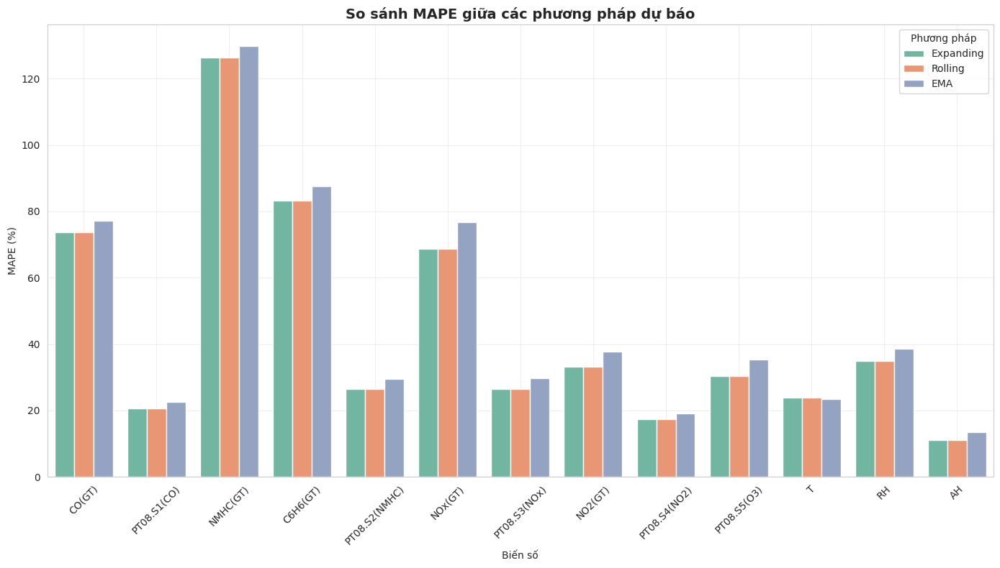

In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Hàm dự báo EMA có xử lý chỉ mục thời gian
def ema_forecast(train, horizon):
    train = train.copy()

    # Gán lại index nếu chưa phải DatetimeIndex hoặc thiếu freq
    if not isinstance(train.index, pd.DatetimeIndex):
        train.index = pd.date_range(start='2000-01-01', periods=len(train), freq='D')
    elif train.index.freq is None:
        inferred_freq = pd.infer_freq(train.index)
        if inferred_freq:
            train.index = train.index.to_period(inferred_freq).to_timestamp()
        else:
            train.index = pd.date_range(start=train.index[0], periods=len(train), freq='D')

    model = ExponentialSmoothing(train, trend='add', seasonal=None)
    model_fit = model.fit()
    return model_fit.forecast(horizon)

# Tính toán metrics cho EMA
ema_results = []
for col in df_eval.columns:
    series = df_eval[col].dropna()
    if len(series) >= initial_train_size + horizon + 5:
        try:
            ema_avg = expanding_window_cv(series, ema_forecast, initial_train_size, horizon, step)
            ema_results.append({
                'Biến': col,
                'MAE': ema_avg['MAE'],
                'MSE': ema_avg['MSE'],
                'RMSE': ema_avg['RMSE'],
                'MAPE': ema_avg['MAPE'],
                'Phương pháp': 'EMA'
            })
        except Exception as e:
            print(f"❌ Lỗi với biến {col}: {e}")

# Kết hợp kết quả
all_results = pd.concat([
    cv_results_df,
    pd.DataFrame(ema_results)
], ignore_index=True)

# Vẽ biểu đồ so sánh (đã sửa lỗi FutureWarning)
plt.figure(figsize=(14, 8))
sns.barplot(data=all_results, x='Biến', y='MAPE', hue='Phương pháp',
            palette='Set2', errorbar=None)  # <-- sửa lỗi cảnh báo ở đây
plt.title('So sánh MAPE giữa các phương pháp dự báo', fontsize=14, fontweight='bold')
plt.xticks(rotation=45)
plt.ylabel('MAPE (%)')
plt.xlabel('Biến số')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# **📚 16. SIMPLE EXPOTENTIAL SMOOTHING (SES) FROM 2004-03-15 TO 2004-03-20**



=== SIMPLE EXPONENTIAL SMOOTHING (2004-03-15 đến 2004-03-20) ===

Đang áp dụng SES cho CO(GT)...
Alpha tối ưu: 1.0000


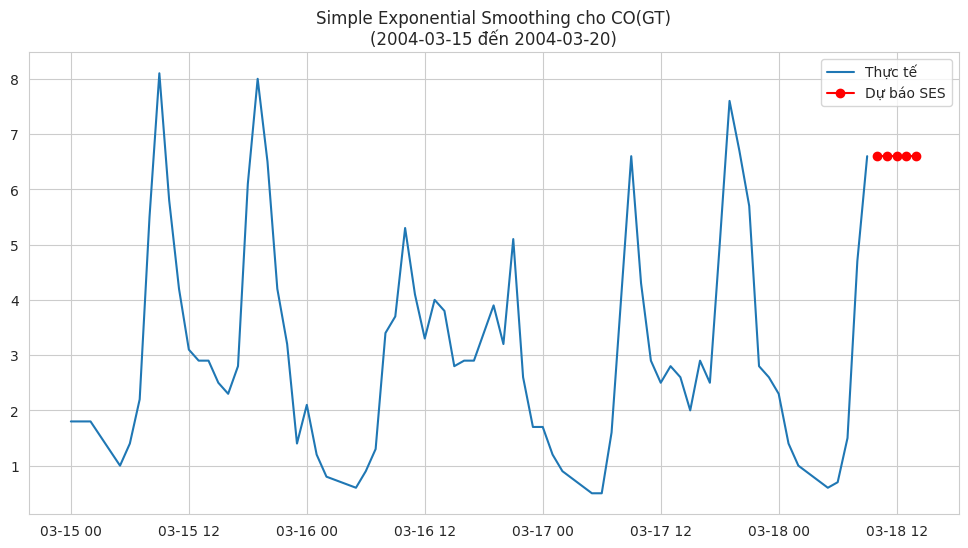

MAE: 1.9733, MAPE: 0.9662%
Lỗi khi áp dụng SES cho CO(GT): -1



Đang áp dụng SES cho PT08.S1(CO)...
Alpha tối ưu: 0.9950


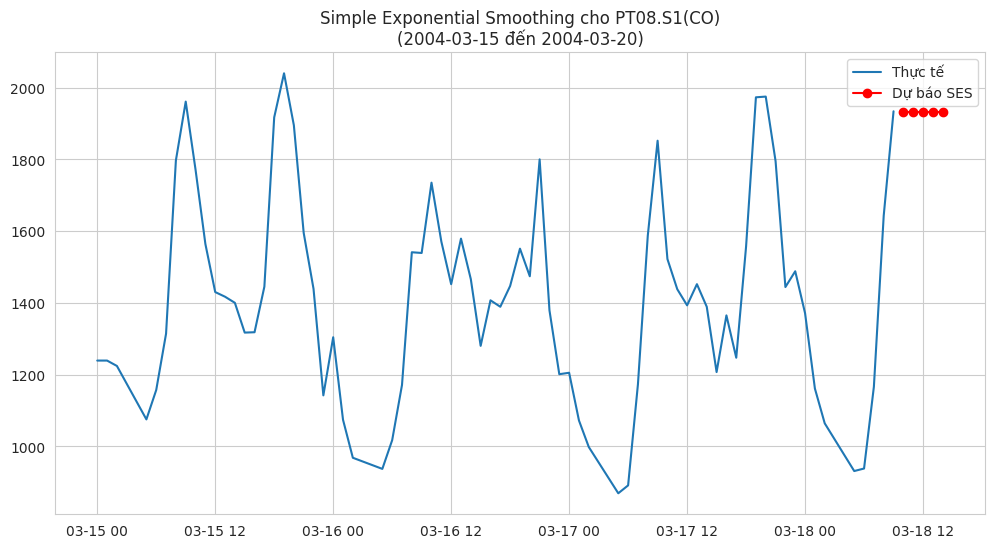

MAE: 305.3571, MAPE: 0.2153%
Lỗi khi áp dụng SES cho PT08.S1(CO): -1



Đang áp dụng SES cho NMHC(GT)...
Alpha tối ưu: 1.0000


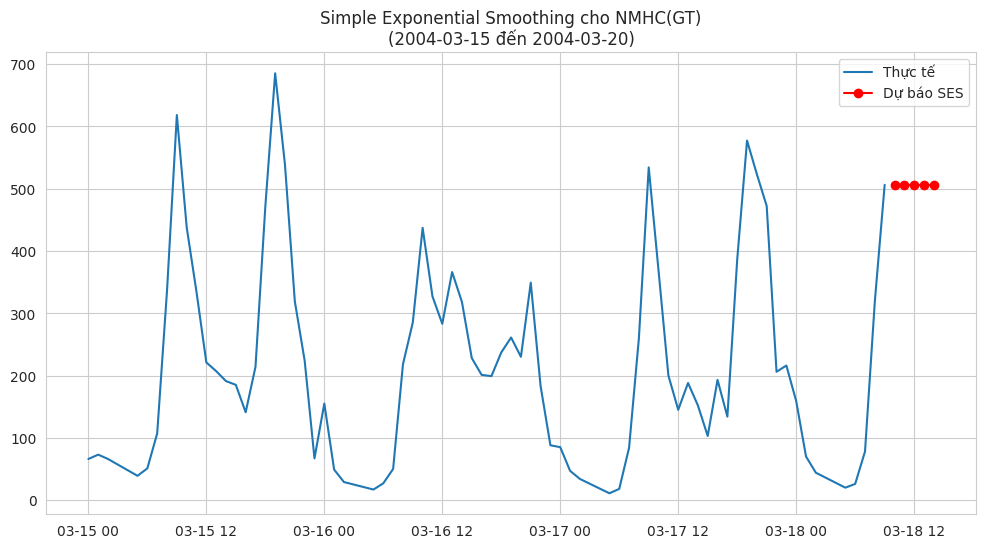

MAE: 165.4000, MAPE: 1.7277%
Lỗi khi áp dụng SES cho NMHC(GT): -1



Đang áp dụng SES cho C6H6(GT)...
Alpha tối ưu: 1.0000


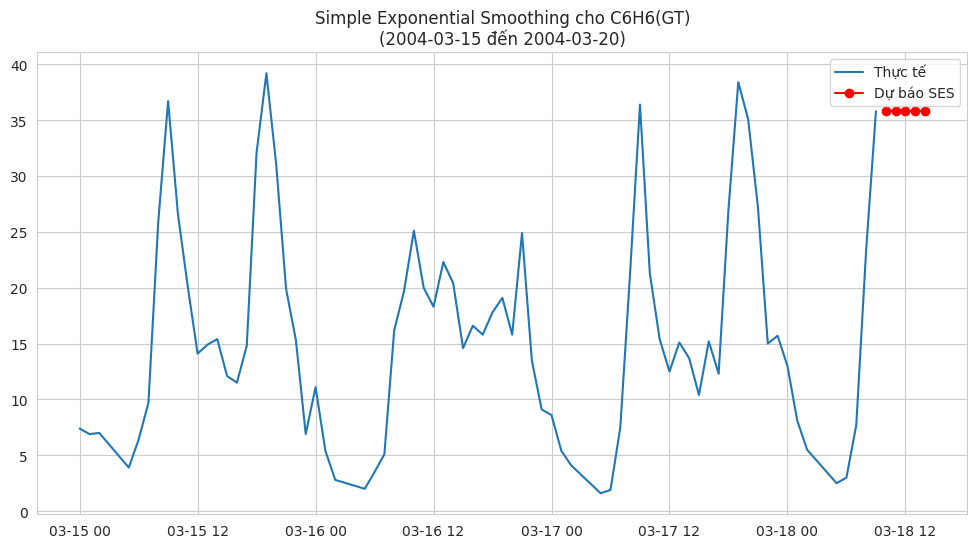

MAE: 10.0400, MAPE: 1.0789%
Lỗi khi áp dụng SES cho C6H6(GT): -1



Đang áp dụng SES cho PT08.S2(NMHC)...
Alpha tối ưu: 0.9950


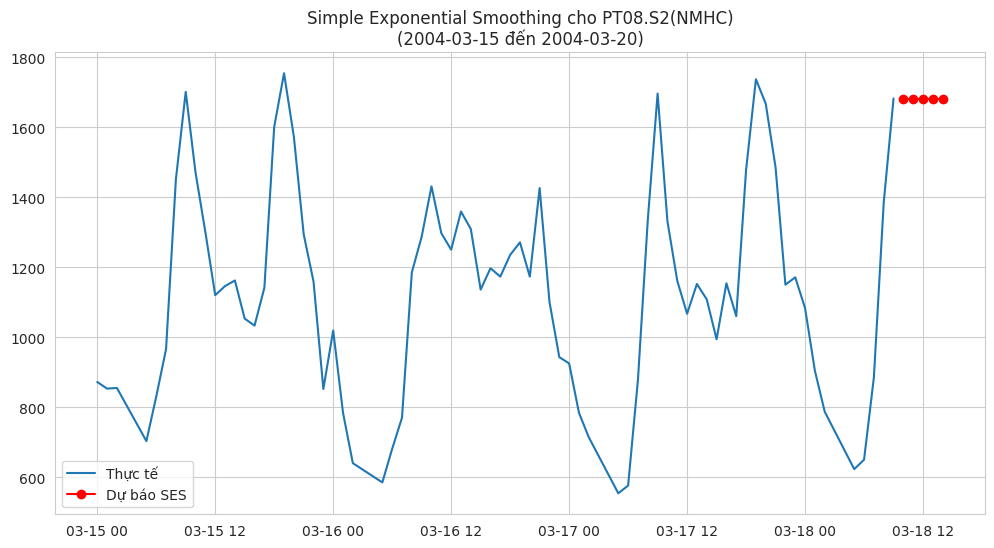

MAE: 307.6802, MAPE: 0.2939%
Lỗi khi áp dụng SES cho PT08.S2(NMHC): -1



Đang áp dụng SES cho NOx(GT)...
Alpha tối ưu: 0.9950


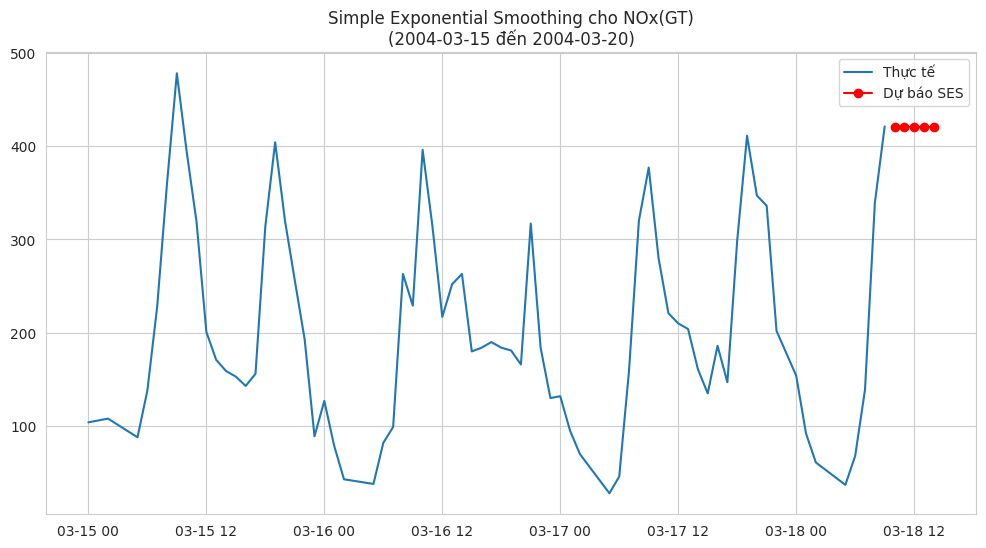

MAE: 110.9830, MAPE: 0.8397%
Lỗi khi áp dụng SES cho NOx(GT): -1



Đang áp dụng SES cho PT08.S3(NOx)...
Alpha tối ưu: 0.9950


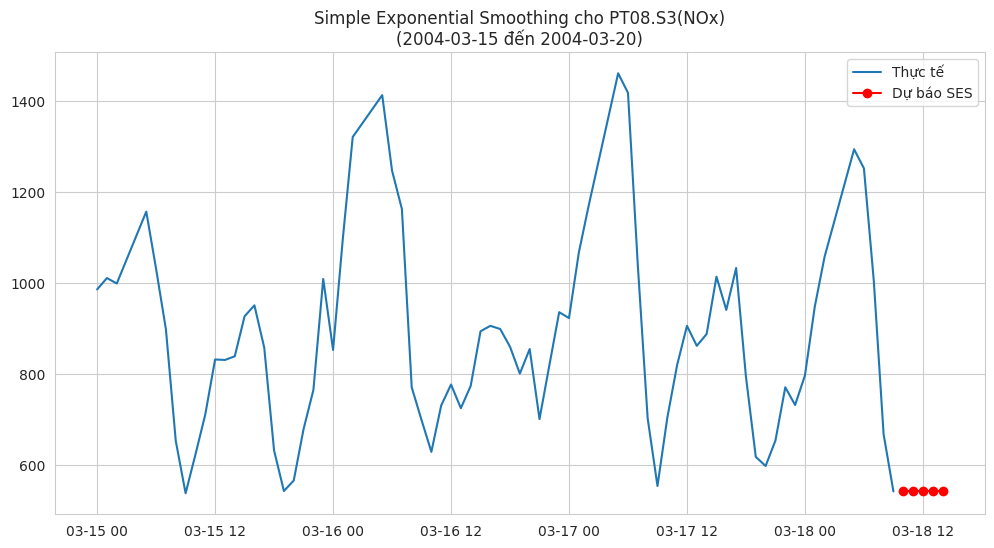

MAE: 216.0000, MAPE: 0.2901%
Lỗi khi áp dụng SES cho PT08.S3(NOx): -1



Đang áp dụng SES cho NO2(GT)...
Alpha tối ưu: 1.0000


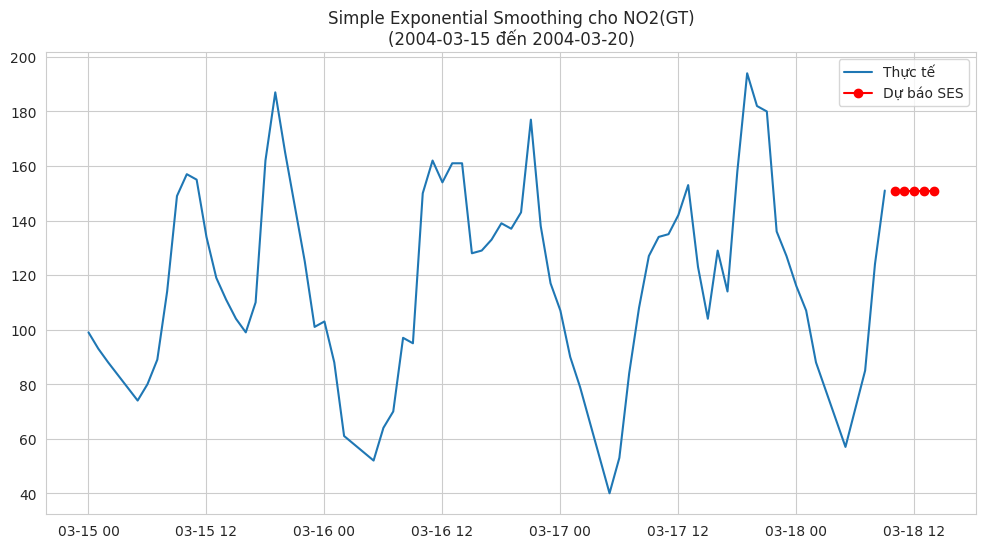

MAE: 33.2667, MAPE: 0.3239%
Lỗi khi áp dụng SES cho NO2(GT): -1



Đang áp dụng SES cho PT08.S4(NO2)...
Alpha tối ưu: 1.0000


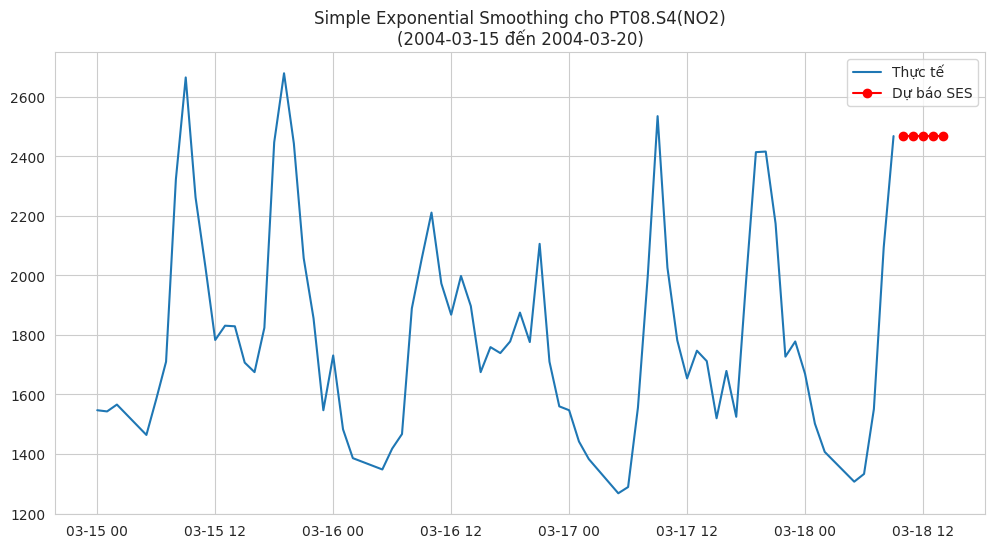

MAE: 338.6527, MAPE: 0.1757%
Lỗi khi áp dụng SES cho PT08.S4(NO2): -1



Đang áp dụng SES cho PT08.S5(O3)...
Alpha tối ưu: 0.9950


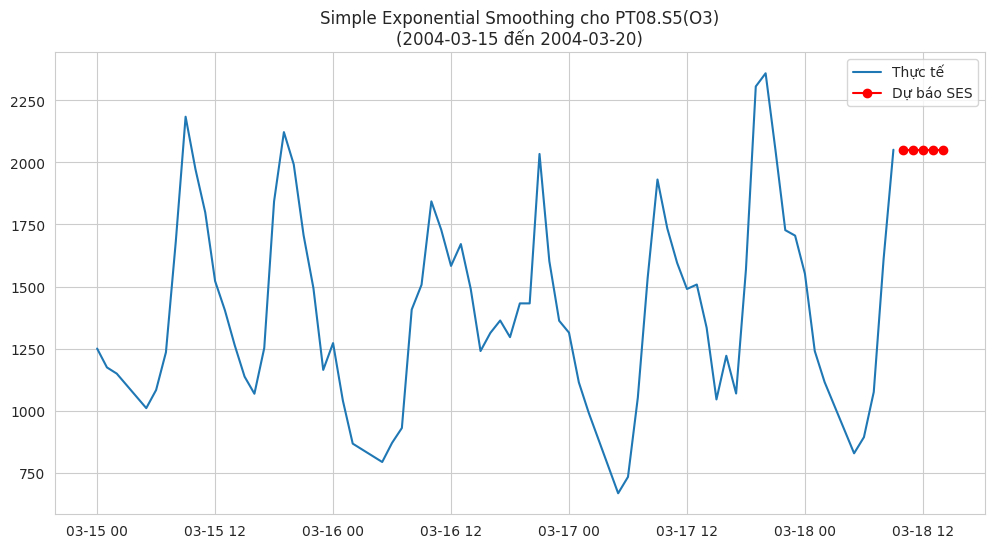

MAE: 472.4909, MAPE: 0.2831%
Lỗi khi áp dụng SES cho PT08.S5(O3): -1



Đang áp dụng SES cho T...
Alpha tối ưu: 1.0000


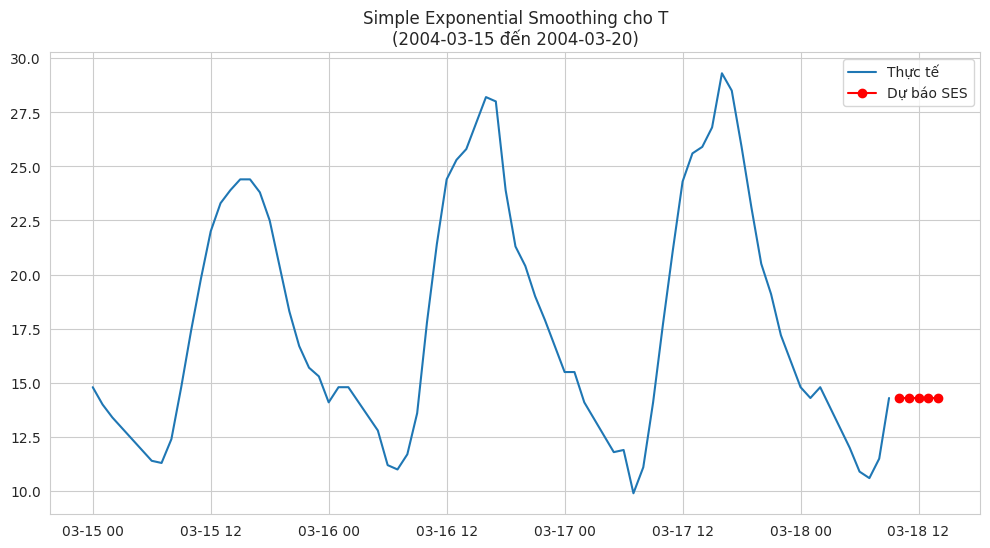

MAE: 12.4000, MAPE: 0.8950%
Lỗi khi áp dụng SES cho T: -1



Đang áp dụng SES cho RH...
Alpha tối ưu: 1.0000


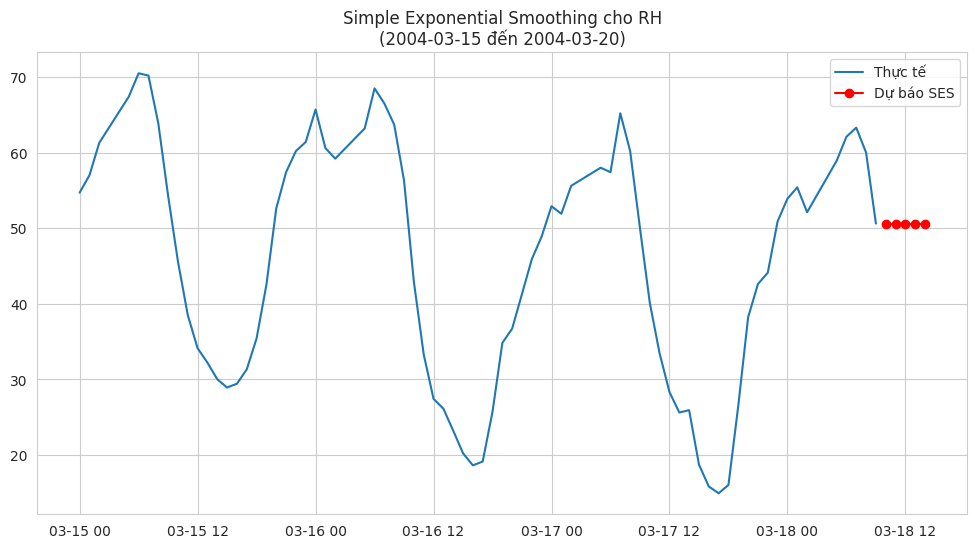

MAE: 30.2867, MAPE: 0.5863%
Lỗi khi áp dụng SES cho RH: -1



Đang áp dụng SES cho AH...
Alpha tối ưu: 1.0000


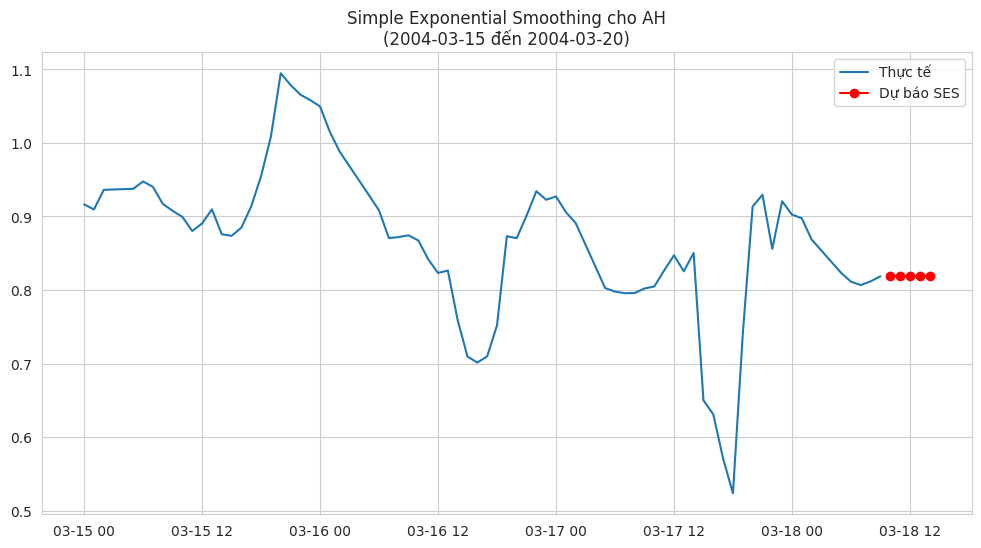

MAE: 0.2043, MAPE: 0.2442%
Lỗi khi áp dụng SES cho AH: -1


In [84]:
print("\n\n=== SIMPLE EXPONENTIAL SMOOTHING (2004-03-15 đến 2004-03-20) ===")

import warnings
warnings.simplefilter("ignore")
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display, HTML

# Lọc dữ liệu trong khoảng thời gian mong muốn
time_range = (df.index >= start_date) & (df.index <= end_date)
df_period = df.loc[time_range]

# Áp dụng SES cho từng biến
for col in df_period.columns:
    try:
        print(f"\nĐang áp dụng SES cho {col}...")
        series = df_period[col].dropna()

        if len(series) >= 5:
            # Fit mô hình
            model = SimpleExpSmoothing(series).fit()
            alpha = model.model.params['smoothing_level']
            print(f"Alpha tối ưu: {alpha:.4f}")

            # Dự báo 5 bước
            forecast = model.forecast(5)

            # Vẽ đồ thị
            plt.figure(figsize=(12, 6))
            plt.plot(series.index, series, label='Thực tế')
            plt.plot(pd.date_range(series.index[-1], periods=6, freq='h')[1:],
                     forecast, label='Dự báo SES', color='red', marker='o')
            plt.title(f'Simple Exponential Smoothing cho {col}\n({start_date} đến {end_date})')
            plt.legend()
            plt.grid(True)
            plt.show()

            # Tính độ chính xác nếu đủ dữ liệu
            commentary = ""
            if len(series) >= 10:
                train_size = int(len(series) * 0.8)
                train, test = series[:train_size], series[train_size:]
                model_train = SimpleExpSmoothing(train).fit()
                forecast_test = model_train.forecast(len(test))

                mae = mean_absolute_error(test, forecast_test)
                mape = mean_absolute_percentage_error(test, forecast_test)
                print(f"MAE: {mae:.4f}, MAPE: {mape:.4f}%")

                commentary += f"<b>Đánh giá:</b> Sai số MAE là {mae:.4f} và MAPE là {mape:.2f}%. "
            else:
                commentary += f"<b>Ghi chú:</b> Không đủ dữ liệu để đánh giá sai số (chỉ có {len(series)} điểm). "

            # Nhận xét xu hướng dự báo
            trend = "tăng" if forecast[-1] > forecast[0] else "giảm" if forecast[-1] < forecast[0] else "ổn định"
            commentary += f"<b>Xu hướng dự báo:</b> Chuỗi thời gian có xu hướng <span style='color:blue'>{trend}</span> trong 5 giờ tiếp theo."

            # Hiển thị nhận xét
            display(HTML(f"<div style='padding:10px; background:#f9f9f9; border-left: 5px solid #00bcd4;'><p>{commentary}</p></div>"))

        else:
            print(f"Không đủ dữ liệu cho {col} (chỉ có {len(series)} quan sát)")

    except Exception as e:
        print(f"Lỗi khi áp dụng SES cho {col}: {str(e)}")

    # Dòng phân cách HTML
    display(HTML("<hr style='border:1px solid #ccc; margin: 20px 0;'>"))
